In [ ]:
!pwd

/content/drive/MyDrive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !cd datasets
!ls

'6CS012 - Artificial Intelligence and ML'   data      'Getting started.pdf'   Models
'Colab Notebooks'			    datasets   Model		      rotated_image_4.jpg


In [ ]:
pip install unrar

  Obtaining dependency information for unrar from https://files.pythonhosted.org/packages/bb/0b/53130ccd483e3db8c8a460cb579bdb21b458d5494d67a261e1a5b273fbb9/unrar-0.4-py3-none-any.whl.metadata
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install patool pyunpack

  Obtaining dependency information for pyunpack from https://files.pythonhosted.org/packages/72/20/5a6dcb0d28529ce6efe850755994c80817279eecf08620003775fda3b914/pyunpack-0.3-py2.py3-none-any.whl.metadata
  Obtaining dependency information for easyprocess from https://files.pythonhosted.org/packages/9c/cf/27d1f4b3bae5e566f94fc716e048120128cf603d5163638d22bcd0fc92d8/EasyProcess-1.1-py3-none-any.whl.metadata
  Obtaining dependency information for entrypoint2 from https://files.pythonhosted.org/packages/42/ee/84c8990b08efa0265bd10fc8781ef26e3157715bf0dfa47ee3c056b513d4/entrypoint2-1.1-py2.py3-none-any.whl.metadata
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import zipfile
import os

def extract_zip(zip_file, extract_folder):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_folder)

# Example usage:
zip_file = 'datasets/Devanagari datasets2.zip'
extract_folder = 'datasets/'

extract_zip(zip_file, extract_folder)


In [ ]:
from tqdm import tqdm
import os

def read_text(txt_path):
  # Read the content of lines.txt
  with open(txt_path, "r") as txt_file:
    lines = txt_file.readlines()
  text = []
  for line in tqdm(lines):
    if not line.strip():
      continue
    text.append(line)
  return text


In [ ]:
text = " | "
stripped_text = not text.strip()
print(stripped_text)  # Output: "Hello, World!"


False



 128 712
1


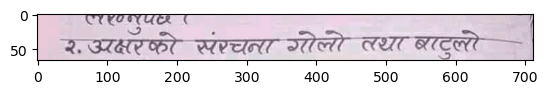


 176 712
4


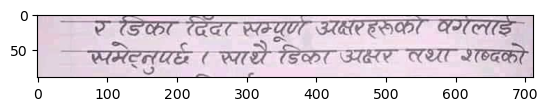


 44 704
5


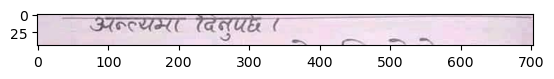


 71 712
6


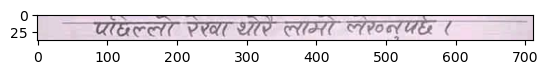


 41 712
7


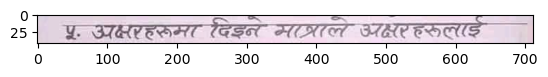


 54 712
8


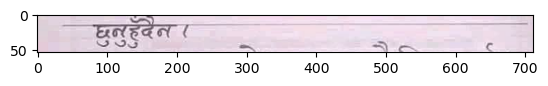


 35 712
9


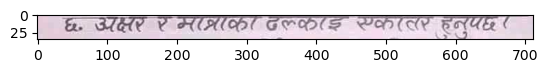


 31 712
10


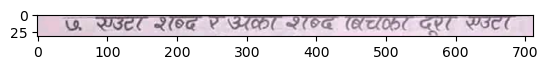


 42 557
12


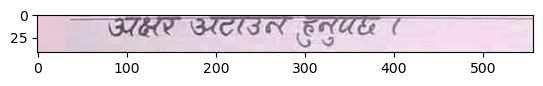


 71 712
13


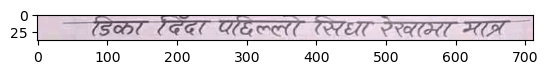


 40 358
14


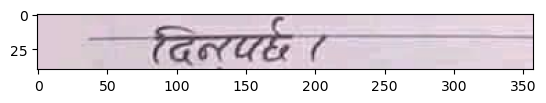


 56 712
15


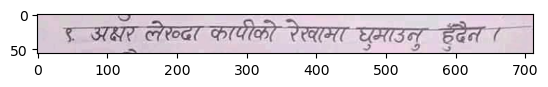


 39 455
16


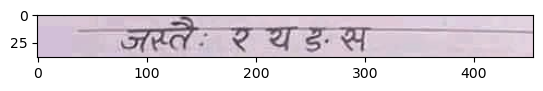

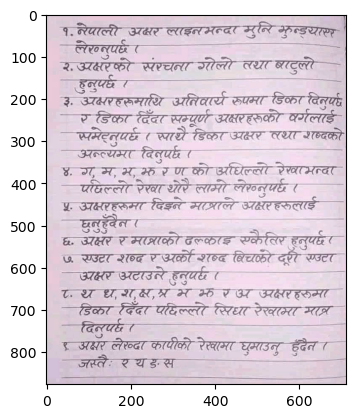

In [ ]:
%matplotlib inline
#The line above is necesary to show Matplotlib's plots inside a Jupyter Notebook
import cv2
from matplotlib import pyplot as plt
import numpy as np

if __name__ == "__main__":
    image = cv2.imread('datasets/nepali_handwritten.jpg')

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Convert grayscale image to binary
    ret, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)

    # Apply Canny edge detection
    edges = cv2.Canny(thresh, 50, 100)

    # Dilation
    kernel = np.ones((5, 300), np.uint8)
    img_dilation = cv2.dilate(edges, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Sort contours based on their bounding box coordinates
    bounding_boxes = [cv2.boundingRect(ctr) for ctr in contours]
    sorted_contours = [ctr for _, ctr in sorted(zip(bounding_boxes, contours), key=lambda pair: pair[0][1])]

    # Loop over sorted contours
    k = 0
    for i, ctr in enumerate(sorted_contours):
        # Get bounding box
        x, y, w, h = cv2.boundingRect(ctr)

        # Getting ROI
        roi = image[y:y+h+3, x:x+w]
        roi_row, roi_col, _ = roi.shape  # Get ROI dimensions

        # Show ROI
        if roi_row > 3000 or roi_row <= 20 or roi_row <= 10 or roi_col <= 110:
            continue

        print('\n', roi_row, roi_col)
        print(i)

        if h > 60:
            # Split ROI into two separate ROIs vertically
            roi1 = roi[:h//2, :]
            roi2 = roi[h//2:, :]

            # Display each ROI and associated text
            plt.imshow(roi1)
            plt.imshow(roi2)
            plt.show()
            k += 2
        else:
            # Display single ROI and associated text
            plt.imshow(roi)
            plt.show()
            k += 1

    # Display the original image
    plt.imshow(image)
    plt.show()

In [ ]:
!pip uninstall PIL
!pip install PIL

ERROR: Could not find a version that satisfies the requirement PIL (from versions: none)
ERROR: No matching distribution found for PIL


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from tqdm import tqdm
import os
import csv

class TextExtractor:
  def __init__(self,image_path, text_path,image_output_dir):
    self.image = cv2.imread(image_path)
    self.text_path = text_path
    self.lines = self.read_text(text_path)
    self.image_output_dir = image_output_dir
    self.data = []

  def read_text(self,txt_path):
    # Read the content of lines.txt
    with open(txt_path, "r") as txt_file:
      lines = txt_file.readlines()
    text = []
    for line in tqdm(lines):
      if not line.strip():
        continue
      text.append(line)
    return text

  def preprocess_image(self):
    #convert image to grayscale
    gray = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)

    #Convert grayscale image to binary
    ret, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)

    #Dilation
    kernel = np.ones((5,200), np.uint8)
    self.img_dilation = cv2.dilate(thresh, kernel, iterations=1)

  def extract_text_regions(self):
    if not os.path.exists(self.image_output_dir):
      os.makedirs(self.image_output_dir)

     #Apply Canny edge detection
    # edges = cv2.Canny(self.img_dilation,50,150)

    contours, _ = cv2.findContours(self.img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    bounding_boxes = [cv2.boundingRect(ctr) for ctr in ]
    sorted_contours = [ctr for _, ctr in sorted(zip(bounding_boxes, edges), key=lambda pair: pair[0][1])]
    k = 0

    for i, ctr in enumerate(sorted_contours):
      x, y, w, h = cv2.boundingRect(ctr)
      #getting ROI
      roi = self.image[y:y+h,x:x+w]
      roi_row,roi_col, _ = roi.shape

      #ignoring irrevelent noises
      if roi_row>3000 or roi_row<=20 or roi_row<=10 or roi_col<=110:
        continue
      # print(i)
      # print('\n',roi_row, roi_col)

      if h > 60:
        # Split ROI into two separate ROIs vertically
        roi1 = roi[:h//2, :]
        roi2 = roi[h//2:, :]

        # # Display each ROI and associated text
        # print(self.lines[k])
        # cv2_imshow(roi1)
        self.save_roi_image(roi1, self.lines[k])
        self.save_roi_image(roi2, self.lines[k+1])

        # Update rectangle for the first ROI
        cv2.rectangle(self.image, (x, y), (x + w, y + h//2), (90, 0, 255), 2)

         # Update rectangle for the second ROI
        cv2.rectangle(self.image, (x, y + h//2), (x + w, y + h), (90, 0, 255), 2)

        k += 2
      else:
        # Display single ROI and associated text
        # print(self.lines[k])
        # cv2_imshow(roi)

        self.save_roi_image(roi,self.lines[k])
        # Update rectangle for the ROI
        cv2.rectangle(self.image, (x, y), (x + w, y + h), (90, 0, 255), 2)

        k += 1

    cv2_imshow(self.image)

  def save_roi_image(self, roi, text):
    # Extract the file name (excluding extension) from the text path
    file_name = os.path.splitext(os.path.basename(self.text_path))[0]

    # Create the directory path for the text file name
    directory = os.path.join(self.image_output_dir, file_name)
    if not os.path.exists(directory):
        os.makedirs(directory)

    # Generate a unique image filename based on the current count of saved images
    image_filename = f"{file_name}-{len(self.data) + 1:02d}.png"

    # Save the ROI image inside the directory
    image_path = os.path.join(directory, image_filename)
    cv2.imwrite(image_path, roi)

    # Append the image path and text label to the data list
    self.data.append([image_path, text])

  def save_to_csv(self,csv_output_file='segmented_lines.csv'):
    with open(csv_output_file,"w",newline='') as csvfile:
      csv_writer = csv.writer(csvfile)
      csv_writer.writerow(['Path','Label'])
      csv_writer.writerows(self.data)

if __name__ == "__main__":
    extractor = TextExtractor('datasets/Devanagari datasets/images/0007_jpg.rf.237702ef480bbb9966e19287679d476a.jpg', 'datasets/Devanagari datasets/annotations/0007.txt', 'datasets/test')
    extractor.preprocess_image()
    extractor.extract_text_regions()
    # extractor.save_to_csv('datasets/segmented_lines.csv')


In [ ]:
# %cd drive/MyDrive/
!ls

'6CS012 - Artificial Intelligence and ML'   data      'Getting started.pdf'   Models
'Colab Notebooks'			    datasets   Model		      rotated_image_4.jpg


In [ ]:
import pandas as pd
image_df = pd.read_csv('datasets/segmented_lines.csv')
image_df.head(10)

FileNotFoundError: [Errno 2] No such file or directory: 'datasets/segmented_lines.csv'

In [ ]:
len(image_df)

29

In [ ]:
!pip uninstall opencv-python
!pip install opencv-python-headless

Found existing installation: opencv-python 4.8.0.76
Uninstalling opencv-python-4.8.0.76:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/cv2/*
    /usr/local/lib/python3.10/dist-packages/opencv_python-4.8.0.76.dist-info/*
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Core-39545cc7.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Gui-a7aedf18.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Test-c38a5234.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Widgets-e69d94fb.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5XcbQpa-5b2d853e.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libX11-xcb-69166bdf.so.1.0.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libXau-00ec42fe.so.6.0.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libavcodec-402e4b05.so.59.37.100
    /usr/local/lib/py

In [ ]:
import cv2
import numpy as np
from tqdm import tqdm
import os
import csv
from matplotlib import pyplot as plt
%matplotlib inline

class TextExtractor:
  def __init__(self,image_path, text_path,image_output_dir):
    self.image = cv2.imread(image_path)
    self.text_path = text_path
    self.lines = self.read_text(text_path)
    self.image_output_dir = image_output_dir
    self.data = []

    self.dataset = []
    self.vocab = set()
    self.maxlen = 0

  def read_text(self,txt_path):
    # Read the content of lines.txt
    with open(txt_path, "r") as txt_file:
      lines = txt_file.readlines()
    text = []
    for line in lines:
      if not line.strip():
        continue
      text.append(line)
    return text

  def preprocess_image(self):
    #convert image to grayscale
    gray = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)

    #Convert grayscale image to binary
    ret, thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV)

    #Apply Canny edge detection
    edges = cv2.Canny(thresh,50,150)

    #Dilation
    kernel = np.ones((5, 400), np.uint8)
    self.img_dilation = cv2.dilate(edges, kernel, iterations=1)

  def extract_text_regions(self):
    if not os.path.exists(self.image_output_dir):
      os.makedirs(self.image_output_dir)

     # Check if the first four characters of the file name belong to the ignored list
    ignored_files = {'0009', '0007', '0017', '0004', '0052', '0022', '0019', '0051', '0003', '0012','0131','0140','0142','0188','0200','0288','0300','0303','0361'}
    file_name = os.path.splitext(os.path.basename(self.text_path))[0]
    if file_name[:4] in ignored_files:
        print(f"Ignored file: {self.text_path}")
        return
    contours, _ = cv2.findContours(self.img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    bounding_boxes = [cv2.boundingRect(ctr) for ctr in contours]
    sorted_contours = [ctr for _, ctr in sorted(zip(bounding_boxes, contours), key=lambda pair: pair[0][1])]
    k = 0

    for i, ctr in enumerate(sorted_contours):
      x, y, w, h = cv2.boundingRect(ctr)
      #getting ROI
      roi = self.image[y:y+h,x:x+w]
      roi_row,roi_col, _ = roi.shape

      #ignoring irrevelent noises
      if roi_row>3000 or roi_row<=20 or roi_row<=10 or roi_col<=110:
        continue
      # print(i)
      # print('\n',roi_row, roi_col)

      if h > 60:
        # Split ROI into two separate ROIs vertically
        roi1 = roi[:h//2, :]
        roi2 = roi[h//2:, :]

        # # Display each ROI and associated text
        # print(self.lines[k])
        # cv2_imshow(roi1)
        self.save_roi_image(roi1, self.lines[k])
        self.save_roi_image(roi2, self.lines[k+1])

        # Update rectangle for the first ROI
        cv2.rectangle(self.image, (x, y), (x + w, y + h//2), (90, 0, 255), 2)

         # Update rectangle for the second ROI
        cv2.rectangle(self.image, (x, y + h//2), (x + w, y + h), (90, 0, 255), 2)

        k += 2
      else:
        # Display single ROI and associated text
        # print(self.lines[k])
        # cv2_imshow(roi)

        self.save_roi_image(roi,self.lines[k])
        # Update rectangle for the ROI
        cv2.rectangle(self.image, (x, y), (x + w, y + h), (90, 0, 255), 2)

        k += 1
     # Print the whole text for each image
    print("Text for each image:")
    for line in self.lines:
        print(line)

    plt.imshow(self.image)
    plt.show()

  def save_roi_image(self, roi, text):
    # Extract the file name (excluding extension) from the text path
    file_name = os.path.splitext(os.path.basename(self.text_path))[0]

    # Create the directory path for the text file name
    directory = os.path.join(self.image_output_dir, file_name)
    if not os.path.exists(directory):
        os.makedirs(directory)

    # Generate a unique image filename based on the current count of saved images
    image_filename = f"{file_name}-{len(self.data) + 1:02d}.png"

    # Save the ROI image inside the directory
    image_path = os.path.join(directory, image_filename)
    cv2.imwrite(image_path, roi)

    # Append the image path and text label to the data list
    self.data.append([image_path, text])

    self.dataset.append([image_path,text])
    self.vocab.update(list(text))
    self.maxlen = max(self.maxlen,len(text))

  def save_to_csv(self,csv_output_file='segmented_lines.csv'):
    with open(csv_output_file,"w",newline='') as csvfile:
      csv_writer = csv.writer(csvfile)
      csv_writer.writerow(['Path','Label'])
      csv_writer.writerows(self.data)


Text for each image:
|| ॐ श्री परमात्मने नमः ||

|| अथ श्रीमद्भगवद्गीता ||

|| यथार्थ गीता ||

|| अथ प्रथमोऽध्याय: ||

धृतराष्ट्र उवाच

धर्मक्षेत्रे कुरुक्षेत्रे समबेता युयुत्सव:।

मामका: पाण्डवाश्चैव किमकुर्वत सञ्जय।। १।।

धृतराष्ट्र ने पूछा- “हे संजय ! धर्मक्षेत्र, कुरुक्षेत्र में एकत्र युद्ध की

इच्छावाले मेरे और पाण्डु के पुत्रों ने क्‍या किया?”

अज्ञानरूपी धृतराष्ट्र और संयमरूपी संजय। अज्ञान मन के अन्तराल में

रहता है। अज्ञान से आवृत्त मन धृतराष्ट्र जन्मान्ध है; किन्तु संयमरूपी संजय के

माध्यम से वह देखता है, सुनता है और समझता है कि परमात्मा ही सत्य है,

फिर भी जब तक इससे उत्पन्न मोहरूपी दुर्योधन जीवित है इसकी दृष्टि सदैव

कौरवों पर रहती है, विकारों पर ही रहती है।

शरीर एक क्षेत्र है। जब हृदय-देश में दैवी सम्पत्ति का बाहुलय होता है

तो यह शरीर धर्मक्षेत्र बन जाता है और जब इसमें आसुरी सम्पत्ति का बाहुल्‍य

होता है तो यह शरीर कुरुक्षेत्र बन जाता है। 'कुरु' अर्थात्‌ करो- यह शब्द

आदेशात्मक है। श्रीकृष्ण कहते हैं- प्रकृति से उत्पन्न तीनों गुणों द्वारा परवश

होकर मनुष्य कर्म करता है। व

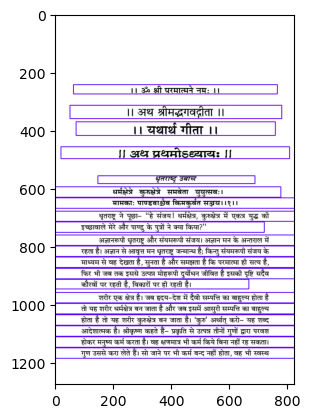

Text for each image:
२‌ श्रीमद्भगवद्गीता : यथार्थ गीता

शरीर की आवश्यक खुराक मात्र है। तीनों गुण मनुष्य को देवता से कीटपर्यन्त

शरीरों में ही बाँधते हैं। जब तक प्रकृति और प्रकृति से उत्पन्न गुण जीवित हैं,

तब तक “कुरु/ लगा रहेगा। अतः जन्म-मृत्युवाला क्षेत्र, विकारोंजाला क्षेत्र

कुरुक्षेत्र है और परमधर्म परमात्मा में प्रवेश दिलानेवाली पुण्यमयी प्रवृत्तियों

(पाण्डवों) का क्षेत्र धर्मक्षेत्र है।

पुरातत्त्वविद्‌ पंजाब में, काशी-प्रयाग के मध्य तथा अनेकानेक स्थलों

पर कुरुक्षेत्र की शोध में लगे हैं; किन्तु गीताकार ने स्वयं बताया है कि जिस

क्षेत्र में यह युद्ध हुआ, वह कहाँ है। 'इदं शरीर कौन्तेय क्षेत्रमित्यभिधीयते। '

( अ० १३/१ ) “अर्जुन! यह शरीर ही क्षेत्र है और जो इसको जानता है,

इसका पार पा लेता है, वह क्षेत्रज्ञ है।” आगे उन्होंने क्षेत्र का विस्तार बताया,

जिसमें दस इन्द्रियाँ, मन, बुद्धि, अहंकार, पाँचों विकार और तीनों गुणों का

वर्णन है। शरीर ही क्षेत्र है, एक अखाड़ा है। इसमें लड़नेवाली प्रवृत्तियाँ दो हैं-

“दैवी सम्पद! और “आसुरी सम्पद', 'पाण्दु की सन्‍्तान' और 'धृतराष्ट्र की

सन्‍्

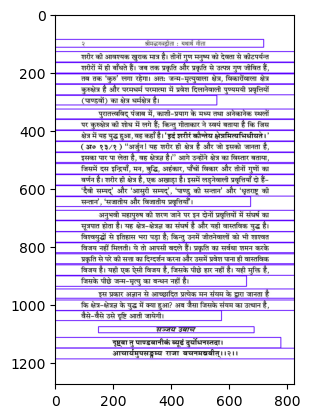

Ignored file: datasets/Devanagari datasets/annotations/0003.txt
Ignored file: datasets/Devanagari datasets/annotations/0004.txt
Text for each image:
प्रथम अध्याय ५

द्विजोत्तम ! हमारे पक्ष में जो-जो प्रधान हैं, उन्हें भी आप समझ लें।

आपको जानने के लिये मेरी सेना के जो-जो नायक हैं, उनको कहता हूँ।

बाह्य युद्ध में सेनापति के लिये 'द्विजोत्तम' सम्बोधन असामयिक है।

वस्तुतः “गीता' में अन्तःकरण की दो प्रवृत्तियों का संघर्ष है। जिसमें ट्वैत का

आचरण ही 'द्रोण' है। जब तक हम लेशमात्र भी आराध्य से अलग हैं, तब

तक प्रकृति विद्यमान है, द्वैत बना है। इस 'द्वि' पर जय पाने की प्रेरणा प्रथम गुरु

द्रोणाचार्य से मिलती है। अधूरी शिक्षा ही पूर्ण जानकारी के लिये प्रेरणा प्रदान

करती है। वह पूजास्थली नहीं, वहाँ शौर्यसूचक सम्बोधन होना चाहिये।

विजातीय प्रवृत्ति के नायक कौन-कौन हैं?-

भवान्भीष्मश्च कर्णश्न कृपश्च समितिझ्ञय:।

अश्वत्थामा विकर्णश्र सौमदत्तिस्तथैव च।।८।।

एक तो स्वयं आप (द्वैत के आचरणरूपी द्रोणाचार्य) हैं, भ्रमरूपी

पितामह 'भीष्म' हैं। भ्रम इन विकारों का उद्गम है। अन्त तक जीवित रहता है,

इसलिये

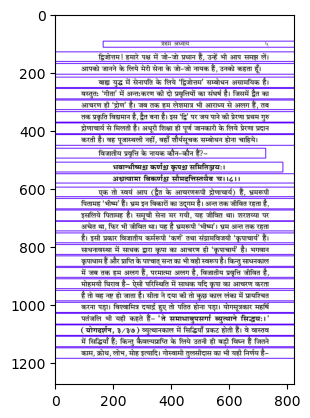

Text for each image:
६ श्रीमद्भगवद्गीता : यथार्थ गीता

छोरत ग्रन्थि जानि खगराया। ब्रिघ्न अनेक करइ तब माया।।

रिद्धि सिद्धि प्रेरड बहु भाई। बुद्धिहि लोभ दिखावहिं आई।।

( रामचरितमानस, ७/११७/६-७ )

माया अनेक विघ्न करती है, ऋद्धियाँ प्रदान करती है, यहाँ तक कि

सिद्ध बना देती है। ऐसी अवस्थावाला साधक बगल से निकल भर जाय,

मरणासन्न रोगी भी जी उठेगा। वह भले ठीक हो जाय, किन्तु साधक उसे

अपनी देन मान बैठे तो नष्ट हो जायेगा। एक रोगी के स्थान पर हजारों रोगी घेर

लेंगे, भजन-चिन्तन का क्रम अवरुद्ध हो जायेगा और उधर बहकते-बहकते

प्रकृति का बाहुलय हो जायेगा। यदि लक्ष्य दूर है और साधक कृपा करता है तो

कृपा का अकेला आचरण ही 'समितिड्जय:'- समूची सेना को जीत लेगा।

इसलिये साधक को पूर्तिपर्यन्त इससे सतर्क रहना चाहिये। “दया ब्रिनु सन्त

'कसाई, दया करी तो आफत आई।' लेकिन अधूरी अवस्था में यह विजातीय

प्रवृत्ति का दुर्धर्ष योद्धा है।

इसी प्रकार आसक्तिरूपी अश्वत्थामा। सृष्टि में कहीं भी वस्तुओं में

लगाव ही आसक्ति है। द्वैत का आचरण द्रोणाचार्य है। द्वैत ही आसक्ति का

जन्मदाता है। शस्त्र हाथ में रहते आचार्य द्रोण क

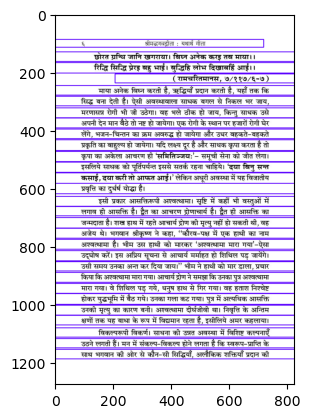

Ignored file: datasets/Devanagari datasets/annotations/0007.txt
Text for each image:
८  श्रीमद्भगवद्गीता : यथार्थ गीता

है कि भीष्म कौन-सी सत्ता है, जिस पर कौरव निर्भर करते हैं तथा भीम

कौन-सी सत्ता है, जिस पर (दैवी सम्पद्‌) सम्पूर्ण पाण्डव निर्भर हैं। दुर्योधन

अपनी व्यवस्था देता है कि-

अयनेषु च सर्वेषु यथाभागमवस्थिता:।

भीष्ममेबाभिरक्षन्तु भवन्त: सर्व एव हि।।११।।

इसलिये सब मोर्चो पर अपनी-अपनी जगह स्थित रहते हुए आप लोग

सब-के-सब भीष्म की ही सब ओरे से रक्षा करें। यदि भीष्म जीवित हैं तो हम

अजेय हैं। इसलिये आप पाण्डवों से न लड़कर केवल भीष्म की ही रक्षा करें।

कैसा योद्धा है भीष्म, जो स्वयं अपनी रक्षा नहीं कर पा रहा है, कौरवों

को उसकी रक्षा-व्यवस्था करनी पड़ रही है? यह कोई बाह्म योद्धा नहीं, भ्रम

ही भीष्म है। जब तक भ्रम जीवित है, तब तक विजातीय प्रवृत्तियाँ (कौरव)

अजेय हैं। अजेय का यह अर्थ नहीं कि जिसे जीता ही न जा सके; बल्कि

अजेय का अर्थ दुर्जय है, जिसे कठिनाई से जीता जा सकता हो।

महा अजय संसार रिपु जीति सकड सो बीर।।

(रामचरितमानस, ६//८० क )

यदि भ्रम समाप्त हो जाय तो अविद्या अस्ति

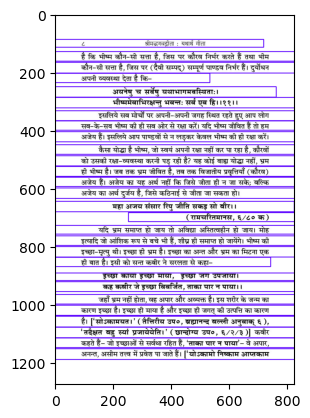

Ignored file: datasets/Devanagari datasets/annotations/0009.txt
Text for each image:
प्रथम अध्याय ११ 

ततः श्रेतैहयैर्युक्ते महति स्थन्दने स्थितौ।

माधव: पाण्डवश्चैव दिव्यौ शट्छौ प्रदध्मतु:।। १४।।

इसके उपरान्त श्वेत घोड़ों से युक्त (जिनमें लेशमात्र कालिमा, दोष नहीं

है- श्वेत सात्त्विक, निर्मलता का प्रतीक है) 'महति स्थन्दने '- महान्‌ रथ पर

बैठे हुए योगेश्वर श्रीकृष्ण और अर्जुन ने भी अलौकिक शंख बजाये। अलौकिक

का अर्थ है, लोकों से परे। मृत्युलोक, देवलोक, ब्रह्मलोक, जहाँ तक जन्म-

मरण का भय है उन समस्त लोकों से परे पारलौकिक, पारमार्थिक स्थिति

प्रदान करने की घोषणा योगेश्वर श्रीकृष्ण की है। सोने, चाँदी या काठ का रथ

नहीं; रथ अलौकिक, शंख अलौकिक, अतः घोषणा भी अलौकिक ही है।

लोकों से परे एकमात्र ब्रह्म है, सीधा उससे सम्पर्क स्थापित कराने की घोषणा

है। वे कैसे यह स्थिति प्रदान करेंगे?-

पाह्नजन्यं हषीकेशो देवदत्तं धनज्ञय:।

पौण्डूं दध्मौ महाशाङ्क भीमकर्मा वृकोदर:।।१५।।

'हषीकेश: '- जो हृदय के सर्वज्ञाता हैं, उन श्रीकृष्ण ने 'पाञ्जजन्य

शंख' बजाया। पाँचों ज्ञानेन्द्रियों को पंच तन्मात्राओं (श

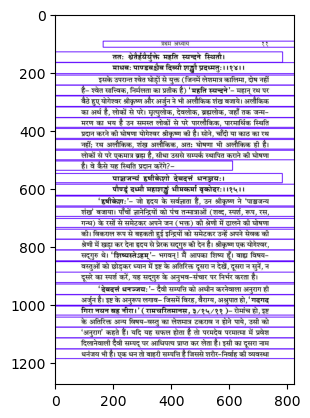

Ignored file: datasets/Devanagari datasets/annotations/0012.txt
Text for each image:
प्रथम अध्याय १३

वास्तविक सत्संग है। यह सत्संग चिन्तन, ध्यान और समाधि के अभ्यास से

सम्पन्न होता है। ज्यों-ज्यों सत्य के सान्निध्य में सुरत टिकती जायेगी, त्यों-त्यों

एक-एक श्वास पर नियंत्रण मिलता जायेगा, मनसहित इन्द्रियों का निरोध होता

जायेगा। जिस दिन सर्वथा निरोध होगा, वस्तु प्राप्त हो जायेगी। वाचद्ययन्त्रों की

तरह चित्त का आत्मा के स्वर-में-स्वर मिलाकर संगत करना ही सत्संग है।

बाह्ममणि कठोर है, किन्तु श्वासमणि पुष्प से भी कोमल है। पुष्प तो

विकसित होने या टूटने पर कुम्हलाता है; किन्तु आप अगले श्वास तक

जीवित रहने की गारण्टी नहीं दे सकते। किन्तु सत्संग सफल होने पर प्रत्येक

श्वास पर नियंत्रण दिलाकर परम लक्ष्य की प्राप्ति करा देता है। इसके आगे

पाण्डवों की कोई घोषणा नहीं है; किन्तु प्रत्येक साधन कुछ-न-कुछ निर्मलता

के पथ में दूरी तय कराता है। आगे कहते हैं-

काश्यक्ष परमेष्वास: शिखण्डी चर महारथ:।

धृष्टधूम्रो विराट सात्यकरिश्रापपाजित:।।१७।।

कायारूपी काशी। पुरुष जब सब ओर से मनसहित इन्द्रियों को समेटक

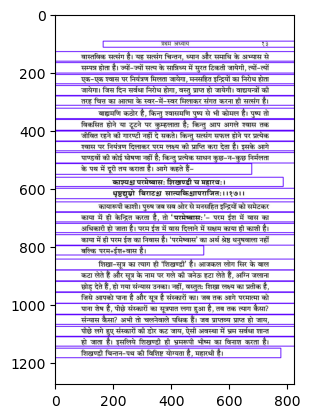

Text for each image:
१४ श्रीमद्भगवद्गीता : यथार्थ गीता

'धृष्टधूम्र: '- दृढ़ और अचल मन तथा “विराट: '- सर्वत्र विराट्‌ ईश्वर

का प्रसार देखने की क्षमता इत्यादि दैवी सम्पद्‌ के प्रमुख गुण हैं। सात्त्वकता

ही सात्यकि है। सत्य के चिन्तन की प्रवृत्ति अर्थात्‌ सात्त्विकता यदि बनी है तो

कभी गिरावट नहीं आने पायेगी। इस संघर्ष में पराजित नहीं होने देगी।

बछुपदो द्रौपदेयाश्न सर्वशः पृथिवीपते।

सौभद्रश्च महाबाहु: शद्धान्दध्मु: पृथक्पूथक्‌ ।। १८।।

अचल पददायक द्वुपद और ध्यानरूपी द्रौपदी के पाँचों पुत्र- सहदयता,

वात्सल्य, लावण्य, सौम्यता, स्थिरता इत्यादि साधन में महान्‌ सहायक महारथी

हैं तथा बड़ी भुजावाला अभिमन्यु- इन सबने पृथक्‌-पृथक्‌ शंख बजाये। भुजा

कार्य-क्षेत्र का प्रतीक है। जब मन भय से रहित हो जाता है तो उसकी पहुँच

दूर तक हो जाती है।

हे राजन्‌! इन सबने अलग-अलग शंख बजाये। कुछ-न-कुछ दूरी

सभी तय कराते हैं। इनका पालन आवश्यक है, इसलिये इनके नाम गिनाये।

इसके अतिरिक्त कुछ दूरी ऐसी भी है जो मन-बुद्धि से परे है, भगवान स्वयं ही

अन्तःकरण में विराजकर तय कराते हैं। इधर दृष्टि बनकर आत्मा से खड़े हो


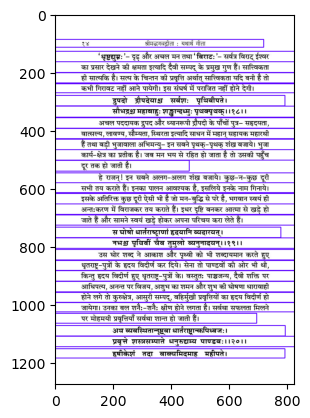

Text for each image:
प्रथम अध्याय १५

अर्जुन उबाच

सेनयोरुभयोर्मध्ये रथ स्थापय मेउच्युत।।२९।।

संयमरूपी संजय ने अज्ञान से आवृत्त मन को समझाया कि हे राजन!

इसके उपरान्त 'कपिध्वज: '- वैराग्यरूपी हनुमान, वैराग्य ही ध्वज है जिसका

(ध्वज राष्ट्र का प्रतीक माना जाता है। कुछ लोग कहते हैं- ध्वजा चंचल थी,

इसलिये कपिध्वज कहा गया। किन्तु नहीं, यहाँ कपि साधारण बन्दर नहीं

स्वयं हनुमान थे, जिन्होंने मान-अपमान का हनन किया था- 'सम मानि

निरादर आदरही। ' ( मानस, ७/१३/छन्‍द ) प्रकृति की देखी-सुनी वस्तुओं

से, विषयों से राग का त्याग ही “वैराग्य' है। अत: वैराग्य ही जिसकी ध्वजा है)

उस अर्जुन ने व्यवस्थित रूप से धृतराष्टर-पुत्रों को खड़े देखकर शख चलने की

तैयारी के समय धनुष उठाकर 'हषिकेशम्‌'-जो हृदय के सर्वज्ञाता हैं, उन

योगेश्वर श्रीकृष्ण से यह वचन कहा- “हे अच्युत! (जो कभी च्युत नहीं

होता) मेरे रथ को दोनों सेनाओं के बीच खड़ा करिये।'” यहाँ सारथी को दिया

गया आदेश नहीं, इष्ट (सद्‌गुरु) से की गयी प्रार्थना है। किसलिये खड़ा करें?-

यावदेतान्निरीक्षेउहं योद्धकामानवस्थितान्‌।

कैर्मणा सह योद्धव्यमस्मिनरणसमुद

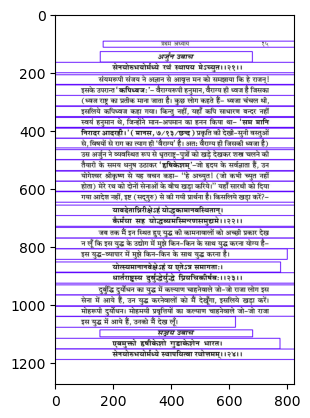

Text for each image:
१६ श्रीमद्भगवद्गीता : यथार्थ गीता

भीष्मद्रोणप्रमुखत: सर्वेषां च महीक्षिताम्‌।

उबाच पार्थ पश्यैतान्समवेतान्कुरूनिति।।२५।।

संजय बोला- निद्राजयी अर्जुन द्वारा इस प्रकार कहे जाने पर हृदय के

ज्ञाता श्रीकृष्ण ने दोनों सेनाओं के बीच भीष्म, द्रोण और “महीक्षिताम्‌ '-

शरीररूपी पृथ्वी पर अधिकार जमाये हुए सम्पूर्ण राजाओं के बीच उत्तम रथ

को खड़ा करके कहा- पार्थ ! इन इकट्ठे हुए कौरवों को देख। यहाँ उत्तम रथ

सोने-चाँदी का रथ नहीं है। संसार में उत्तम की परिभाषा नश्बर के प्रति

अनुकूलता-प्रतिकूलता से की जाती है। यह परिभाषा अपूर्ण है। जो हमारे

आत्मा, हमारे स्वरूप का सदैव साथ दे, वही उत्तम है। जिसके पीछे 'अनुत्तम'-

मलिनता न हो।

तत्रापश्यत्स्थितान्पार्थ: पितृनथ 'पितामहान्‌ |

आचार्यान्मातुलान्भ्रातृपुत्रान्पौत्रान्सखींस्तथ ।। २६।।

श्वशुरान्सुहृदश्चव सेनयोरूभयोरपि।

इसके उपरान्त अचूक लक्ष्यवाले, पार्थिव शरीर को रथ बनानेवाले पार्थ

ने उन दोनों सेनाओं में स्थित पिता के भाइयों को, पितामहों को, आचार्यों को,

मामाओं को, भाइयों को, पुत्रों को, पौत्रों को, मित्रों को, श्वसुरों को और

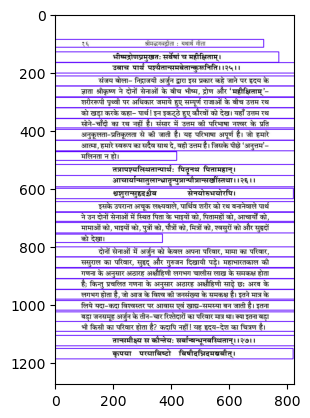

Ignored file: datasets/Devanagari datasets/annotations/0017.txt
Text for each image:
ह्हः श्रीमद्भगवद्गीता : यथार्थ गीता

येषामर्थे काड्जक्षितं नो राज्यं भोगा: सुखानि च।

त इमेऽवस्थिता युद्धे प्राणांस्त्थकत्वा धनानि च।।३३।।

हमें जिनके लिये राज्य, भोग और सुखादिक इच्छित हैं, वे ही परिवार

जीवन की आशा त्यागकर युद्ध के मैदान में खड़े हैं। हमें राज्य इच्छित था तो

परिवार को लेकर; भोग, सुख और घन की पिपासा थी तो स्वजन और परिवार

के साथ उन्हें भोगने की थी। किन्तु जब सब-के-सब प्राणों की आशा त्यागकर

खड़े हैं तो मुझे सुख, राज्य या भोग नहीं चाहिये। यह सब इन्हीं के लिये प्रिय

थे। इनसे अलग होने पर हमें इनकी आवश्यकता नहीं है। जब तक परिवार

रहेगा, तभी तक ये वासनाएँ भी रहती हैं। झोपड़ी में रहनेवाला भी अपने

परिवार, मित्र और स्तवजन को मारकर विश्व का साम्राज्य स्वीकार नहीं

करेगा। अर्जुन भी यही कहता है कि हमें भोग प्रिय थे, विजय प्रिय थी; किन्तु

जिनके लिये थी, जब वे ही नहीं रहेंगे तो भोगों से क्‍या प्रयोजन? इस युद्ध में

मारना किसे है?-

आचार्य: पितर: पुत्रास्तथैव च पितामहा:।

मातुला: श्वशुरा: पौत्रा

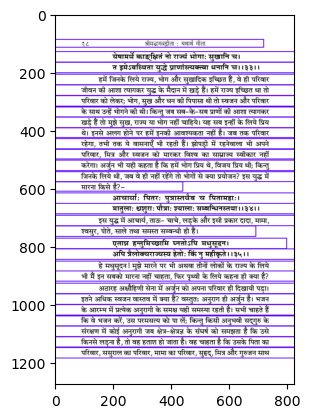

Ignored file: datasets/Devanagari datasets/annotations/0019.txt
Text for each image:
२० श्रीमद्भगवद्गीता : यथार्थ गीता

आत्मा के पथ में अवरोध उत्पन्न करता है। आत्मदर्शन में बाधक काम, क्रोध,

लोभ, मोह आदि का समूह ही आततायी है।

तस्मान्ना्ा बयं हन्तुं धार्तराष्ट्रान्स्वबान्धवान्‌।

स्वजनं हि कथ्थ॑ हत्वा सुरिबरिन: स्थाम माधव।।३७।।

इससे हे माधव | अपने बान्धव धृतराष्ट्र के पुत्रों को मारने के लिये हम

योग्य नहीं हैं। स्व-बान्धव कैसे? वे तो शत्रु थे न! वस्तुतः शरीर के रिश्ते

अज्ञान से उत्पन्न होते हैं। यह मामा हैं, ससुराल है, स्वजन-समुदाय है- यह सब

अज्ञान ही तो है। जब शरीर ही नश्वर है, तब इसके रिश्ते ही कहाँ रहेंगे? मोह

है तभी तक सुहृद्‌ हैं, हमारा परिवार है, हमारी दुनिया है। मोह नहीं तो कुछ भी

नहीं। इसीलिये वे शत्रु भी अर्जुन को स्वजन दिखायी पड़े। वह कहता है कि

अपने कुटुम्ब को मारकर हम कैसे सुखी होंगे? यदि अज्ञान और मोह न रहे तो

कुटुम्ब का अस्तित्व न हो। यह अज्ञान ज्ञान का प्रेरक भी है। भर्तृहरि, तुलसी

इत्यादि अनेक महानुभावों को बैराग्य की प्रेरणा पत्नी से मिली, तो कोई सौतेली

माँ क

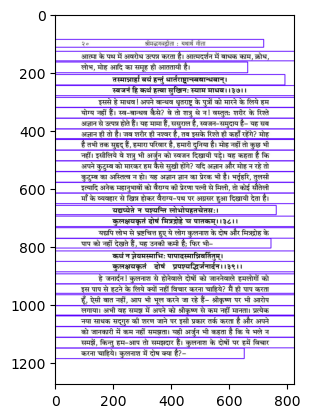

Text for each image:
प्रथम अध्याय २१

कुलक्षये प्रणश्यन्ति कुलधर्मा: सनातना:।

धर्मे नष्टे कुलं कृत्स्नमधर्मोऽभिभवत्युत।।४०।।

कुल के नाश होने से सनातन कुलधर्म नष्ट हो जाते हैं। अर्जुन कुलधर्म,

कुलाचार को ही सनातन-धर्म समझ रहा था। धर्म के नाश होने पर सम्पूर्ण

कुल को पाप भी बहुत दबा लेता है।

अधर्माभिभवात्कृष्ण प्रदुष्यन्ति कुलस्त्रिय:।

स्त्नीषु दुष्टासु वाष्णेय जायते वर्णसड्भूर:।।४१।।

हे कृष्ण ! पाप के अधिक बढ़ जाने से कुल की स्त्रियाँ दूषित हो जाती

हैं। हे वाष्णेय ! स्त्रियों के दूषित होने पर वर्णसंकर उत्पन्न होता है। अर्जुन की

मान्यता थी कि कुल की स्त्रियों के दूषित होने से वर्णसंकर होता है; किन्तु

श्रीकृष्ण ने इसका खण्डन करते हुए आगे बताया कि मैं अथवा स्वरूप में

स्थित महापुरुष यदि आराधना-क्रम में भ्रम उत्पन्न कर दें, तब वर्णसंकर होता

है। वर्णसंकर के दोषों पर अर्जुन प्रकाश डालता है-

सड्जरो नरकायैब कुलघ्नानां कुलस्यथ चा।

'पतन्ति पितरो होषां लुप्तपिण्डोदकक्रिया:।।४२।।

वर्णसंकर कुलघातियों और कुल को नरक में ले जाने के लिये ही होता

है। लुप्त हुई पिण्डोदक क्रियावाले इनके पितर 

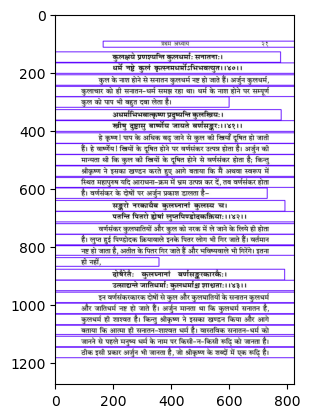

Ignored file: datasets/Devanagari datasets/annotations/0022.txt
Text for each image:
प्रथम अध्याय २३

इतना प्रबल होता है। इसीलिये अर्जुन कहता है कि शस्त्रधारी धृतराष्ट्र के पुत्र

मुझ न प्रतिकार करनेवाले को रण में मार दें, तब भी वह मेरे लिये

अतिकल्याणकारी होगा ताकि लड़के तो सुखी रहें।

सञ्जय उवाच  उवाच

एवमुक्त्वार्जुन: सद्भुच्चे रथोपस्थ उपाविशत्‌।

विसृज्य सशरं चापं शोकसंविग्रमानस:।।४७।।

संजय बोला कि रणभूमि में शोक से उद्विग्न मनवाला अर्जुन इस प्रकार

कहकर बाणसहित धनुष को त्यागकर रथ के पिछले भाग में बैठ गया अर्थात्‌

क्षेत्र-क्षेत्र्त के संघर्ष में भाग लेने से पीछे हट गया।

निष्कर्ष-

गीता क्षेत्र-क्षेत्र्ञ के युद्ध का निरूपण है। यह ईश्वरीय विभूतियों से

सम्पन्न भगवत्‌-स्वरूप को दिखानेवाला गायन है। यह गायन जिस क्षेत्र में

होता है, वह युद्धक्षेत्र शरीर है। जिसमें दो प्रवृत्तियाँ हैं- धर्मक्षेत्र और कुरुक्षेत्र।

उन सेनाओं का स्वरूप और उनके बल का आधार बताया, शंखध्वनि से उनके

पराक्रम की जानकारी मिली। तदनन्तर जिस सेना से लड़ना है, उसका निरीक्षण

हुआ। जिसकी गणना अठारह अक्षौहिणी (लगभग स

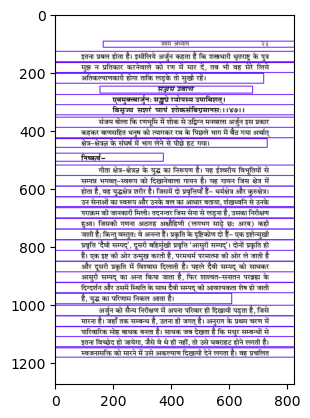

Text for each image:
२४ श्रीमद्भगवद्गीता : यथार्थ गीता

रूढ़ियों में अपना बचाव ढूँढ़ने लगता है, जैसा अर्जुन ने किया। उसने कहा-

“कुलधर्म ही सनातन-धर्म है। इस युद्ध से सनातन-धर्म नष्ट हो जायेगा, कुल

की स्त्रियाँ दूषित होंगी, वर्णसंकर पैदा होगा, जो कुल और कुलघातियों को

अनन्तकाल तक नरक में ले जाने के लिये ही होता है।' अर्जुन अपनी समझ

से सनातन-धर्म की रक्षा के लिये विकल है। उसने श्रीकृष्ण से अनुरोध किया

कि हमलोग समझदार होकर भी यह महान्‌ पाप क्‍यों करें? अर्थात्‌ श्रीकृष्ण भी

पाप करने जा रहे हैं। अन्ततोगत्वा पाप से बचने के लिये “मैं युद्ध नहीं

करूँगा'- ऐसा कहता हुआ हताश अर्जुन रथ के पिछले भाग में बैठ गया।

क्षेत्र-क्षेत्र्त के संघर्ष से पीछे हट गया।

टीकाकारों ने इस अध्याय को 'अर्जुन-विषाद योग' कहा है। अर्जुन

अनुराग का प्रतीक है। सनातन-धर्म के लिये विकल होनेवाले अनुरागी का

विषाद योग का कारण बनता है। यही विषाद मनु को हुआ था- 'हृदयँ बहुत

दुख लाग जनम गयउ हरिभगति बिनु। ' ( रामचरितमानस, १/१४२)

संशय में पड़कर ही मनुष्य विषाद करता है। उसे सन्देह था कि वर्णसंकर पैदा

होगा, जो नरक में ले ज

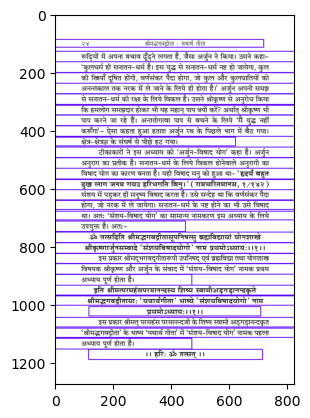

Text for each image:
॥ॐ श्री परमात्मने नमः ।।

॥ अथ द्वितीयोऽथ्याय||

प्रथम अध्याय गीता की प्रवेशिका है, जिसमें आरम्भ में पथिक को

प्रतीत होनेवाली उलझनों का चित्रण है। लड़नेवाले सम्पूर्ण कौरव और पाण्डव

हैं; किन्तु संशय का पात्र मात्र अर्जुन है। अनुराग ही अर्जुन है। इष्ट के अनुरूप

राग ही पथिक को क्षेत्र-क्षेत्रज्ञ के संघर्ष के लिये प्रेरित करता है। अनुराग

आरम्भिक स्तर है। 'पूज्य महाराज जी' कहते थे- “सद्‌गृहस्थ आश्रम में रहते

हुए ग्लानि होने लगे, अश्रुपात होता हो, कण्ठ अवरुद्ध होता हो तो समझना कि

यहीं से भजन आरम्भ हो गया।” अनुराग में यह सब कुछ आ जाता है। उसमें

धर्म, नियम, सत्संग, भाव सभी विद्यमान होंगे।

अनुराग के प्रथम चरण में पारिजारिक मोह बाधक बनता है। पहले

मनुष्य चाहता है कि वह उस परम सत्य को प्राप्त कर ले; किन्तु आगे बढ़ने

पर वह देखता है कि इन मधुर सम्बन्धों का उच्छेद करना होगा, तब हताश हो

जाता है। वह पहले से जो कुछ धर्म-कर्म मानकर करता था, उतने में ही

सन्तोष करने लगता है। अपने मोह की पुष्टि के लिये वह प्रचलित रूढ़ियों का

प्रमाण भी प्रस्तुत करता है- जैसा अर्जुन ने किया कि

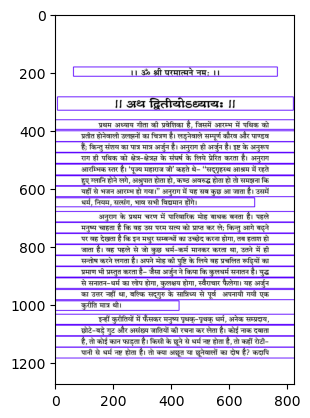

Text for each image:
२६ श्रीमद्भगवद्गीता : यथार्थ गीता

नहीं ! दोष हमारे भ्रमदाताओं का है। धर्म के नाम पर हम कुरीति के शिकार हैं,

इसलिये दोष हमारा है।

महात्मा बुद्ध के समय में केश-कम्बल एक सम्प्रदाय था, जिसमें केश

को बढ़ाकर कम्बल की तरह प्रयोग करने को पूर्णता का मानदण्ड माना जाता

था। कोई गोब्रतिक (गाय की भाँति रहनेवाला) था, तो कोई कुक्कुरत्रतिक

(कुत्ते की तरह खाने-पीने, रहनेवाला) था। ब्रह्मविद्या का इनसे कोई सम्बन्ध

नहीं है। सम्प्रदाय और कुरीतियाँ पहले भी थीं, आज भी हैं। ठीक इसी प्रकार

कृष्णकाल में भी सम्प्रदाय थे, कुरीतियाँ थीं। उनमें से एकाध कुरीति का

शिकार अर्जुन भी था। उसने चार तर्क प्रस्तुत किये- १. ऐसे युद्ध से सनातन-

धर्म नष्ट हो जायेगा, २. वर्णसंकर पैदा होगा, ३. पिण्डोदक क्रिया लुप्त होगी,

और ४. हमलोग कुलक्षय द्वारा महान्‌ पाप करने को उद्यत हुए हैं।

सञ्जय उवाच

तं तथा कृपयाविष्टमश्रुपूर्णाकुलेक्षणम्‌।

विषीदन्तमिदं वाक्यमुवाच्र मधुसूदन:।।१।।

संजय ने कहा- करुणा से व्याप्त, अश्रुपूर्ण व्याकुल नेत्रोंबाले उस

अर्जुन के प्रति 'मधुसूदन'- मद का विनाश करनेवाले भगवान ने यह 

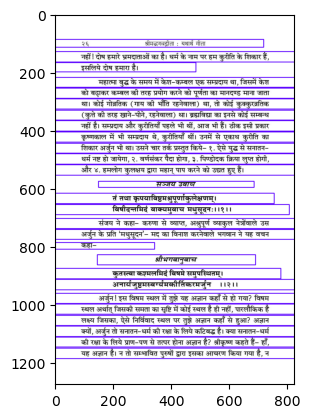

Text for each image:
द्वितीय अध्याय २७

यह स्वर्ग ही देनेवाला है और न यह कीर्ति को ही करनेवाला है। सन्मार्ग पर

जो दृढ़तापूर्वक आरूढ़ है, उसे आर्य कहते हैं। गीता आर्यसंहिता है। परिवार के

लिये मरना-मिटना यदि अज्ञान न होता तो महापुरुष उस पर अवश्य चले

होते। यदि कुलधर्म ही सत्य होता तो स्वर्ग और कल्याण की निःश्रेणी अवश्य

बनती। यह कीर्तिदायक भी नहीं है। मीरा भजन करने लगी, तो “लोग कहें

मीरा भई बावरी , सास कहे कुलनाशी रे। ' जिस परिवार, कुल और मर्यादा

के लिये मीरा की सास बिलख रही थी, आज उस कुलवन्ती सास को कोई

नहीं जानता, मीरा को विश्व जानता है। ठीक इसी प्रकार परिवार के लिये जो

परेशान हैं, उनकी भी कीर्ति कब तक रहेगी? जिसमें कीर्ति नहीं, कल्याण नहीं,

श्रेष्ठ पुरुषों ने भूलकर भी जिसका आचरण नहीं किया तो सिद्ध है कि वह

अज्ञान है। अत:-

क्लैब्यं मा सम गम: पार्थ नैतत्त्वव्युपपद्यते।

क्षुद्रं हृदयदौर्बल्यं त्यक्त्वोत्तिष्ठ परन्तप।।३।।

अर्जुन | नपुंसकता को मत प्राप्त हो। क्‍या अर्जुन नपुंसक था? क्‍या

आप पुरुष हैं? नपुंसक वह है, जो पौरुष से हीन हो। सब अपनी समझ से

पुरुषार्थ ही तो करते हैं। क

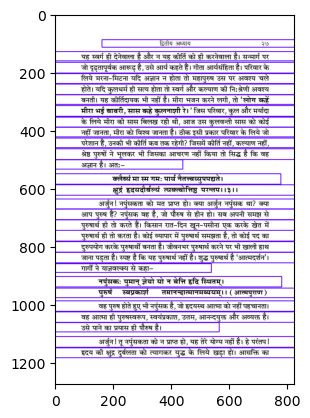

Text for each image:
२८ श्रीमद्भगवद्गीता : यथार्थ गीता

त्याग करो। यह हृदय की दुर्बलता मात्र है। इस पर अर्जुन ने तीसरा प्रश्न

प्रस्तुत किया-

अर्जुन उवाच 

कर्थ भीष्ममहं सद्भुओ द्रोणं च मधुसूदन।

इषुभि: प्रति योत्स्यामि पूजा्हाबरिसूदन।। ४।।

अहंकार का शमन करनेवाले मधुसूदन ! मैं रणभूमि में पितामह भीष्म

और आचार्य द्रोण से किस प्रकार बाणों से युद्ध करूँगा? क्योंकि अरिसूदन | वे

दोनों ही पूजनीय हैं।

द्वैत ही द्रोण है। प्रभु अलग हैं, हम अलग हैं-द्वैत का यह भान ही प्राप्ति

की प्रेरणा का आरम्भिक खोत है। यही द्रोणाचार्य का गुरुत्व है। भ्रम ही भीष्म

है। जब तक भ्रम है तभी तक बच्चे, परिवार, रिश्तेदार सभी अपने लगते हैं।

अपना लगने में भ्रम ही माध्यम है। आत्मा इन्हीं को पूज्य मानकर इनके साथ

रहता है कि यह पिता हैं, दादा हैं, कुलगुरु हैं इत्यादि। साधन के पूर्तिकाल में

“गुरु न चेला, पुरुष अकेला।'

न॒ बच्धुर्न मित्र गुरुनैंव शिष्य:।

चिदानन्दरूप: शिवो5हम्‌ शिवो5हम्‌।। ( आत्मषदट्क, ५)

जब चित्त उस परम आनन्द में विलीन हो जाता है, तब न गुरु ज्ञानदाता

और न शिष्य ग्रहणकर्त्ता ही रह जाता है। यही परम 

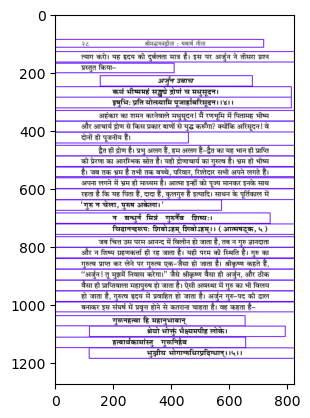

Text for each image:
द्वितीय अध्याय २९

इन महानुभाव गुरुजनों को न मारकर मैं इस लोक में मिक्षा का अन्न भी

श्रेयस्कर समझता हूँ। यहाँ भिक्षा का अर्थ उदर-पोषण के लिये भीख माँगना

नहीं बल्कि सत्पुरुषों की टूटी-फूटी सेवा द्वारा उससे कल्याण की याचना ही

भिक्षा है। 'अन्न॑ ब्रहोति व्यजानातू।' ( तैत्तिरीय उप०, भृगुबल्ली २)

अन्न एकमात्र परमात्मा है, जिसे प्राप्त करके आत्मा सदा के लिये तृप्त हो

जाता है, कभी अतृप्त नहीं रहता। हम महापुरुषों की सेवा और याचना द्वारा

शनैः-शनैः ब्रह्मपीयूष प्राप्त करें; किन्तु यह परिवार न छूटे, यही अर्जुन के

भिक्षात्र की कामना है। संसार में अधिकांश लोग ऐसा ही करते हैं। वे चाहते

हैं कि पारिवारिक स्नेह-सम्बन्ध न मारना पड़े और मुक्ति भी शनैः-शनै: मिल

जाय। किन्तु चलनेवाले पथिक के लिये, जिसके संस्कार इनसे ऊपर हैं,

जिसमें संघर्ष की क्षमता है, स्वभाव में क्षत्रियत्व प्रवाहित है, उसके लिये इस

भिक्षान्न का विधान नहीं है। स्वयं न करके याचना करना भिक्षान्न है। गौतम

बुद्ध ने भी मज्झिम निकाय के धम्मदायाद सुत्त (१/१/३) में इस भिक्षात्न को

आमिष-दायाद कहकर हेय माना है, जबकि 

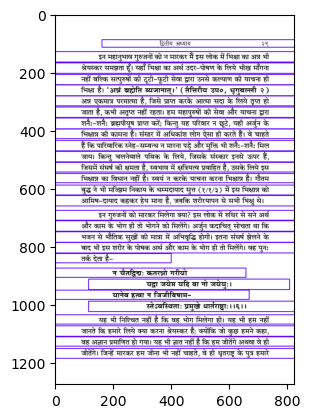

Text for each image:
३० श्रीमद्भगवद्गीता : यथार्थ गीता

सामने खड़े हैं। जब अज्ञानरूपी धृतराष्ट्र से उत्पन्न मोह इत्यादि स्वजन-समुदाय

मिट ही जायेंगे, तब हम जी कर ही क्या करेंगे? अर्जुन पुनः सोचता है कि जो

कुछ हमने कहा, कदाचित्‌ यह भी अज्ञान हो; अतः प्रार्थना करता है-

कार्पण्यदोषोपहतस्वभाव:

पृच्छामि त्वां धर्मसम्मूढचेता:।

अच्छेय: स्यान्निश्वितं ब्रूहि  तन्‍मे

शिष्यस्तेऽहं शाधि मां त्वां प्रपन्म्‌। ।७।।

'कायरता के दोष से नष्ट स्वभाववाला, धर्म के विषय में सर्वथा मोहितचित्त

हुआ मैं आपसे पूछता हूँ। जो कुछ निश्चित परम कल्याणकारी हो, वह साधन

मेरे लिये कहिये। मैं आपका शिष्य हूँ, आपकी शरण में हूँ, मुझे साधिये।

केवल शिक्षा न दीजिये, बल्कि जहाँ लड़खड़ाऊँ वहाँ सँभालिये। “'लाद दे

'लदाय दे और लदानेवाला साथ चले- कदाचित्‌ गट्ठर गिर पड़ा, तब कौन

लद॒वायेगा?'-ऐसा ही समर्पण अर्जुन का है।

यहाँ अर्जुन ने पूर्ण समर्पण कर दिया। अभी तक वह श्रीकृष्ण को अपने

स्तर का ही समझता था, अनेक विद्याओं में अपने को कुछ आगे ही मानता

था। यहाँ उसने अपनी बागडोर श्रीकृष्ण को वस्तुतः सौंप दी। सद्गुरु पूर्तिपर्यन्त


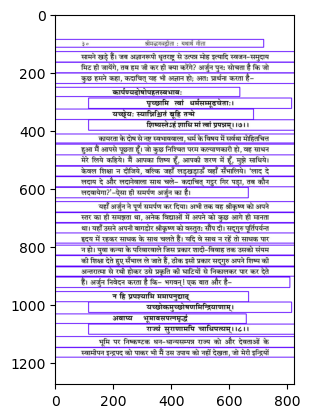

Text for each image:
द्वितीय अध्याय ३१

को सुखानेवाले शोक को दूर कर सके। जब शोक बना ही है तो यह सब लेकर

ही मैं क्या करूँगा? यदि इतना ही मिलना है तो क्षमा करें। अर्जुन ने सोचा,

अब इसके आगे बतायेंगे भी क्या?

सञ्जय उवाच 

एवमुक्‍त्वा हृषीकेशं गुडाकेश: परन्तप।

न योत्स्य इति गोविन्दमुकत्वा तूष्णी बभूव ह।।९।।

संजय बोला- हे राजन्‌ ! मोहनिशाजयी अर्जुन ने हृदय के सर्वज्ञ श्रीकृष्ण

से यह कहकर कि “गोविन्द! मैं युद्ध नहीं करूँगा' चुप हो गया। अभी तक

अर्जुन की दृष्टि पौराणिक है, जिसमें कर्मकाण्डों के साथ भोगों की उपलब्धि

का विधान है, जिसमें स्वर्ग ही सब कुछ माना जाता है- जिस पर श्रीकृष्ण

प्रकाश डालेंगे कि यह विचारधारा भी गलत है।

तमुवाच्र हृषीकेश: प्रहसन्निव भारत।

सेनयोरूभयोर्मध्ये विषीदन्तमिदं बच:।। १ ०।।

उसके उपरान्त हे राजन्‌ | अन्तर्यामी योगेश्वर श्रीकृष्ण ने दोनों सेनाओं

के बीच में उस शोकयुक्त अर्जुन को हँसते हुए-से यह वचन कहा-

श्रीधथगवानुवाच

अशोच्यानन्वशोच्स्त्वं प्रज्ञावादांश्व भाषसे।

गतासूनगतासूंश्र नानुशोचन्ति पण्डिता:।।११।।

अर्जुन | तू न शोक करने योग्यों के लिये शोक करता है

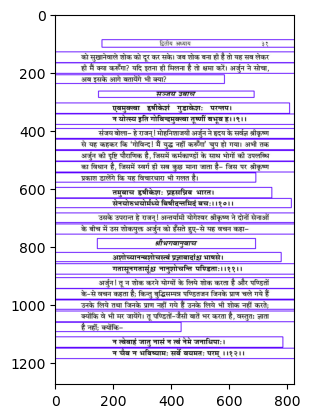

Text for each image:
३२ श्रीमद्भगवद्गीता : यथार्थ गीता

न तो ऐसा ही है कि मैं अर्थात्‌ सदगुरु किसी काल में नहीं था अथवा

तू अनुरागी अधिकारी अथवा “जनाध्ििपा: '- राजा लोग अर्थात्‌ राजसी वृत्ति

में पाया जानेवाला अहं नहीं था और न ऐसा ही है कि आगे हम सब नहीं रहेंगे।

सद्गुरु सदैज रहता है, अनुरागी सदैव रहते हैं। यहाँ योगेश्वर ने योग की

अनादिता पर प्रकाश डालते हुए भविष्य में भी उसकी विद्यमानता पर बल

दिया। मरनेवालों के लिये शोक न करने के लिये कारण बताते हुए उन्होंने

कहा-

देहिनोऽस्मिन्यथा देहे कौमारं यौवन जरा।

तथा देहान्तरप्राप्तिर्भीरिस्तत्र न मुहाति।॥१३।।

जैसे जीवात्मा की इस देह में कुमार, युवा और वृद्ध अवस्था होती है,

वैसे ही अन्य-अन्य शरीरों की प्राप्ति में धीर पुरुष मोहित नहीं होता है। कभी

आप बालक थे, शनैः-शनैः युवा हुए, तब आप मर तो नहीं गये? पुनः वृद्ध

हुए। पुरुष एक ही है, उसी प्रकार लेशमात्र भी दरार नये देह की प्राप्ति पर नहीं

पड़ती। कलेबर का यह परिवर्तन तब तक चलेगा, जब तक परिवर्तन से परे

की वस्तु नहीं मिल जाती।

मात्रास्पर्शास्तु कौन्तेय शीतोष्णसुखदुःखदा:।

आगमापायिनोऊनित्या

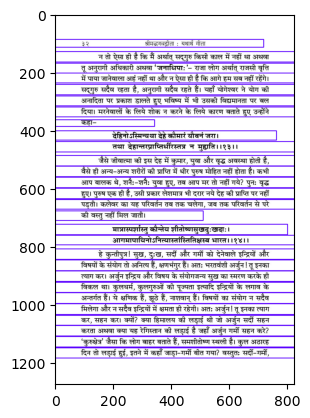

Text for each image:
द्वितीय अध्याय ३३

दुःख-सुख, मान-अपमान को सहन करना एक योगी पर निर्भर करता है। यह

हृदय-देश की लड़ाई का चित्रण है। बाहर युद्ध के लिये गीता नहीं कहती। यह

क्षेत्र-क्षेत्र्ञ का संघर्ष है, जिसमें आसुरी सम्पद्‌ का सर्वथा शमन कर परमात्मा

में स्थिति दिलाकर दैवी सम्पद्‌ भी शान्त हो जाती है। जब विकार हैं ही नहीं

तो सजातीय प्रवृत्तियाँ किस पर आक्रमण करें? अतः पूर्णत्व के साथ वे भी

शान्त हो जाती हैं, इससे पहले नहीं। गीता अन्तर्देश की लड़ाई का चित्रण है।

इस त्याग से मिलेगा क्या? इससे लाभ क्‍या है? इस पर श्रीकृष्ण कहते हैं-

यं हि न व्यथयन्त्येते पुरुषं पुरुषर्षभ।

समदुःखसुखं धीरं सोऽम्ृतत्वाय कल्पते।। १५।।

क्योंकि हे पुरुषश्रेष्ठ | दुःख-सुख को समान समझनेवाले जिस धीर

पुरुष को इन्द्रियों और विषयों के संयोग व्यथित नहीं कर पाते, वह मृत्यु से परे

अमृत-तत्त्व की प्राप्ति के योग्य हो जाता है। यहाँ श्रीकृष्ण ने एक उपलब्धि

“अमृर्त' की चर्चा की। अर्जुन सोचता था कि युद्ध के परिणाम में स्वर्ग मिलेगा

या पृथ्वी; किन्तु श्रीकृष्ण कहते हैं कि न स्वर्ग मिलेगा और न पृथ्वी, बल्कि

अमृत 

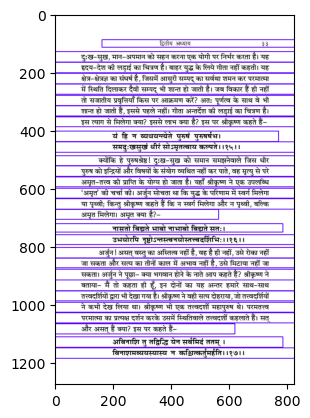

Text for each image:
३४ श्रीमद्भगवद्गीता : यथार्थ गीता

नाशरहित तो वह है, जिससे यह सम्पूर्ण जगत्‌ व्याप्त है। इस

“अव्ययस्यथ '- अविनाशी का विनाश करने में कोई समर्थ नहीं है। किन्तु इस

'अविनाशी', 'अमृत' का नाम कया है? वह है कौन?-

अन्तबन्त इमे देहा नित्यस्योक्ता: शरीरिण:।

अनाशिनोऽप्रमेयस्थ तस्माद्युध्यस्ब भारत।।१८।।

अविनाशी, अप्रमेय, नित्यस्वरूप आत्मा के ये सभी शरीर नाशवान्‌

कहे गये हैं, इसलिये भरतवंशी अर्जुन! तू युद्ध कर। आत्मा ही अमृत है।

आत्मा ही अविनाशी है, जिसका तीनों काल में नाश नहीं होता। आत्मा ही सत्‌

है। शरीर नाशवान्‌ है यही असत्‌ है, जिसका तीनों काल में अस्तित्व नहीं है।

“शरीर नाशवान्‌ है, इसलिये तू युद्ध कर'- इस आदेश से यह स्पष्ट नहीं

होता कि अर्जुन केवल कौरवों को मारे। पाण्डब-पक्ष में भी तो शरीर ही खड़े

थे, कया पाण्डवों के शरीर अगिनाशी थे? यदि शरीर नाशवान्‌ है तो श्रीकृष्ण

किसकी रक्षा में खड़े थे? कया अर्जुन कोई शरीरधारी था? शरीर जो असत्‌ है,

जिसका अस्तित्व नहीं है, जिसे रोका नहीं जा सकता, क्या श्रीकृष्ण उस शरीर

की रक्षा में खड़े हैं? यदि ऐसा है तो वे भी अविवेकी औ

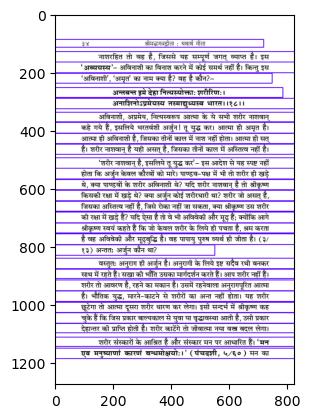

Text for each image:
द्वितीय अध्याय ३५

सर्वथा निरोध होना, अचल-स्थिर ठहरना और अन्तिम संस्कार का विलय

एक ही क्रिया है। संस्कारों की सतह का टूट जाना ही शरीरों का अन्त है। इसे

तोड़ने के लिये आपको आराधना करनी होगी, जिसे श्रीकृष्ण ने कर्म या

निष्काम कर्मयोग की संज्ञा दी है। श्रीकृष्ण ने स्थान-स्थान पर अर्जुन को युद्ध

की प्रेरणा दी; किन्तु एक भी श्लोक ऐसा नहीं है जो भौतिक युद्ध या मारकाट

का समर्थन करता हो। यह युद्ध सजातीय-विजातीय प्रवृत्तियों का है, अन्तर्देश

में है।

य एन वेत्ति हन्तारं यश्चैनं मन्‍्यते हतम्‌।

उभौ तौ न विजानीतो नाय॑ हन्ति न हन्यते।। ९९।।

जो इस आत्मा को मारनेवाला मानता है तथा जो इस आत्मा को मरा

हुआ समझता है, वे दोनों ही आत्मा को नहीं जानते; क्योंकि यह आत्मा न तो

मारता है और न मारा ही जाता है। पुनः इसी पर बल देते हैं-

न जायते प्लियते वा कदाचि-

ज्ञाय॑ं भूत्वा भविता वा न भूय:।

अजो नित्य: शाश्वतो5यं पुराणो

न हन्यते हन्यमाने शरीरे।।२०।।

यह आत्मा किसी काल में न तो जन्मता है और न मरता है; क्योंकि यह

वस्त्र ही तो बदलता है। न यह आत्मा होकर अन्य कुछ होनेवाला है; क्योंक

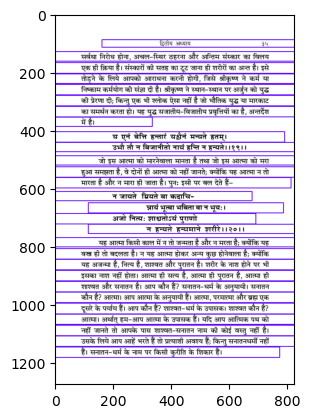

Text for each image:
द्वितीय अध्याय ३७

पर होता है। अपने संकल्प से बनाये हुए शरीरों में पुरुष उत्पन्न होता है। इस

प्रकार मृत्यु शरीर का परिवर्तन मात्र है। आत्मा नहीं मरता। पुनः इसकी

अजरता-अमरता पर बल देते हैं-

नैन॑ छिन्दन्ति शस्त्राणि नैन॑ दहति पावक:।

न चैन क्लेदयन्त्यापो न शोषयति मारुत:।। २३।।

अर्जुन! इस आत्मा को शस्त्रादि नहीं काटते, अग्नि इसे जला नहीं

सकती, जल इसे गीला नहीं कर सकता और न वायु इसे सुखा ही सकता है।

अच्छेद्योऽयमदाह्मोउयमक्लेद्यो इशोष्य एव च।

नित्य: सर्वगत: स्थाणुरचलोऽयं सनातन:।।२४।।

यह आत्मा अच्छेच्य है- इसे छेदा नहीं जा सकता, यह अदाह्य है- इसे

जलाया नहीं जा सकता, यह अक्लेदच्य है- इसे गीला नहीं किया जा सकता,

आकाश इसे अपने में समाहित नहीं कर सकता। यह आत्मा निःसन्देह अशोष्य,

सर्वव्यापक, अचल, स्थिर रहनेवाला और सनातन है।

अर्जुन ने कहा कि कुलधर्म सनातन है, ऐसा युद्ध करने से सनातन-धर्म

नष्ट हो जायेगा; किन्तु श्रीकृष्ण ने इसे अज्ञान माना और आत्मा को ही सनातन

बताया। आप कौन हैं? सनातन-धर्म के अनुयायी। सनातन कौन है? आत्मा।

यदि आप आत्मपर्यन्त दूरी तय करानेबाली विधि

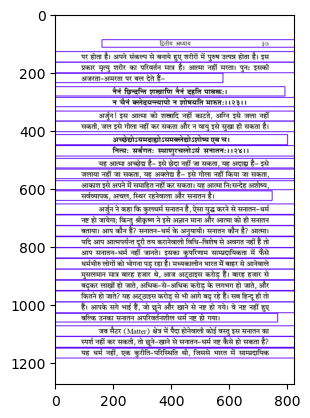

Text for each image:
३८ श्रीमद्भगवद्गीता : यथार्थ गीता

वैमनस्य बढ़ा, देश का विभाजन हुआ और राष्ट्रीय एकता की आज भी समस्या

बनी हुई है।

इन कुरीतियों के कथानक इतिहास में भरे पड़े हैं। हमीरपुर जिले में

'पचास-साठ परिवार कुलीन क्षत्रिय थे। आज वे सब मुसलमान हैं। न उन पर

तोप का हमला हुआ, न तलवार का। हुआ क्या? अर्द्धरत्रि में दो-एक मौलवी

उस गाँव के एकमात्र कुएँ के समीप छिप गये कि कर्मकाण्डी ब्राह्मण सबसे

पहले यहाँ स्नान करने आयेगा। जहाँ वे आये तो उन्हें पकड़ लिया, उनका मुँह

बन्द कर दिया। उनके सामने उन्होंने कुएँ से पानी निकाला, मुँह लगाकर पिया

और बचा हुआ पानी कुएँ में डाल दिया। रोटी का एक टुकड़ा भी डाल दिया।

पण्डितजी देखते ही रह गये, विवश थे। तत्पश्चात्‌ पण्डितजी को भी साथ

लेकर वे चले गये। अपने घर में उन्हें बन्द कर दिया।

दूसरे दिन उन्होंने हाथ जोड़कर पण्डितजी से भोजन के लिये निवेदन

किया तो वे बिगड़ पड़े- “अरे, तुम यवन हो मैं ब्राह्मण, भला कैसे खा सकता

हूँ?” उन्होंने कहा- “महाराज! हमें आप-जैसे विचारवान्‌ लोगों की बड़ी

आवश्यकता है। क्षमा करें।” पण्डितजी को छोड़ दिया गया।

पण्डितजी 

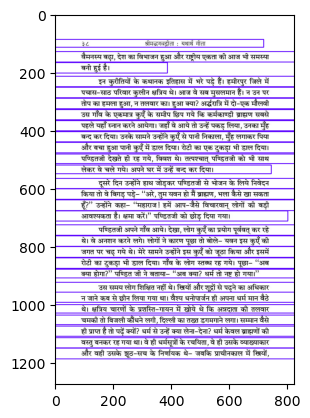

Text for each image:
४० श्रीमद्भगवद्गीता : यथार्थ गीता

ऐसी ही कतिपय कुरीतियाँ अर्जुनकाल में भी थीं। उनका शिकार अर्जुन

भी था। उसने विलाप करते हुए गिड़गिड़ाकर कहा कि कुलधर्म सनातन है।

युद्ध से सनातन-धर्म नष्ट हो जायेगा। कुलधर्म नष्ट होने से हम अनन्तकाल

तक नरक में चले जायेंगे। किन्तु श्रीकृष्ण ने कहा- “तुझे यह अज्ञान कहाँ से

उत्पन्न हो गया?” सिद्ध है कि वह कोई कुरीति थी, तभी तो श्रीकृष्ण ने उसका

निराकरण किया और बताया कि आत्मा ही सनातन है। यदि आप आत्मिक

पथ नहीं जानते तो सनातन-धर्म में आपका अभी तक प्रवेश नहीं हुआ है।

जब यह सनातन-शाश्वत आत्मा सबके अन्दर व्याप्त है तो खोजा

किसे जाय? इस पर श्रीकृष्ण कहते हैं-

अव्यक्तो5यमचिन्त्यो 5यमविकार्योउयमुच्यते।

तस्मादेव॑ जिदित्जैन॑ नानुशोचितुमहसि। | २५।।

यह आत्मा अव्यक्त अर्थात्‌ इन्द्रियों का विषय नहीं है। इन्द्रियों के द्वारा

इसे समझा नहीं जा सकता। जब तक इन्द्रियों और विषयों का संयोग है, तब

तक आत्मा है तो; किन्तु उसे समझा नहीं जा सकता। वह अचिन्त्य है। जब

तक चित्त और चित्त की लहर है, तब तक वह शाश्वत है तो; किन्तु हमारे

दर्शन, उपभोग और प्

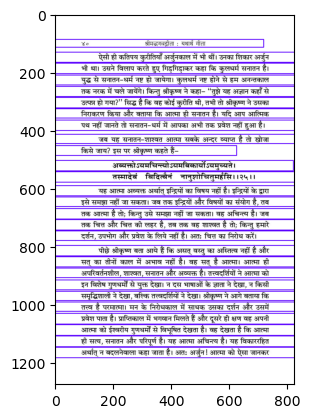

Text for each image:
द्वितीय अध्याय ४१

तू शोक करने योग्य नहीं है। अब श्रीकृष्ण अर्जुन के विचारों में विरोधाभास

दिखाते हैं, जो सामान्य तर्क है-

अथ चैन नित्यजातं नित्यं वा मन्यसे मृतम्‌।

तथापि त्वं महाबाहो नैवं शोचितुमरहसि।।२६।।

यदि तू इसे सदैव जन्मनेवाला और सदा मरनेवाला माने तब भी तुझे

शोक नहीं करना चाहिये; क्योंकि-

जातस्य हि थ्रुवो मृत्युर्भुवं जन्म मृतस्य च।

तस्मादपरिहार्ये3र्थे न त्व॑ शोचितुमहसि।।२७।।

ऐसा मान लेने पर भी जन्मनेवाले की निश्चित मृत्यु और मरनेवाले का

निश्चित जन्म सिद्ध होता है। इसलिये भी तू बिना उपायवाले इस विषय में

शोक करने लायक नहीं है। जिसका कोई इलाज नहीं, उसके लिये शोक करना

एक अन्य दुःख को आमन्त्रित करना है।

अव्यक्तादीनि भूतानि व्यक्तमध्यानि भारत।

अव्यक्तनिधनानयेब तत्र का परिदेवना।।२८।।

अर्जुन | सम्पूर्ण प्राणी जन्म से पहले बिना शरीरवाले और मरने के बाद

भी बिना शरीरवाले हैं। जन्म के पूर्व और मृत्यु के पश्चात्‌ भी दिखायी नहीं

पड़ते, केवल जन्म-मृत्यु के बीच में ही शरीर धारण किये हुए दिखायी देते हैं।

अतः इस परिवर्तन के लिये व्यर्थ की चिन्ता क्यों करते ह

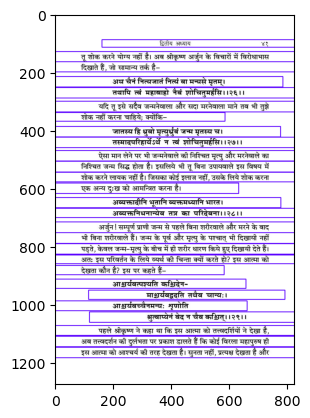

Text for each image:
४२ श्रीमद्भगवद्गीता : यथार्थ गीता

वैसे ही दूसरा कोई महापुरुष ही आश्चर्य की तरह इसके तत्त्व को कहता है।

जिसने देखा है, वही यथार्थ कह सकता है। दूसरा कोई बिरला साधक इसे

आश्चर्य की भाँति सुनता है। सब सुनते भी नहीं; क्योंकि यह अधिकारी के

लिये ही है। हे अर्जुन ! कोई-कोई तो सुनकर भी इस आत्मा को नहीं जान पाते;

क्योंकि साधन पार नहीं लगता। आप लाख ज्ञान की बातें सुनें, समझें- बाल

की खाल निकालकर समझें, लालायित भी रहें; किन्तु मोह बड़ा प्रबल है,

थोड़ी देर बाद ही आप अपनी सांसारिक व्यगस्थाओं में लिप्त मिलेंगे।

अन्त में श्रीकृष्ण निर्णय देते हैं-

देही नित्यमवध्योऽय देहे सर्वस्थ भारत।

तस्मात्सर्वाणि भूतानि न त्वं शोचितुमहसि।। ३०।।

अर्जुन! यह आत्मा सबके शरीर में सदैज अवध्य है, अकाट्य है।

इसलिये सम्पूर्ण भूतप्राणियों के लिये तू शोक करने योग्य नहीं है।

आत्मा ही सनातन है'- इस तथ्य का प्रतिपादन करके, इसका प्रभुतासहित

वर्णन करके यह प्रश्न यहीं पूरा हो जाता है। अब प्रश्न खड़ा होता है कि इसकी

प्राप्ति कैसे हो? सम्पूर्ण गीता में इसके लिये दो ही मार्ग हैं- पहला निष्काम

'कर्मय

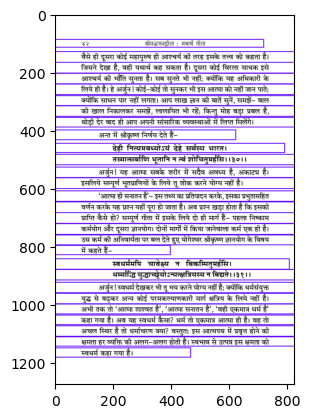

Text for each image:
द्वितीय अध्याय ४३

इसी एक सनातन आत्मिक पथ पर चलनेवाले साधकों को महापुरुष ने

स्वभाव की क्षमता के अनुसार चार श्रेणियों में बाँटा- शूद्र, वैश्य, क्षत्रिय और

ब्राह्मण। साधना की प्रारम्भिक अवस्था में प्रत्येक साधक शूद्र अर्थात्‌ अल्पज्ञ

होता है। घण्टों भजन में बैठने पर वह दस मिनट भी अपने पक्ष में नहीं पाता।

वह प्रकृति के मायाजाल को काट नहीं पाता। इस अवस्था में महापुरुष की

सेवा से उसके स्वभाव में सद्गुण आते हैं। वह वैश्य श्रेणी का साधक बन

जाता है। आत्मिक सम्पत्ति ही स्थिर सम्पत्ति है। इसका वह शनै:-शनैः संग्रह

और गोपालन अर्थात्‌ इन्द्रियों की सुरक्षा करने में सक्षम हो जाता है। काम,

क्रोध इत्यादि से इन्द्रियों की हिंसा होती है तथा विवेक, बैराग्य से इनकी सुरक्षा

होती है; किन्तु प्रकृति को निर्बीज करने की क्षमता उसमें नहीं होती। क्रमशः

उन्नति करते-करते साधक के अन्तःकरण में तीनों गुणों को काटने की क्षमता

अर्थात्‌ क्षत्रियत्व आ जाता है। इसी स्तर पर प्रकृति और उसके विकारों को

नाश करने की क्षमता आ जाती है, इसलिये युद्ध यहीं से आरम्भ होता है।

क्रमशः साधन करके साधक ब्

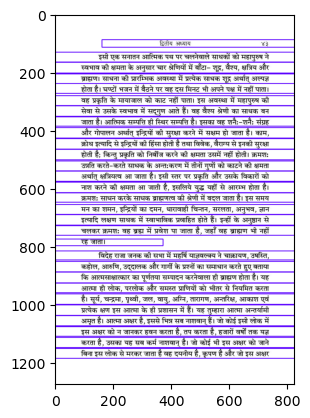

Text for each image:
द्वितीय अध्याय ४५

यदृच्छया चओपपन्नं स्वर्गद्वारमपावृतम्‌।

सुख्न: क्षत्रिया: पार्थ लभन्‍्ते युद्धमीदृशम्‌।।३२।।

पार्थिव शरीर को ही रथ बनाकर अचूक लक्ष्यवेथी अर्जुन | स्वतः प्राप्त

स्वर्ग के खुले हुए द्वाररूपी इस युद्ध को भाग्यवानू क्षत्रिय ही प्राप्त करते हैं।

क्षत्रिय श्रेणी के साधक में तीनों गुणों को काट देने की क्षमता रहती है। उसके

लिये स्वर्ग का द्वार खुला है; क्योंकि उसमें दैवी सम्पद्‌ पूर्णतः अर्जित रहती है,

स्वर में विचरने की उसमें क्षमता रहती है। यही खुला हुआ स्वर्ग का द्वार है।

क्षेत्र-क्षेत्र्ष के इस युद्ध को भाग्यवानू क्षत्रिय ही पाते हैं; क्योंकि उनमें ही इस

संघर्ष की क्षमता है।

दुनिया में लड़ाइयाँ होती हैं। विश्व सिमटकर लड़्ता है, प्रत्येक जाति

लड़ती है; किन्तु शाश्वत विजय जीतनेवाले को भी नहीं मिलती। ये तो बदले

हैं। जो जिसको जितना दबाता है, कालान्तर में उसे भी उतना ही दबना पड़ता

है। यह कैसी विजय है, जिसमें इन्द्रियों को सुखानेजाला शोक बना ही रहता है,

अन्त में शरीर भी नष्ट हो जाता है? वास्तविक संघर्ष तो क्षेत्र और क्षेत्रज्ञ का है,

जिसमें ए

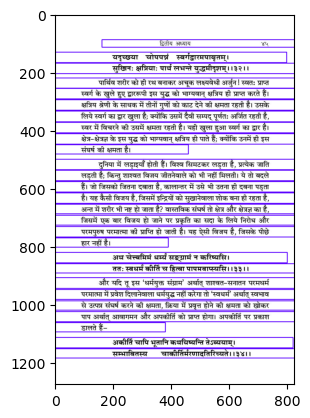

Text for each image:
४६ श्रीमद्भगवद्गीता : यथार्थ गीता

सब लोग बहुत काल तक तेरी अपकोर्ति का कथन करेंगे। आज भी

पदच्युत होनेवाले महात्माओं में विश्वामित्र, पराशर, निमि, श्र॒द्गी इत्यादि की

गणना होती है। बहुत से साधक अपने धर्म पर विचार करते हैं, सोचते हैं कि

लोग हमें कया कहेंगे? ऐसा भाव भी साधना में सहायक होता है। इससे साधना

में लगे रहने की प्रेरणा मिलती है। कुछ दूरी तक यह भाव भी साथ देता है।

माननीय पुरुषों के लिये अपकीर्ति मरण से भी बढ़कर होती है।

भयाद्रणादुपरतं॑ मंस्यन्ते त्वां महारथा:।

येषां च त्वं बहुमतो भूत्वा यास्यसि लाघवम्‌।।३५।।

जिन महारथियों की निगाह में तू बहुत माननीय होकर अब तुच्छता को

प्राप्त होगा, वे महारथी लोग तुझे भय के कारण युद्ध से उपराम हुआ मानेंगे।

महारथी कौन? इस पथ पर महान्‌ परिश्रम से आगे बढ़नेवाले साधक महारथी

हैं। इसी प्रकार इतने ही परिश्रम से अविद्या की ओर खींचनेवाले काम, क्रोध,

लोभ, मोहादि भी महारथी हैं। जो तुझे बहुत सम्मान देते थे कि साधक

प्रशंसनीय है, तुम उनकी निगाह से गिर जाओगे। इतना ही नहीं, बल्कि-

अवाच्यवादांश्व बहून्वदिष्यन्ति तवाहिता:।

निन्दन्

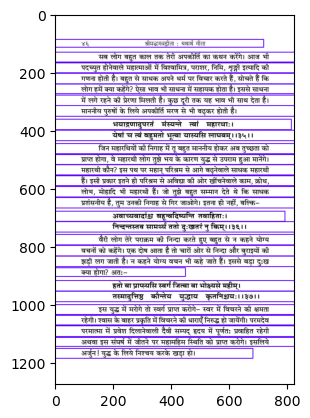

Text for each image:
द्वितीय अध्याय ४७

प्रायः लोग इस श्लोक के अर्थ में समझते हैं कि इस युद्ध में मरोगे तो

स्वर्ग जाओगे और जीतोगे तो पृथ्वी का भोग भोगोगे; किन्तु आपको स्मरण

होगा, अर्जुन कह चुका है- “भगबन्‌! पृथ्वी ही नहीं अपितु त्रैलोक्य के

साम्राज्य और देवताओं के स्वामीपन अर्थात्‌ इन्द्रपद प्राप्त होने पर भी मैं उस

उपाय को नहीं देखता, जो इन्द्रियों को सुखानेवाले मेरे शोक को दूर कर सके।

यदि इतना ही मिलना है, तो गोविन्द ! मैं युद्ध कदापि नहीं करूँगा।'' यदि इतने

पर भी श्रीकृष्ण कहते कि- अर्जुन ! लड़ो। जीतोगे तो पृथ्ली पा जाओगे, हारोगे

तो स्वर्ग के नागरिक बन जाओगे, तो श्रीकृष्ण देते ही कया हैं? अर्जुन इससे

आगे का सत्य, श्रेय (परमकल्याण) की कामनावाला शिष्य था, जिसे सद्गुरुदेव

श्रीकृष्ण ने बताया कि क्षेत्र-क्षेत्रज् के इस संघर्ष में यदि शरीर का समय पूरा

हो जाता है और लक्ष्य तक नहीं पहुँच सके तो स्वर्ग प्राप्त करोगे अर्थात्‌ स्वर

में ही विचरण करने की क्षमता प्राप्त कर लोगे, दैवी सम्पद्‌ हृदय में ढल

जायेगी और इस शरीर के रहते-रहते संघर्ष में सफल हो जाते हो तो 'महीम्‌'-

सबसे महान्‌

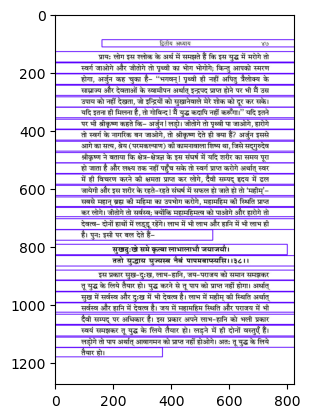

Text for each image:
द्वितीय अध्याय ४९

देता है। धर्म परिवर्तित नहीं होता। आप इस कर्म को समझें और इस पर दो

कदम चल भर दें (जो सद््‌गृहस्थ आश्रम में रहकर ही चला जा सकता है,

साधक तो चलते ही हैं।), बीज भर डाल दें, तो अर्जुन ! बीज का नाश नहीं

होता। प्रकृति में कोई क्षमता नहीं, ऐसा कोई अस्त्र नहीं कि उस सत्य को मिटा

दे। प्रकृति केबल आवरण डाल सकती है, कुछ देर कर सकती है; किन्तु

साधन के आरम्भ को मिटा नहीं सकती।

आगे श्रीकृष्ण ने बताया कि सभी पापियों से भी बड़ा पापी ही क्‍यों न

हो, ज्ञानरूपी नौका द्वारा निःसन्देह पार हो जायेगा। ठीक उसी बात को यहाँ

कहते हैं कि- अर्जुन! निष्काम कर्मयोग का बीजारोपण भर कर दें तो उस

बीज का कभी नाश नहीं होता। विपरीत फलरूपी दोष भी इसमें नहीं होता कि

आपको स्वर्ग, ऋद्धियों या सिद्धियों तक पहुँचा कर छोड़ दे। आप यह साधन

भले छोड़ दें; किन्तु यह साधन आपका उद्धार करके ही छोड़ेगा। इस निष्काम

कर्मयोग का थोड़ा-सा भी साधन जन्म-मृत्यु के महान्‌ भय से उद्धार कर देता

है। 'अनेकजन्मसंसिद्धस्ततो याति परां गतिम्‌।' ( गीता, ६/४५ ) कर्म

का यह बीजारोपण अनेक जन्मों के पश्चात्‌

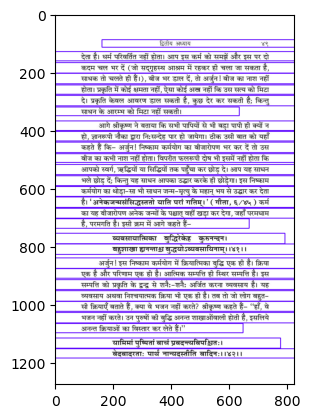

Text for each image:
५० श्रीमद्भगवद्गीता : यथार्थ गीता

कामात्मान: स्वर्गपरा जन्मकर्मफलप्रदाम्‌।

क्रियाविशेषजहुलां भोगैश्वर्यगतिं प्रति।।४३।।

पार्थ ! वे 'कामात्मान: '- कामनाओं से युक्त, 'बेदवादरता: '- वेद के

वाक्यों में अनुरक्त, 'स्वर्गपरा: '- स्वर्ग को ही परम लक्ष्य मानते हैं कि इससे

आगे कुछ है ही नहीं-ऐसा कहनेवाले अविवेकीजन जन्म-मृत्युरूपी फल

देनेवाली एवं भोग और ऐश्वर्य की प्राप्ति के लिये बहुत-सी क्रियाओं का

विस्तार कर लेते हैं और दिखाबटी शोभायुक्त वाणी में व्यक्त भी करते हैं।

अर्थात्‌ अविवेकियों की बुद्धि अनन्त भेदोंवाली होती है। वे फलवाले वाक्य में

ही अनुरक्त रहते हैं, बेद के वाक्‍्यों को ही प्रमाण मानते हैं, स्वर्ग को ही श्रेष्ठ

मानते हैं। उनकी बुद्धि बहुत-सी भेदोंवाली है, इसलिये अनन्त क्रियाओं की

रचना कर लेते हैं। वे नाम तो परमतत्त्व परमात्मा का ही लेते हैं; किन्तु उसकी

ओट में अनन्त क्रियाओं का विस्तार कर लेते हैं। तो क्या अनन्त क्रियाएँ कर्म

नहीं हैं? श्रीकृष्ण कहते हैं- नहीं, अनन्त क्रियाएँ कर्म नहीं हैं। तो वह एक

निश्चित क्रिया है क्या? श्रीकृष्ण अभी यह नहीं बतात

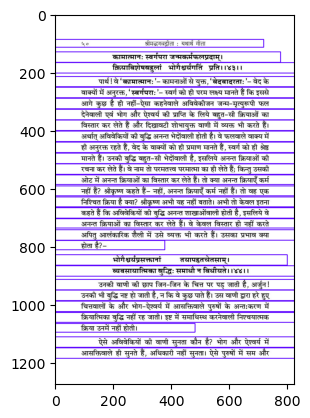

Ignored file: datasets/Devanagari datasets/annotations/0051.txt
Text for each image:
५४ श्रीमद्भगवद्गीता : यथार्थ गीता

रखते हुए कर्म का आचरण करना चाहिये। समत्व भाव अर्थात्‌ सिद्धि और

असिद्धि में समभाव ही योग कहलाता है। जिसको सिद्धि और असिद्धि विचलित

नहीं कर पातीं, विषमता जिसमें पैदा नहीं होती, ऐसा भाव होने के कारण यह

समत्व योग कहलाता है। यह इष्ट से समत्व दिलाता है, इसलिये इसे समत्व

योग कहते हैं। कामनाओं का सर्वथा त्याग है, इसलिये इसे निष्काम कर्मयोग

कहते हैं। कर्म करना है, इसलिये इसे कर्मयोग कहते हैं। परमात्मा से मेल

कराता है, इसलिये इसका नाम योग अर्थात्‌ मेल है। इसमें बौद्धिक स्तर पर

ध्यान रखना पड़ता है कि सिद्धि और असिद्धि में समभाव रहे, आसक्ति न हो,

'फल की वासना न आने पाये इसलिये यही निष्काम कर्मयोग बुद्धियोग भी

कहा जाता है।

दूरेण हावरं कर्म बुद्धियोगाद्धनञ्ञय।

बुद्धौ शरणमन्विच्छ कृपणा: फलहेतव:।।४९।।

धनंजय | 'अवरं कर्म '- निकृष्ट कर्म, वासनावाले कर्म बुद्धियोग से

अत्यन्त दूर हैं। फल की कामनावाले कृपण हैं। वे आत्मा के साथ उदारता नहीं

बरतते, अत: समत्व बुद्धियोग का आश्रय

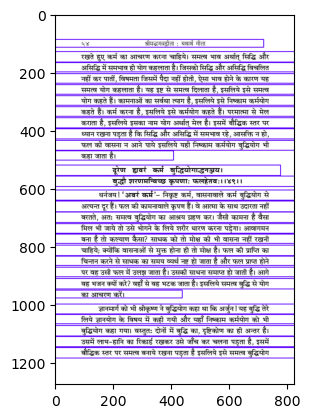

Text for each image:
५६ श्रीमद्धगवद्गीता : यथार्थ गीता

जन्म-मृत्यु से मुक्ति, निर्मल अविनाशी पद की प्राप्ति। बस ये दो ही योगक्रिया

हैं। इसके अतिरिक्त बुद्धि अविवेकजन्य है, अनन्त शाखाओंवाली है, जिसका

'फल कर्मभोग के लिये बारम्बार जन्म-मृत्यु है।

अर्जुन की दृष्टि त्रिलोकी के साम्राज्य तथा देवताओं के स्वामीपन तक

ही सीमित थी। इतने तक के लिये भी वह युद्ध में प्रवृत्त नहीं हो रहा था। यहाँ

श्रीकृष्ण उसे नवीन तथ्य उद्घाटित करते हैं कि आसक्तिरहित कर्म द्वारा

अनामय पद प्राप्त होता है। निष्काम कर्मयोग परमपद को दिलाता है, जहाँ

मृत्यु का प्रवेश नहीं है। इस कर्म में प्रवृत्ति कब होगी?-

यदा ते मोहकलिलं बुद्ध्विव्य॑तितरिष्याति।

तदा गन्तासि निर्वेदं श्रोतव्यस्य श्रुतस्थ च।।५२।।

जिस काल में तेरी (प्रत्येक साधक की) बुद्धि मोहरूपी दलदल को

पूर्णतः पार कर लेगी, लेशमात्र भी मोह न रह जाय- न पुत्र में, न धन में, न

प्रतिष्ठा में- इन सबसे लगाव टूट जायेगा, उस समय जो सुनने योग्य है उसे तू

सुन सकेगा और सुने हुए के अनुसार वैराग्य को प्राप्त हो सकेगा अर्थात्‌ उसे

आचरण में ढाल सकेगा। अभी तो जो सुनने लायक

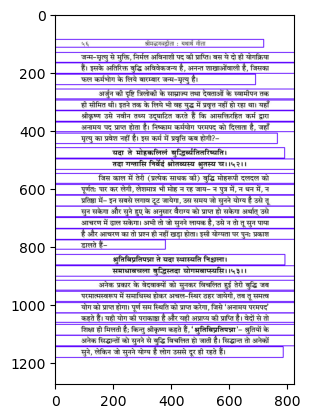

Text for each image:
द्वितीय अध्याय ५७

यह विचलित बुद्धि जिस समय समाधि में स्थिर हो जायेगी, तब तू योग

की पराकाष्ठा अमृत पद को प्राप्त करेगा। इस पर अर्जुन की उत्कण्ठा स्वाभाविक

है कि वे महापुरुष कैसे होते हैं जो अनामय परमपद में स्थित हैं, समाधि में

जिनकी बुद्धि स्थिर है? उसने प्रश्न किया-

अर्जुन उबाच

स्थितप्रज्ञस्थ का भाषा समाधिस्थस्य केशव।

स्थितथी: किं प्रभाषेत किमासीत वजेत किम्‌। । ५४।।

“समाधीयते चित्तं यस्मिन्‌ स आत्मा एवं समाधि: '- जिसमें चित्त

का समाधान किया जाय, वह आत्मा ही समाधि है। अनादि तत्त्व में जो समत्व

प्राप्त कर ले, उसे समाधिस्थ कहते हैं। अर्जुन ने पूछा- केशव | समाधिस्थ

स्थिरबुद्धिवाले महापुरुष के क्‍या लक्षण हैं? स्थितप्रज्ञ पुरुष कैसे बोलता है?

वह कैसे बैठता है? वह कैसे चलता है? चार प्रश्न अर्जुन ने किये। इस पर

भगवान श्रीकृष्ण ने स्थितप्रज्ञ के लक्षण बताते हुए कहा-

श्रीभगवानुवाच

प्रजहाति यदा कामान्‍्सर्वान्पार्थ मनोगतान्‌।

आत्मन्येवात्मना तुष्ट: स्थितप्रज्ञस्तदोच्यते।।५५।।

पार्थ ! जब मनुष्य मन में स्थित सम्पूर्ण कामनाओं को त्याग देता है, तब

वह आत्मा से आ

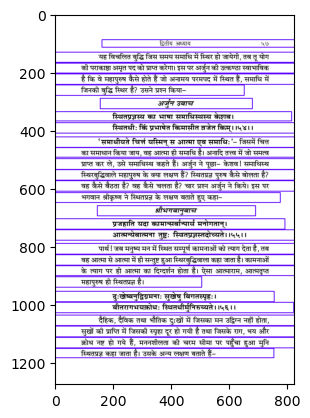

Text for each image:
५८ श्रीमद्भगवद्गीता : यथार्थ गीता

यः सर्वत्रानभिस्नेहस्तत्तत्प्राप्प शुभाशुभम्‌।

नाभिनन्दति न द्वेष्टि तस्य प्रज्ञा प्रतिष्ठिता।।५७।।

जो पुरुष सर्वत्र स्नेहरहित हुआ शुभ अथवा अशुभ को प्राप्त होकर न

तो प्रसन्न होता है और न द्वेष करता है, उसकी बुद्धि स्थिर है। शुभ वह है जो

परमात्मस्वरूप में लगाता है, अशुभ वह है जो प्रकृति की ओर ले जानेवाला

होता है। स्थितप्रज्ञ पुरुष अनुकूल परिस्थितियों से न प्रसन्न होता है और न

प्रतिकूल परिस्थितियों से द्वेष करता है; क्योंकि प्राप्त होने योग्य वस्तु न उससे

भिन्न है और न पतित करनेवाले विकार ही उसके लिये हैं अर्थात्‌ अब साधन

से उसका अपना कोई प्रयोजन नहीं रहा।

यदा संहरते चायं कूर्मो3ड्भानीब सर्वश:।

इन्द्रियाणीन्द्रियार्थेभ्यस्तस्य प्रज्ञा प्रतिष्ठिता। ।५८।।

जिस प्रकार कछुआ अपने अंगों को समेट लेता है, ठीक बैसे ही यह

पुरुष जब सब ओर से अपनी इन्द्रियों को समेट लेता है, तब उसकी बुद्धि स्थिर

होती है। खतरे को देखते ही कछुआ जिस प्रकार अपने सिर और पैर समेट

लेता है, ठीक इसी प्रकार जो पुरुष विषयों में विचरती हुई इन्द्रियों को सब ओर



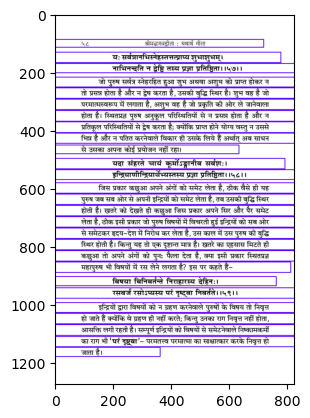

Text for each image:
द्वितीय अध्याय ५९

महापुरुष कछुए की तरह अपनी इन्द्रियों को विषयों में नहीं फैलाता।

एक बार जब इन्द्रियाँ सिमट गयीं तो संस्कार ही मिट जाते हैं, पुनः वे नहीं

निकलते। निष्काम कर्मयोग के आचरण द्वारा परमात्मा के प्रत्यक्ष दर्शन के

साथ उस पुरुष का विषयों से राग भी निवृत्त हो जाता है। प्रायः चिन्तन-पथ में

हठ करते हैं। हठ से इन्द्रियों को रोककर वे विषय से तो निवृत्त हो जाते हैं

किन्तु मन में उनका चिन्तन, राग लगा रहता है। यह आसक्ति 'परं दृष्टवा '-

परमात्मा का साक्षात्कार करने के बाद ही निवृत्त होती है, इसके पूर्व नहीं।

“पूज्य महाराज जी' इस सम्बन्ध में अपनी एक घटना बताया करते थे।

गृहत्याग से पूर्व उन्हें तीन बार आकाशवाणी हुई थी। हमने पूछा- “महाराज

जी! आपको आकाशवाणी क्‍यों हुई, हम लोगों को तो नहीं हुई?” तब इस पर

महाराज जी ने कहा- 'हो ! ई शंका मोहूं के भई रही।' अर्थात्‌ यह सन्देह मुझे

भी हुआ था। तब अनुभव में आया कि मैं सात जन्म से लगातार साधु हूँ। चार

जन्म तो केवल साधुओं-सा वेश बनाये, तिलक लगाये, कहीं विभूति पोते,

कहीं कमण्डल लिये विचरण कर रहा हूँ। योगक्रिया की जान

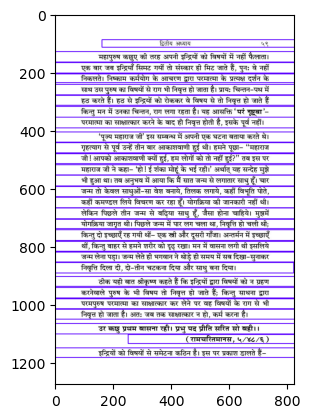

Text for each image:
६० श्रीमद्भगवद्गीता : यथार्थ गीता

यततो ह्वपि कौन्तेय पुरुषस्थ विपश्चित:।

इन्द्रियाणि प्रमाथीनि हरन्ति प्रसभं मन:।।६०।।

कौन्तेय ! प्रयत्न करनेवाले मेधावी पुरुष की प्रमथनशील इन्द्रियाँ उसके

मन को बलात्‌ हर लेती हैं, विचलित कर देती हैं। इसलिये-

तानि सर्वाणि संयम्य युक्त आसीत मत्पर:।

बश्टे हि यस्येन्द्रियाणि तस्य प्रज्ञा प्रतिष्ठिता।।६१।।

उन सम्पूर्ण इन्द्रियों को संयत करके योग से युक्त और समर्पण के

साथ मेरे आश्रित हो; क्योंकि जिस पुरुष की इन्द्रियाँ वश में होती हैं, उसी की

बुद्धि स्थिर होती है। यहाँ योगेश्वर श्रीकृष्ण साधन के निषेधात्मक अवयवों के

साथ उसके विधेयात्मक पहलू पर जोर देते हैं। केवल संयम और निषेध से

इन्द्रियाँ वश में नहीं होतीं, समर्पण के साथ इष्ट-चिन्तन अनिवार्य है। इष्ट-

चिन्तन के अभाव में विषय-चिन्तन होगा, जिसके कुपरिणाम श्रीकृष्ण के ही

शब्दों में देखें-

ध्यायतो विषयान्पुंसः सड्डस्तेषूपजायते।

सड्भात्सझ्ञायते काम: कामात्क्रोधोडभिजायते।।६२।।

विषयों का चिन्तन करनेवाले पुरुष की उन विषयों में आसक्ति हो जाती

है। आसक्ति से कामना उत्पन्न होती है।

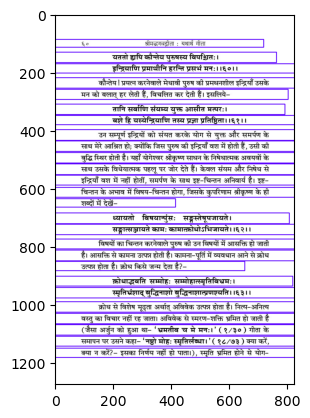

Text for each image:
द्वितीय अध्याय ६१

परायण बुद्धि नष्ट हो जाती है और बुद्धिनाश होने से यह पुरुष अपने श्रेय-

साधन से च्युत हो जाता है।

यहाँ श्रीकृष्ण ने बल दिया है कि विषयों का चिन्तन नहीं करना चाहिये।

साधक को नाम, रूप, लीला और धाम में ही कहीं लगे रहना चाहिये। भजन

में ढील देने पर मन विषयों में जायेगा। विषयों के चिन्तन से आसक्ति हो जाती

है। आसक्ति से उस विषय की कामना साधक के अन्तर्मन में होने लगती है।

कामना की पूर्ति में व्यवधान होने पर क्रोध, क्रोध से अविवेक, अविवेक से

स्मृति- भ्रम और स्मृति- भ्रम से बुद्धि नष्ट हो जाती है। निष्काम कर्मयोग को

बुद्धियोग कहा जाता है; क्योंकि बुद्धि-स्तर पर इसमें विचार रखना चाहिये

कि कामनाएँ न आने पाएँ, फल है ही नहीं। कामना आने से यह बुद्धियोग नष्ट

हो जाता है। 'साधन करिय बिचारहीन मन सुद्ध होय नहिं तैसे।'

( विनयपत्रिका, पद संख्या ११५./३ ) विचार आवश्यक है। विचारशून्य

पुरुष श्रेय-साधन से नीचे गिर जाता है। साधन-क्रम दूट जाता है, सर्वथा नष्ट

नहीं होता। भोग के पश्चात्‌ साधन वहीं से पुनः आरम्भ होता है, जहाँ अवरुद्ध

हुआ था।

यह तो विषयाभिमुख साधक 

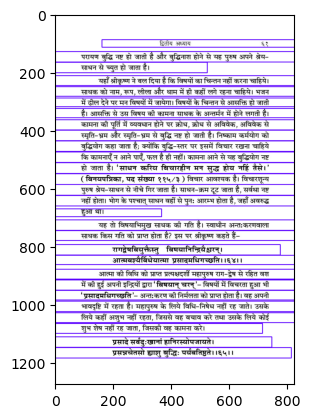

Text for each image:
६२ श्रीमद्भगवद्गीता : यथार्थ गीता

भगवान के पूर्ण कृपा-प्रसाद 'भगवत्ता' से संयुक्त होने पर उसके सम्पूर्ण

दुःखों का अभाव हो जाता है, ' दुःखालयम्‌ अशाश्वतम्‌'।( गीता, ८४१५)

संसार का अभाव हो जाता है और उस प्रसन्नचित्तवाले पुरुष की बुद्धि शीघ्र ही

अच्छी प्रकार स्थिर हो जाती है। किन्तु जो योगयुक्त नहीं है, उसकी दशा पर

प्रकाश डालते हैं-

नास्ति बुद्धिरयुक्तस्थ न चायुक्तस्य भावना।

न चाभावयत: शान्तिरशान्तस्य कुत: सुखम्‌।।६६।।

योगसाधनरहित पुरुष के अन्तःकरण में निष्काम कर्मयुक्त बुद्धि नहीं

होती। उस अयुक्त के अन्तःकरण में भाव भी नहीं होता। भावनारहित पुरुष को

शान्ति कहाँ और अशान्त पुरुष को सुख कहाँ? योगक्रिया करने से कुछ

दिखायी पड़ने पर ही भाव बनता है- 'जानें बिनु न होड परतीती।'

( रामचरितमानस, ७/८८ रख./७) भावना बिना शान्ति नहीं मिलती और

शान्तिरहित पुरुष को सुख अर्थात्‌ शाश्वत, सनातन को प्राप्ति नहीं होती।

इन्द्रियाणां हि चरतां यन्मनो5नु विधीयते।

तदस्य हरति प्रज्ञां वायुर्नावमिवाम्भसि।।६७।।

जल में नाव को जिस प्रकार वायु हरण करके गन्तव्य से दूर कर देती

है, ठीक वै

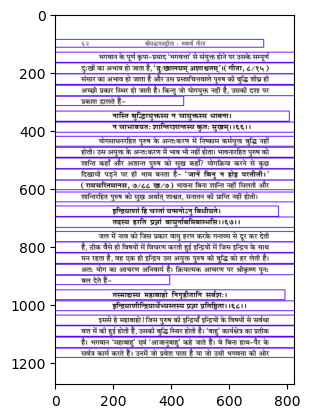

Text for each image:
द्वितीय अध्याय ६३

अग्रसर है वह भी महाबाहु है। श्रीकृष्ण और अर्जुन दोनों को महाबाहु कहा

गया है।

या निशा सर्वभूतानां तस्यां जागर्ति संयमी।

अस्यां जाग्रति भूतानि सा निशा पश्यतो मुने:।।६९।।

सम्पूर्ण भूतप्राणियों के लिये वह परमात्मा रात्रि के तुल्य है; क्योंकि

दिखायी नहीं देता, न विचार ही काम करता है इसलिये रात्रि सदृश है। उस

रात्रि में परमात्मा में संयमी पुरुष भली प्रकार देखता है, चलता है, जागता है;

क्योंकि वहाँ उसकी पकड़ है। योगी इन्द्रियों के संयम द्वारा उसमें प्रजेश पा

जाता है। जिन नाशवान्‌ सांसारिक सुख-भोग के लिये सम्पूर्ण प्राणी रात-दिन

परिश्रम करते हैं, योगी के लिये वही निशा है।

रमा बिलासु राम अनुरागी। तजत बमन जिमि जन बड़भागी।।

( रामचरितमानस, २/३२३/८ )

जो योगी परमार्थ पथ में निरन्तर सजग और भौतिक एषणाओं से

सर्वथा निःस्पृह होता है, जही उस इष्ट में प्रवेश पाता है। वह रहता तो संसार में

ही है; किन्तु संसार का उस पर प्रभाव नहीं पड़ता। महापुरुष की इस रहनी का

चित्रण देखें-

आपूर्यमाणमचलप्रतिष्ठं

समुद्रमाप: प्रविशन्ति यद्वत्‌।

तद्वत्कामा य॑ प्रविशन्ति सर

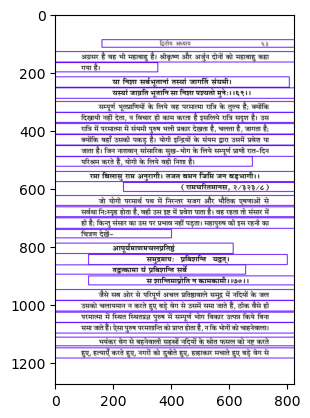

Text for each image:
६४ श्रीमद्भगवद्गीता : यथार्थ गीता

समुद्र में गिरते हैं; किन्तु समुद्र को न एक इंच ऊपर उठा पाते हैं और न गिरा

ही पाते हैं, बल्कि उसी में समाहित हो जाते हैं। ठीक इसी प्रकार स्थितप्रज्ञ

महापुरुष के प्रति सम्पूर्ण भोग उतने ही वेग से आते हैं, किन्तु समाहित हो जाते

हैं। उन महापुरुषों में न शुभ संस्कार डाल पाते हैं, न अशुभ। योगी के कर्म

“अशुक्ल' और “अकृष्ण' होते हैं। क्योंकि जिस चित्त पर संस्कार पड़ते हैं,

उसका निरोध और विलीनीकरण हो गया। इसके साथ ही भगवत्ता की स्थिति

आ गयी। अब संस्कार पड़े भी तो कहाँ? इस एक ही श्लोक में श्रीकृष्ण ने

अर्जुन के कई प्रश्नों का समाधान कर दिया। उसकी जिज्ञासा थी कि स्थितप्रज्ञ

महापुरुष के लक्षण क्या हैं? वह कैसे बोलता है, कैसे बैठता है, कैसे चलता

है? श्रीकृष्ण ने एक ही शब्द में उत्तर दिया कि वे समुद्र॒वत्‌ होते हैं। उनके लिये

विधि-निषेध नहीं होता कि ऐसे बैठो और ऐसे चलो। वे ही परमशान्ति को

प्राप्त होते हैं; क्योंकि वे संयमी हैं। भोगों की कामनावाला शान्ति नहीं पाता।

इसी पर पुनः बल देते हैं-

विहाय कामान्‍य: सर्वान्पुमांश्वरति निःस्पृ

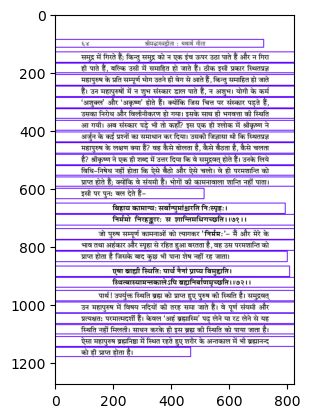

Text for each image:
६६ श्रीमद्भगवद्गीता : यथार्थ गीता

है। ज्ञानयोगी अपनी शक्ति सामने रखकर, अपने हानि-लाभ का जिचार कर

अपने भरोसे चलता है, जबकि दोनों के शत्रु एक ही हैं। ज्ञानमार्गी को काम,

क्रोधादि शत्रुओं पर विजय पाना है और निष्काम कर्मयोगी को भी इन्हीं से युद्ध

करना है। कामनाओं का त्याग दोनों करते हैं और दोनों मार्गों में किया जानेवाला

कर्म भी एक ही है। “इस कर्म के परिणाम में परमशान्ति को प्राप्तहो जाओगे।”-

लेकिन यह नहीं बताया कि कर्म है क्या? अब आपके भी समक्ष 'कर्म' एक

प्रश्न है। अर्जुन के मन में भी कर्म के प्रति जिज्ञासा हुई। तीसरे अध्याय के

आरम्भ में ही उसने कर्मविषयक प्रश्न प्रस्तुत किया। अत:-

ॐ तत्सदिति श्रीमद्धगवद्गीतासूपनिषत्सु ब्रह्मविद्यायां योगशास्त्रे

श्रीकृष्णार्जुनसम्बादे 'कर्मजिज्ञासा' नाम द्वितीयोउध्याय:।।२।।

इस प्रकार श्रीमद्भगवद्‌गीतारूपी उपनिषद्‌ एवं ब्रह्मविद्या तथा योगशास्त्र

विषयक श्रीकृष्ण और अर्जुन के संवाद में “कर्म-जिज्ञासा' नामक दूसरा

अध्याय पूर्ण होता है।

इति श्रीमत्परमहंसपरमानन्दस्य शिष्य स्वामीअड़गड़ानन्दकृते

श्रीमद्भगवद्गीताया: 'यथार्थगीता

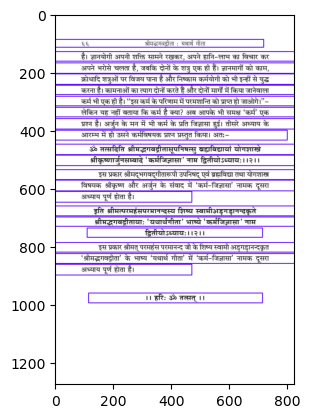

Text for each image:
|| ॐ श्री परमात्मने नमः ||

 || अथ तुतीयोऽथ्याय: ||

अध्याय दो में भगवान श्रीकृष्ण ने बताया कि यह बुद्धि तेरे लिये

ज्ञानमार्ग के विषय में कही गयी। कौन-सी बुद्धि? यही कि युद्ध कर। जीतोगे

तो महामहिम की स्थिति प्राप्त कर लोगे और हारोगे तो देवत्व है। जीत में

सर्वस्व है और हार में भी देवत्व है, कुछ मिलता ही है। अतः इस दृष्टि से लाभ

और हानि दोनों में कुछ-न-कुछ मिलता ही है, किश्वित्‌ भी क्षति नहीं है। फिर

'कहा- अब इसी को तू निष्काम कर्मयोग के विषय में सुन, जिस बुद्धि से युक्त

होकर तू कर्मों के बन्धन से अच्छी प्रकार छूट जायेगा। फिर उसकी विशेषताओं

पर प्रकाश डाला। कर्म करते समय आवश्यक सावधानियों पर बल दिया कि

'फल की जासनावाला न हो, कामनाओं से रहित होकर कर्म में प्रवृत्त हो और

कर्म करने में तेरी अश्रद्धा भी न हो, जिससे तू कर्मबन्धन से मुक्त हो जायेगा।

मुक्त तो होगा; किन्तु रास्ते में अपनी स्थिति नहीं दिखायी पड़ी।

अतः अर्जुन को निष्काम कर्मयोग की अपेक्षा ज्ञानमार्ग सरल और

प्राप्तिबाला प्रतीत हुआ। उसने प्रश्न किया- जनार्दन | निष्काम कर्म की अपेक्षा

ज्ञानमार्ग आपकी 

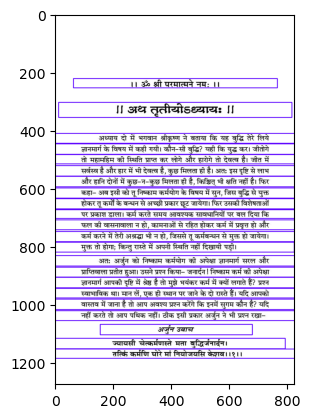

Text for each image:
६८ श्रीमद्धगवद्वीता : यथार्थ गीता

जनों पर दया करनेवाले जनार्दन! यदि निष्काम कर्मयोग की अपेक्षा

ज्ञानयोग आपको श्रेष्ठ मान्य है, तो हे केशव! आप मुझे भयंकर कर्मयोग में

क्यों लगाते हैं?

निष्काम कर्मयोग में अर्जुन को भयंकरता दिखायी पड़ी; क्योंकि इसमें

कर्म करने में ही अधिकार है, फल में कभी नहीं। कर्म करने में अश्रद्धा भी न

हो और निरन्तर समर्पण के साथ योग पर दृष्टि रखते हुए कर्म में लगा रह।

जबकि ज्ञानमार्ग में हारोगे तो देवत्व है, जीतने पर महामहिम स्थिति है। अपनी

लाभ-हानि स्वयं देखते हुए आगे बढ़ना है। इस प्रकार अर्जुन को निष्काम

कर्मयोग की अपेक्षा ज्ञानमार्ग सरल प्रतीत हुआ। इसलिये उसने निवेदन किया-

व्यामिश्रेणेव वाक्येन बुद्धिं मोहयसीब मे।

तदेक॑ बद निश्चित्य येन श्रेयोऽहमाप्नुयाम्‌।।२।।

आप इन मिले हुए-से बचनों से मेरी बुद्धि मोहित-सी करते हैं। आप

तो मेरी बुद्धि का मोह दूर करने में प्रवृत्त हुए हैं। अतः इनमें से एक निश्चय

करके कहिये, जिससे मैं 'श्रेय- परमकल्याण मोक्ष को प्राप्त हो जाऊँ। इस

पर श्रीकृष्ण ने कहा-

श्रीभगवानुवाच

लोकेऽस्मिन्द्विविधा निष्ठा पुरा

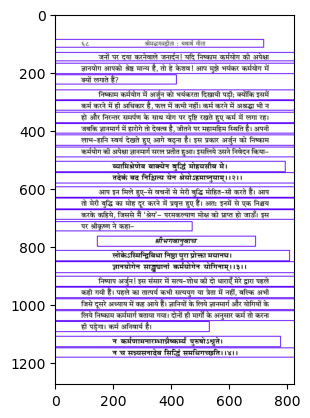

Text for each image:
७० श्रीमद्भगवद्गीता : यथार्थ गीता

कर्मेन्द्रियाणि संयम्य य आस्ते मनसा स्मरन्‌।

इन्द्रियार्थान्विमूढात्मा मिथ्याचार: स उच्यते।। ६।।

इतने पर भी विशेष रूप से मूढुलोग, जो कर्मेन्द्रियों को हठ से रोककर

इन्द्रियों के भोगों का मन से स्मरण करते रहते हैं वे मिथ्याचारी हैं , पाखण्डी हैं,

न कि ज्ञानी। सिद्ध है कि कृष्णकाल में भी ऐसी रूढ़ियाँ थीं। लोग करने योग्य

क्रिया को छोड़कर इन्द्रियों को हठ से रोककर बैठ जाते थे और कहने लगते

थे कि मैं ज्ञानी हूँ, पूर्ण हूँ। किन्तु श्रीकृष्ण कहते हैं कि वे धूर्त हैं। ज्ञानमार्ग

अच्छा लगे या निष्काम कर्मयोग, दोनों ही मार्गों में कर्म तो करना ही पड़ेगा।

यस्त्विन्द्रियाणि मनसा नियम्यारभतेउर्जुन।

कर्मेन्द्रिय: कर्मयोगमसक्त: स विशिष्यते।।७।।

अर्जुन! जो पुरुष मन से इन्द्रियों को वश में करके, जब मन में भी

वासनाओं का स्फुरण न हो, सर्वथा अनासक्त हुआ कर्मेन्द्रियों से कर्मयोग का

आचरण करता है, वह श्रेष्ठ है। ठीक है, समझ में आया कि कर्म का आचरण

करें; किन्तु यह प्रश्न खड़ा होता है कि कौन-सा कर्म करें? इस पर कहते हैं-

'नियतं कुरु कर्म त्वं

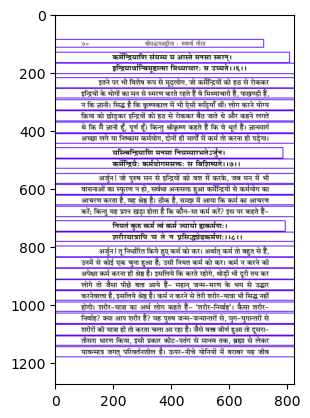

Text for each image:
तृतीय अध्याय ७१

शरीरों की ही तो यात्रा कर रहा है। कर्म कोई ऐसी वस्तु है जो इस यात्रा को

सिद्ध कर देती है, पूर्ण कर देती है। मान लें, एक ही जन्म लेना पड़ा तो यात्रा

जारी है, अभी तो पथिक चल ही रहा है। वह दूसरे शरीरों की यात्रा कर रहा

है। यात्रा पूर्ण तब होती है जब “गन्तव्य' आ जाय। परमात्मा में स्थिति के

अनन्तर इस आत्मा को शरीरों की यात्रा नहीं करनी पड़ती अर्थात्‌ शरीर-त्याग

और शरीर-धारण वाला क्रम समाप्त हो जाता है। अतः कर्म कोई ऐसी वस्तु

है कि इस पुरुष को पुनः शरीरों की यात्रा नहीं करनी पड़ती। 'मोक्ष्यसेडशुभात्‌'

( गीता, ४/१६ )- अर्जुन |! इस कर्म को करके तू संसार-बन्धन 'अशुभ' से

छूट जायेगा। कर्म कोई ऐसी वस्तु है जो संसार-बन्धन से मुक्ति दिलाती है।

अब प्रश्न खड़ा होता है कि वह निर्धारित कर्म है क्या? इस पर कहते हैं-

चज्ञार्थात्कर्मणोउन्यत्र लोकोउऽयं कर्मबन्धन:।

तदर्थ कर्म कौन्तेय मुक्तसड्भ: समाचचर।।९।।

अर्जुन! यज्ञ की प्रक्रिया ही कर्म है। वह हरकत कर्म है, जिससे यज्ञ

पूर्ण होता है। सिद्ध है कि कर्म एक निर्धारित प्रक्रिया है। इसके अतिरिक्त जो

कर्म होते ह

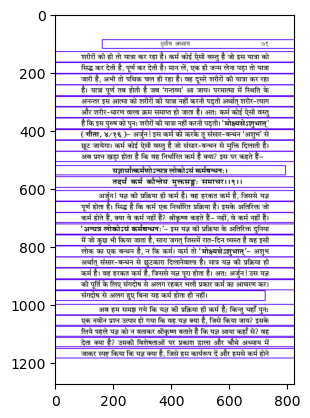

Text for each image:
७२ श्रीमद्भगवद्गीता : यथार्थ गीता

लगे। योगेश्वर श्रीकृष्ण की शैली से स्पष्ट है कि जिस वस्तु का चित्रण करना

है, जे पहले उसकी विशेषताओं का चित्रण करते हैं जिससे श्रद्धा जागृत हो,

तत्पश्चात्‌ वे उसमें बरती जानेवाली सावधानियों पर प्रकाश डालते हैं और

अन्त में मुख्य सिद्धान्त प्रतिपादित करते हैं।

स्मरण रहे कि यहाँ पर श्रीकृष्ण ने कर्म के दूसरे अंग पर प्रकाश डाला

कि कर्म एक निर्धारित क्रिया है। जो कुछ किया जाता है, वह कर्म नहीं है।

अध्याय दो में पहली बार कर्म का नाम लिया, उसकी विशेषताओं पर

बल दिया, उसमें बरती जानेबाली सावधानियों पर प्रकाश डाला, लेकिन यह

नहीं बताया कि कर्म क्‍या है? यहाँ अध्याय तीन में बताया कि कोई बगैर कर्म

किये नहीं रहता। प्रकृति से पराधीन होकर मनुष्य कर्म करता है। इसके

बावजूद भी जो लोग इन्द्रियों को हठ से रोककर मन से विषयों का चिन्तन

करते हैं वे दम्भी हैं-दम्भ का आचरण करनेवाले हैं। इसलिये अर्जुन! मन से

इन्द्रियों को समेटकर तू कर्म कर। किन्तु प्रश्न ज्यों-का-त्यों है कि कौन-सा

कर्म करे? इस पर योगेश्वर श्रीकृष्ण ने कहा- अर्जुन | तू निर्धारित

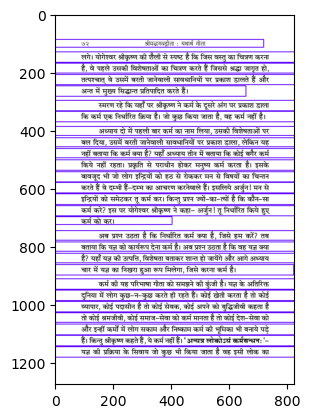

Text for each image:
७४ श्रीमद्भगवद्गीता : यथार्थ गीता

पहले से ही हैं; किन्तु अस्त-व्यस्त एवं विकृत हैं। यज्ञ के अनुरूप उन्हें ढालना

ही रचना या सजाना है।

ऐसे महापुरुष ने कल्प के आदि में यज्ञसहित प्रजा की रचना की। कल्प

नीरोग बनाता है। वैद्य कल्प देते हैं, कोई कायाकल्प कराता है। यह क्षणिक

शरीरों का कल्प है। वास्तविक कल्प तो तब है, जब भवरोग से मुक्ति मिल

जाय। आराधना का प्रारम्भ इस कल्प की शुरुआत है। आराधना पूर्ण हुई तो

आपका कल्प पूरा हो गया।

इस प्रकार परमात्मस्वरूपस्थ महापुरुषों ने भजन के प्रारम्भ में यज्ञलसहित

संस्कारों को सुसंगठित कर कहा कि इस यज्ञ से तुम वृद्धि को प्राप्त होओ।

कैसी वृद्धि? क्या मकान कच्चे से पक्का बन जायेगा? क्या आय अधिक होने

लगेगी? नहीं, यह यज्ञ 'इष्टकामधुक्‌ '- इष्ट-सम्बन्धी कामना की पूर्ति करेगा।

इष्ट है परमात्मा, उस परमात्मा-सम्बन्धी कामना की पूर्तिवाला है। प्रश्न स्वाभाविक

है कि यज्ञ सीधे उस परमात्मा की प्राप्ति करा देगा अथवा क्रम-क्रम से

चलकर?-

देवान्भावयतानेन ते देवा भावयन्तु व:।

'परस्परं भावयन्त: श्रेय: परमवाप्स्यथ।।११।।

इस यज्ञ द्वारा देवताओं 

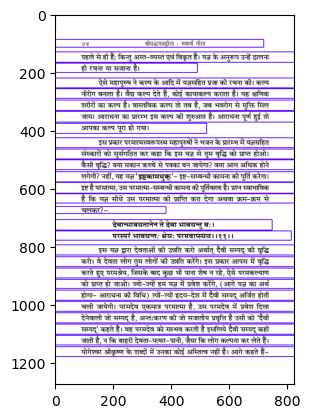

Text for each image:
तृतीय अध्याय ७५

इष्टान्भोगान्हि वो देवा दास्यन्ते यज्ञभाविता:।

तैर्दत्तानप्रदायैभ्यो यो भुडरक्ते स्तेन एव स:।। १२।।

यज्ञ द्वारा संवर्धित देजता (दैवी सम्पद) आपको ' इष्टान्‌ भोगान्‌ हि

दास्यन्ते '- इष्ट अर्थात्‌ आराध्य-सम्बन्धी भोगों को देंगे, अन्य कुछ नहीं। “तैः

दत्तान्‌'- वे ही एकमात्र देनेवाले हैं। इष्ट को पाने का अन्य कोई विकल्प नहीं

है। इन दैवी गुणों को बिना बढ़ाये जो इस स्थिति का भोग करता है वह निश्चय

ही चोर है। जब उसने पाया ही नहीं तो भोगेगा क्या? किन्तु कहता अवश्य है

कि हम तो पूर्ण हैं, तत्त्वदर्शी हैं। ऐसी डींग मारनेवाला इस पथ से मुँह

छिपानेवाला है। वह निश्चय ही चोर है, न कि प्राप्तिवाला। किन्तु पानेबाले

क्या पाते हैं?-

यज्ञशिष्ठाशिन: सनन्‍्तो मुच्यन्ते सर्वकिल्बिषै:।

भुझते ते त्वघं पापा ये पचन्त्यात्मकारणात्‌।। १३।।

यज्ञ से बचे हुए अन्न को खानेवाले सन्‍्तजन सब पापों से मुक्त हो जाते

हैं। दैवी सम्पद्‌ की वृद्धि करते-करते परिणाम में प्राप्तिकाल ही पूर्तिकाल है।

जब यज्ञ पूर्ण हो गया तो शेष बचा हुआ ब्रह्म ही अन्न है। इसी को श्रीकृष्ण ने

दूसरे शब

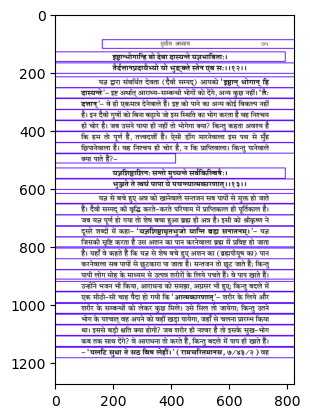

Text for each image:
७६ श्रीमद्भगवद्गीता : यथार्थ गीता

नष्ट तो नहीं होगा; किन्तु आगे नहीं बढ़ेगा। इसलिये श्रीकृष्ण निष्काम भाव से

कर्म (भजन) करने पर बल देते हैं। अभी तक श्रीकृष्ण ने बताया कि यज्ञ

परमश्रेय देता है और उसकी रचना महापुरुष द्वारा होती है। किन्तु वे महापुरुष

प्रजा की रचना में क्‍यों प्रवृत्त होते हैं? इस पर कहते हैं-

अन्नाद्धवन्ति भूतानि पर्जन्यादज्ञसम्भव:।

अज्ञाद्धवति पर्जन्यो यज्ञ: कर्मसमुद्धव:।।१४।।

कर्म बरह्मोद्धवं विद्धि ब्रह्माक्षरसमुद्धवम्‌।

तस्मात्सर्बगतं ब्रह्म नित्य॑ यज्ञे प्रतिष्ठितम्‌।।१५।।

सम्पूर्ण प्राणी अन्न से उत्पन्न होते हैं। 'अन्न॑ं ब्रहोति व्यजानात्‌।'

( तैत्तरीयोपनिषद्‌, भूगुबल्ली २ ) अन्न परमात्मा ही है। उस ब्रह्मपीयूष को

ही उद्देश्य बनाकर प्राणी यज्ञ की ओर अग्रसर होता है। अन्न की उत्पत्ति वृष्टि से

होती है। बादलों से होनेवाली वर्षा नहीं अपितु कृपावृष्टि। पूर्वसंचित यज्ञ-कर्म

ही इस जन्म में, जहाँ से साधन छूटा था, वहीं से इष्टकृपा के रूप में बरस

पड़ता है। आज की आराधना कल कृपा के रूप में मिलेगी। इसीलिये वृष्टि यज्ञ

से होती है। स्वाहा बोलने 

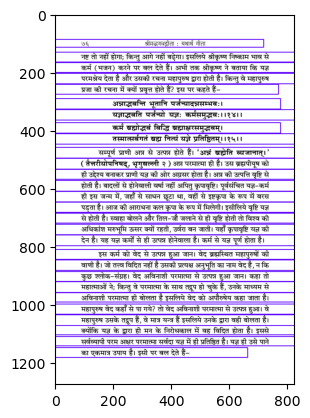

Text for each image:
तृतीय अध्याय ७७

एवं प्रवर्तितं चक्र नानुवर्तमतीह यः।

अधघायुरिन्द्रियारामो मोघं पार्थ स जीवति।।१६।।

हे पार्थ |! जो पुरुष इसी लोक में मनुष्य-शरीर प्राप्त कर इस प्रकार

चलाये हुए साधन-चक्र के अनुसार नहीं बरतता अर्थात्‌ दैवी सम्पद्‌ का

उत्कर्ष, देवताओं की वृद्धि और परस्पर वृद्धि के द्वारा अक्षयधाम को प्राप्त

'करना- इस क्रम के अनुसार जो नहीं बरतता, इन्द्रियों का आराम चाहनेवाला

वह पापायु पुरुष व्यर्थ ही जीता है।

बन्धुओ | योगेश्वर श्रीकृष्ण ने अध्याय दो में कर्म का नाम लिया और

इस अध्याय में बताया कि नियत कर्म का आचरण कर। यज्ञ की प्रक्रिया ही

कर्म है। इसके सिवाय जो कुछ किया जाता है, वह इसी लोक का बन्धन है।

इसीलिये संग-दोष से अलग रहकर उस यज्ञ की पूर्ति के लिये कर्म का

आचरण कर। उन्होंने यज्ञ की विशेषताओं पर प्रकाश डाला और बताया कि

यज्ञ की उत्पत्ति ब्रह्मा से है। प्रजा अन्न को उद्देश्य बनाकर उस यज्ञ में प्रवृत्त

होती है। यज्ञ कर्म से और कर्म अपौरुषेय वेद से उत्पन्न होता है, जबकि

वेदमन्त्रों के द्रश् महापुरुष ही थे। उनका पुरुष तिरोहित हो चुका था, प्राप्ति के

साथ

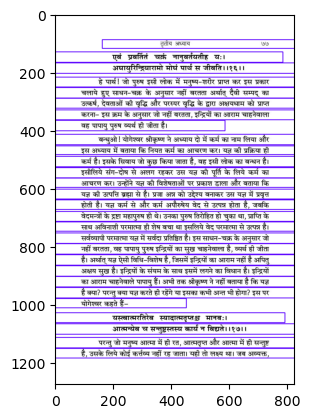

Text for each image:
७८ श्रीमद्भगवद्गीता : यथार्थ गीता

सनातन, अविनाशी आत्मतत्त्व प्राप्त हो गया तो आगे ढूँढ़े किसे? ऐसे पुरुष के

लिये न कर्म की आवश्यकता है, न किसी आराधना की। आत्मा और परमात्मा

एक दूसरे के पर्याय हैं। इसी का पुनः चित्रण करते हैं-

नैब तस्य कृतेनार्थों नाकृतेनेह कश्चन।

न चास्य सर्वभूतेषु कश्चिदर्थव्यपाश्रय:।।१८।।

इस संसार में उस पुरुष का कर्म किये जाने से कोई लाभ नहीं है और

न छोड़ देने से कोई हानि है, जबकि पहले आवश्यक था। उसका सम्पूर्ण

प्राणियों में कोई स्वार्थ-सम्बन्ध नहीं रह जाता। आत्मा ही तो शाश्वत, सनातन,

अव्यक्त, अपरिवर्तशशील और अक्षय है। जब उसी को पा लिया, उसी से

सन्तुष्ट, उसी से तृप्त, उसी में ओतप्रोत और स्थित है, आगे कोई सत्ता ही नहीं

तो किसको खोजे? मिलेगा क्या? उस पुरुष के लिये कर्म छोड़ देने से कोई

हानि भी नहीं है; क्योंकि विकार जिस पर अंकित होते हैं, वह चित्त ही न रहा।

उसका सम्पूर्ण भूतों में, बाह्य जगत्‌ और आन्तरिक संकल्पों की परत में

लेशमात्र भी अर्थ नहीं रहता। सबसे बड़ा अर्थ तो था परमात्मा, जब वही

उपलब्ध है तो दूसरों से उसका क्‍या प्रयोजन होगा

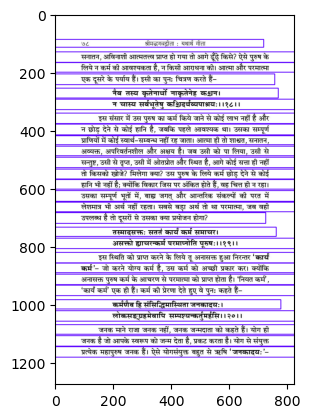

Text for each image:
तृतीय अध्याय ७९

जनक इत्यादि ज्ञानीजन महापुरुष भी “कर्मणा एव हि संसिद्द्धिम्‌'- कर्मों के

द्वारा ही परमसिद्धि को प्राप्त हुए हैं। परमसिद्धि माने परमतत्त्व परमात्मा की

प्राप्ति। जनक इत्यादि जितने भी पूर्व में होनेवाले महर्षि हुए हैं, इस “कार्य कर्मी

के द्वारा, जो यज्ञ की प्रक्रिया है, इस कर्म को करके ही “संसिद्धिम्‌ -

परमसिद्धि को प्राप्त हुए हैं। किन्तु प्राप्ति के पश्चात्‌ जे भी लोकसंग्रह को

देखकर कर्म करते हैं, लोकहित को चाहते हुए कर्म करते हैं। अतः तूभी

प्राप्ति के लिये और प्राप्ति के पश्चात्‌ लोकनायक बनने के लिये कार्य॑ कर्म

करने के ही योग्य है। क्यों?-

अभी श्रीकृष्ण ने कहा था कि प्राप्ति के पश्चात्‌ महापुरुष का कर्म करने

से न कोई लाभ है और न छोड़ने से कोई हानि ही है, फिर भी लोकसंग्रह,

लोकहित व्यवस्था के लिये वे भली प्रकार नियत कर्म का ही आचरण

करते हैं।

यद्यदाचरति श्रेष्ठस्तत्तदेवेतरो जन:।

स यत्प्रमाणं कुरुते लोकस्तदनुवर्तते।। २१।।

श्रेष्ठ पुरुष जो-जो आचरण करता है, अन्य पुरुष भी उसके अनुसार ही

करते हैं। वह महापुरुष जो कुछ प्रमाण कर देता है, संसार

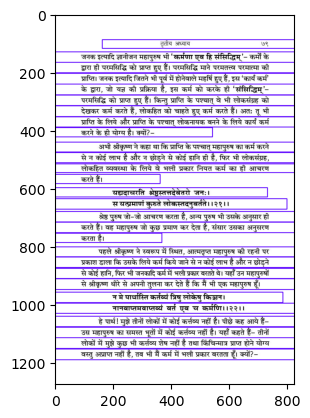

Text for each image:
८० श्रीमद्भगवद्गीता : यथार्थ गीता

यदि हाहं न वर्तेयं जातु कर्मण्यतन्द्रित:।

मम वर्त्मानुवर्तन्ते मनुष्या: पार्थ सर्वश:।।२३।।

क्योंकि यदि मैं सावधान होकर कदाचित्‌ कर्म में न बरतूँ तो मनुष्य मेरे

बर्ताव के अनुसार बरतने लग जायेंगे। तो क्या आपका अनुकरण भी बुरा है?

श्रीकृष्ण कहते हैं- हाँ!

उत्सीदेयुरिमे लोका न कुर्या कर्म चेदहम्‌।

सट्डूरस्य चर कर्ता स्थामुपहन्यामिमा: प्रजा:।। २४।।

यदि मैं सावधान होकर कर्म न करूँ तो यह सब लोक भ्रष्ट हो जायूँ

और मैं 'संकरस्य '- वर्णसंकर का करनेवाला होऊँ तथा इस सारी प्रजा का

हनन करनेवाला, मारनेवाला बनूँ।

स्वरूप में स्थित महापुरुष सतर्क रहकर यदि आराधना-क्रम में न लगे

रहें तो समाज उनकी नकल करके भ्रष्ट हो जायेगा। महापुरुष ने तो आराधना

पूर्ण करके परम नैष्कर्म्य की स्थिति को पाया है। वे न करें तो उनके लिये कोई

हानि नहीं है; किन्तु समाज ने तो अभी आराधना आरम्भ ही नहीं की। पीछेवालों

के मार्गदर्शन के लिये ही महापुरुष कर्म करते हैं, मैं भी करता हूँ अर्थात्‌

श्रीकृष्ण एक महापुरुष थे, न कि बैकुण्ठ से आये हुए कोई विशेष भगवान।

उन्होंने 

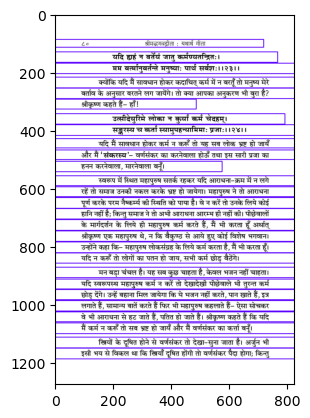

Text for each image:
तृतीय अध्याय ८१

श्रीकृष्ण कहते हैं- यदि मैं सावधान होकर आराधना में लगा न रहूँ तो

वर्णसंकर का कर्त्ता होऊँ। वस्तुतः आत्मा का शुद्ध वर्ण है परमात्मा। अपने

शाश्वत स्वरूप के पथ से भटक जाना वर्णसंकरता है। यदि स्वरूपस्थ महापुरुष

क्रिया में नहीं बरतते तो लोग उनके अनुकरण से क्रियारहित हो जायेंगे,

आत्मपथ से भटक जायेंगे, वर्णसंकर हो जायेंगे। वे प्रकृति में खो जायेंगे।

स्त्रियों का सतीत्व एवं नस्ल की शुद्धता एक सामाजिक व्यवस्था है,

अधिकारों का प्रश्न है, समाज के लिये उसकी उपयोगिता भी है; किन्तु माता-

पिता की भूलों का सन्‍्तान की साधना पर कोई प्रभाव नहीं पड़ता। 'आपन

करनी पार उतरनी। ' हनुमान, व्यास, वशिष्ठ, नारद, शुकदेव, कबीर, ईसा

इत्यादि अच्छे महापुरुष हुए, जबकि सामाजिक कुलीनता से इनका सम्पर्क

नहीं है। आत्मा अपने पूर्वजन्म के गुणधर्म लेकर आता है। श्रीकृष्ण कहते हैं-

“मन: षष्ठानीन्द्रियाणि प्रकृतिस्थानि कर्षति। ' ( १५./७ )- मनसहित इन्द्रियों

से जो कार्य इस जन्म में होता है, उनके संस्कार लेकर जीवात्मा पुराने शरीर

को त्यागकर नवीन शरीर में प्रवेश कर जाता है। इसमें जन

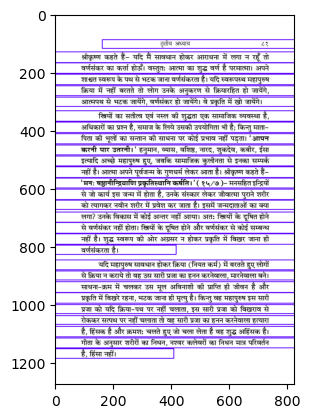

Text for each image:
८२ श्रीमद्भगवद्गीता : यथार्थ गीता

सक्ता: कर्मण्यविद्वांसो यथा कुर्बन्ति भारत।

कुर्याद्विद्वांस्सथासक्तश्चिकीर्षुलोकसङगहम्‌।। २५।।

हे भारत! कर्म में आसक्त हुए अज्ञानीजन जैसे कर्म करते हैं, वैसे ही

अनासक्त हुआ दिद्वानू, पूर्णज्ञाता भी लोक-हृदय में प्रेरणा और कल्याण-

संग्रह चाहता हुआ कर्म करे। यज्ञ की विधि जानते और करते हुए भी हम

अज्ञानी हैं। ज्ञान का अर्थ है प्रत्यक्ष जानकारी। जब तक लेशमात्र भी हम

अलग हैं, आराध्य अलग है तब तक अज्ञान विद्यमान है। जब तक अज्ञान है,

तब तक कर्म में आसक्ति रहती है। अज्ञानी जितनी आसक्ति से आराधना

करता है, उसी प्रकार अनासक्त। जिसे कर्मों से प्रयोजन नहीं है तो आसक्ति

क्यों होगी? ऐसा पूर्णज्ञाता महापुरुष भी लोकहित के लिये कर्म करे, दैवी

सम्पद्‌ का उत्कर्ष करे, जिससे समाज उस पर चल सके।

न बुद्धिभेदं जनझेदज्ञानां कर्मसद्धिनाम्‌।

जोषयेत्सर्वकर्माणि दिद्वान्युक्त: समाचरन्‌।।२६।।

ज्ञानी पुरुषों को चाहिये कि कर्मों में आसक्तिवाले अज्ञानियों की बुद्धि

में भ्रम न पैदा करें अर्थात्‌ स्वरूपस्थ महापुरुष ध्यान दें कि उनके किसी

आचरण से पीछेव

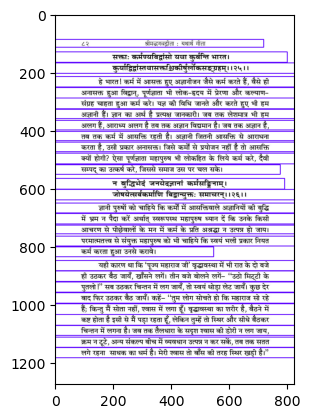

Text for each image:
तृतीय अध्याय ८३

यही कारण है कि अनुयायियों से कराने के लिये वह महापुरुष भली प्रकार

कर्म में बरतता है। 'जिस गुन को सिखाबै, उसे करके दिखावै। '

इस प्रकार स्वरूपस्थ महापुरुष को भी चाहिये कि स्वयं कर्म करता

हुआ साधकों को भी आराधना में लगाये रहे। साधक भी श्रद्धापूर्वक आराधना

में लगें। किन्तु चाहे ज्ञानयोगी हो अथवा समर्पण भाववाला निष्काम कर्मयोगी

हो, साधक में साधना का अहंकार नहीं आना चाहिये। कर्म किसके द्वारा होते

हैं, उसके होने में कौन कारण हैं? इस पर श्रीकृष्ण प्रकाश डालते हैं-

प्रकृते: क्रियमाणानि गुणै: कर्माणि सर्वश:।

अहङ्कारबिमूढात्मा कर्ताहमिति मन्यते।।२७।।

आरम्भ से पूर्तिपर्यन्त कर्म प्रकृति के गुणों द्वारा किये जाते हैं फिर भी

अहंकार से विशेष मूढ पुरुष 'मैं कर्ता हूँ- ऐसा मान लेता है। यह कैसे माना

जाय कि आराधना प्रकृति के गुणों द्वारा होती है? ऐसा किसने देखा? इस पर

कहते हैं-

तत्त्ववित्तु महाबाहो गुणकर्मविभागयो:।

गुणा गुणेषु बर्तन्‍त इति मत्वा न सज्जते।।२८।।

हे महाबाहो ! गुण और कर्म के विभाग को “तत्त्ववित'- परमतत्त्व

परमात्मा की जानकारीवाले महापुरुष

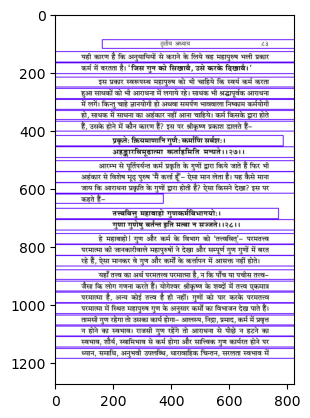

Text for each image:
तृतीय अध्याय ८५

ममतारहित और सन्तापरहित होकर युद्ध कर। जब चित्त ध्यान में स्थित है,

लेशमात्र भी कहीं आशा नहीं, कर्म में ममत्व नहीं है, असफलता का सन्‍्ताप

नहीं है तो वह पुरुष कौन-सा युद्ध करेगा? जब सब ओर से चित्त सिमटकर

हृदय-देश में निरुद्ध होता जा रहा है तो वह लड़ेगा किसलिये, किससे और

वहाँ है कौन? वास्तव में जब आप ध्यान में प्रवेश करेंगे तभी युद्ध का सही

स्वरूप खड़ा होता है, तो काम-क्रोध, राग-द्वेष, आशा-तृष्णा इत्यादि विकारों

का समूह विजातीय प्रवृत्तियाँ जो 'कुरुः कहलाती हैं, संसार में प्रवृत्ति देती ही

रहती हैं। बाधा के रूप में भयंकर आक्रमण करती हैं। बस, इनका पार पाना ही

युद्ध है। इनको मिटाते हुए अन्तरात्मा में सिमटते जाना, ध्यानस्थ होते जाना ही

यथार्थ युद्ध है। इसी पर पुनः बल देते हैं-

ये मे मतमिदं नित्यमनुतिष्ठन्ति मानवा:।

श्रद्धावन्तो5नसूयन्तो मुच्यन्ते तेडपि कर्मभि:।।३१।।

अर्जुन | जो कोई मनुष्य दोषदृष्टि से रहित होकर, श्रद्धाभाव समर्पण से

संयुक्त हुए सदा मेरे इस मत के अनुसार बरतते हैं कि “युद्ध कर', वे पुरुष भी

सम्पूर्ण कर्मों से छूट जाते हैं। यो

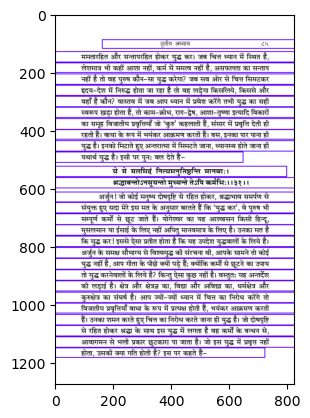

Text for each image:
८६ श्रीमद्भगवद्गीता : यथार्थ गीता

ये त्वेतदभ्यसूयन्तो नानुतिष्ठन्ति मे मतम्‌।

सर्वज्ञानविमूढांस्तान्बिद्धि नष्टानचेतस:।।३२।।

जो दोषदृष्टिवाले 'अचेतस: '- मोहनिशा में अचेत लोग मेरे इस मत के

अनुसार नहीं बरतते अर्थात्‌ ध्यानस्थ होकर आशा, ममता और सन्‍्तापरहित

होकर समर्पण के साथ युद्ध नहीं करते, 'सर्वज्ञानविमूढान्‌'- ज्ञान-पथ में

सर्वथा मोहित उन लोगों को तू कल्याण से भ्रष्ट हुआ ही जान। जब यही सही

है तो लोग करते क्यों नहीं? इस पर कहते हैं-

सदृशं चेष्ठते स्वस्था: प्रकृतेज्ञानवानपि।

प्रकृतिं यान्ति भूतानि निग्रह: कि करिष्यति।।३३।।

सभी प्राणी अपनी प्रकृति को प्राप्त होते हैं। अपने स्वभाव से परवश

होकर कर्म में भाग लेते हैं। प्रत्यक्षदर्शी ज्ञानी भी अपनी प्रकृति के अनुसार

चेष्टा करता है। प्राणी अपने कर्मों में बरतते हैं और ज्ञानी अपने स्वरूप में।

जैसा जिसकी प्रकृति का दबाव है, जैसा ही कार्य करता है। यह स्वयंसिद्ध है।

इसमें निराकरण कोई क्‍या करेगा? यही कारण है कि सभी लोग मेरे मत के

अनुसार कर्म में प्रवृत्त नहीं हो पाते। वे आशा, ममता, संताप का; दूसरे शब्दों

में र

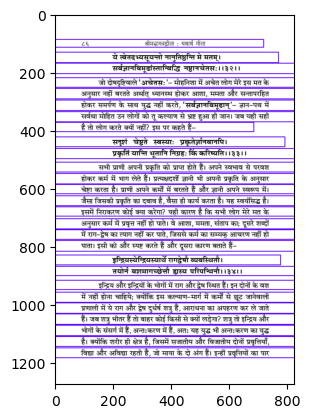

Text for each image:
तृतीय अध्याय ८७

पाना, सजातीय प्रवृत्ति को साधकर विजातीय का अन्त करना युद्ध है। विजातीय

समाप्त होने पर सजातीय का उपयोग समाप्त हो जाता है। स्वरूप का स्पर्श

करके सजातीय का भी उसके अन्तराल में विलय हो जाना, इस प्रकार प्रकृति

का पार पाना युद्ध है, जो ध्यान में ही सम्भव है।

राग और द्वेष के शमन में समय लगता है, इसलिये बहुत से साधक

क्रिया को छोड़कर सहसा महापुरुष की नकल करने लग जाते हैं। श्रीकृष्ण

इससे सावधान करते हैं-

श्रेयान्स्वधर्मो बिगुण: परधर्मात्स्वनुष्ठितात्‌।

स्वधर्मे निधन श्रेय: परधर्मो भयावह:।।३५।।

एक साधक दस वर्ष से साधना में लगा हुआ है और दूसरा आज

साधना में प्रवेश ले रहा है। दोनों की क्षमता एक-जैसी नहीं होगी। प्रारम्भिक

साधक यदि उसकी नकल करता है तो नष्ट हो जायेगा। इसी पर श्रीकृष्ण कहते

हैं कि अच्छी प्रकार आचरण किये हुए दूसरे के धर्म से गुणरहित भी अपना

धर्म अधिक उत्तम है। स्वभाव से उत्पन्न कर्म में प्रवृत्त होने की क्षमता स्वधर्म

है। अपनी क्षमता के अनुसार कर्म में प्रवृत्त होने से साधक एक-न-एक दिन

पार पा जाता है। अतः स्वधर्माचरण में मरना भी परम कल

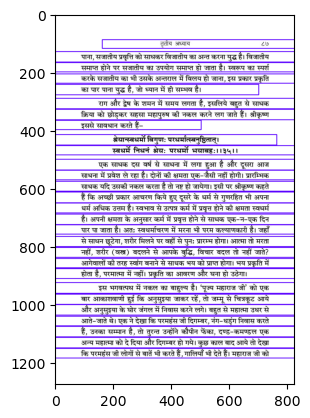

Text for each image:
९० श्रीमद्भगवद्गीता : यथार्थ गीता

धूमेनाब्रियते बह्निर्यथादर्शो मलेन ञ्ञ।

यथोल्बेनावृतो गर्भस्तथा तेनेदमावृतम्‌।।३८।।

जैसे धुएँ से अग्नि और मल से दर्पण ढँक जाता है, जैसे जेर से गर्भ

ढँका हुआ है, ठीक बैसे ही काम-क्रोधादि विकारों से यह ज्ञान ढँका हुआ है।

भींगी लकड़ी जलाने पर धुआँ-ही-धुआँ होता है। अग्नि रहकर भी लपट का

रूप नहीं ले पाती। मल से ढँके दर्पण पर जिस प्रकार प्रतिबिम्ब स्पष्ट नहीं

होता, झिल्ली के कारण जिस प्रकार गर्भ ढँका रहता है, बैसे ही इन विकारों के

रहते परमात्मा का प्रत्यक्ष ज्ञान नहीं होता।

आवृतंज्ञानमेतेन ज्ञानिनो नित्यवैरिणा।

'कामरूपेण कौन्तेय दुष्पूरेणानलेन च।।३९।।

'कौन्तेय ! अग्नि के समान भोगों से न तृप्त होनेवाले, ज्ञानियों के निरन्तर

बैरी इस काम से ज्ञान ढँका हुआ है। अभी तो श्रीकृष्ण ने काम और क्रोध दो

शत्रु बताये। प्रस्तुत श्लोक में वे केजल एक शत्रु काम का नाम लेते हैं। वस्तुतः

काम में क्रोध का अन्तर्भाव है। कार्य पूर्ण होने पर क्रोध समाप्त हो जाता है;

किन्तु कामना समाप्त नहीं होती। कामना-पूर्ति में व्यवधान पड़ते ही क्रोध

पुनः उभर आ

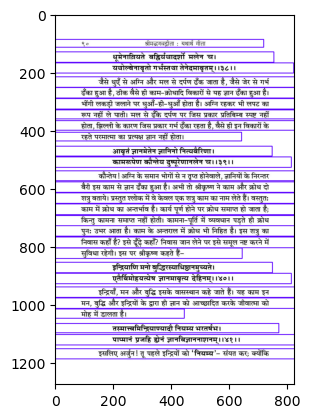

Text for each image:
तृतीय अध्याय ९१

शत्रु तो इनके अन्तराल में छिपा है। वह तुम्हारे शरीर के भीतर है। बाहर

खोजने से वह कहीं नहीं मिलेगा। यह हृदय-देश की, अन्तर्जगत्‌ की लड़ाई है।

इन्द्रियों को वश में करके ज्ञान और विज्ञान का नाश करनेवाले इस पापी काम

को ही मार। काम सीधे पकड़ में नहीं आयेगा अतः विकारों के निबास-स्थान

का ही घेराव कर लो, इन्द्रियों को ही संयत कर लो। किन्तु इन्द्रियों और मन

को संयत करना तो बड़ा कठिन है, क्या यह हम कर पायेंगे? इस पर श्रीकृष्ण

आपकी सामर्थ्य बताते हुए प्रोत्साहित करते हैं-

इन्द्रियाणि पराण्याहुरिन्द्रियेभ्य: पर॑ मन:।

मनसस्तु परा बुद्धिर्यों बुद्धेः परतस्तु स:।।४२।।

अर्जुन! इस शरीर से तू इन्द्रियों को परे अर्थात्‌ सूक्ष्म और बलवान

जान। इन्द्रियों से परे मन है, यह उनसे भी बलवान्‌ है। मन से परे बुद्धि है और

जो बुद्धि से भी अत्यन्त परे है, वह तुम्हारी आत्मा है। वही हो तुम। इसलिये

इन्द्रियाँ, मन और बुद्धि का निरोध करने में तुम सक्षम हो।

एवं बुद्धे: परं बुद्धवा संस्तभ्यात्मानमात्मना।

जहि शज्रुं महाबाहो कामरूपं दुरासदम्‌।।४३।।

इस प्रकार बुद्धि से परे अर

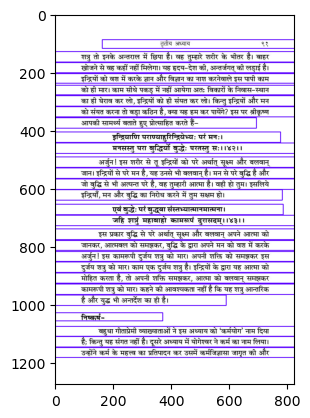

Text for each image:
९२ श्रीमद्भगवद्गीता : यथार्थ गीता

इस अध्याय में उन्होंने कर्म को परिभाषित किया कि यज्ञ की प्रक्रिया ही कर्म

है। सिद्ध है कि यज्ञ कोई निर्धारित दिशा है। इसके अतिरिक्त जो कुछ भी किया

जाता है, वह इसी लोक का बन्धन है। श्रीकृष्ण जिसे कहेंगे, बह कर्म

“मोक्ष्यसे उशुभात्‌ '- संसार-बन्धन से छुटकारा दिलानेवाला कर्म है।

श्रीकृष्ण ने यज्ञ की उत्पत्ति को बताया। वह देता कया है? उसकी

विशेषताओं का चित्रण किया। यज्ञ करने पर बल दिया। उन्होंने कहा, इस यज्ञ

की प्रक्रिया ही कर्म है। जो नहीं करते वे पापायु, आराम चाहनेवाले व्यर्थ जीते

हैं। पूर्व में होनेवाले महर्षियों ने भी इसे करके ही परम नैष्कर्म्य-सिद्धि को

पाया। वे आत्मतृप्त हैं, उनके लिये कर्म की आवश्यकता नहीं है, फिर भी

पीछेवालों के मार्गदर्शन के लिये वे भी कर्म में भली प्रकार लगे रहते थे। उन

महापुरुषों से श्रीकृष्ण ने अपनी तुलना की कि मेरा भी अब कर्म करने से कोई

प्रयोजन नहीं है; किन्तु मैं भी पीछेवालों के हित के लिये ही कर्म में बरतता हूँ।

श्रीकृष्ण ने स्पष्ट अपना परिचय दिया कि वे एक योगी थे।

उन्होंने कर्म में प्रवृत

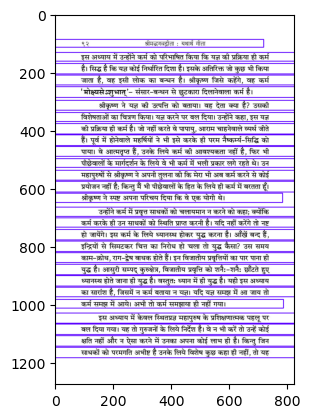

Text for each image:
तृतीय अध्याय ९३

कर्मयोग कैसे है? कर्म का स्वरूप भी स्पष्ट नहीं है, जिसे किया जाय; क्योंकि

“यज्ञ की प्रक्रिया ही कर्म है" अभी तक उन्होंने इतना ही बताया। यज्ञ तो

बताया नहीं, कर्म का स्वरूप स्पष्ट कहाँ हुआ? हाँ, युद्ध का यथार्थ चित्रण

गीता में यहीं पाया जाता है।

सम्पूर्ण गीता पर दृष्टिपात करें तो अध्याय दो में कहा कि शरीर नाशवान्‌

है, अतः युद्ध कर। गीता में युद्ध का यही ठोस कारण बताया गया। आगे

ज्ञानयोग के सन्दर्भ में क्षत्रिय के लिये युद्ध ही कल्याण का एकमात्र साधन

बताया और कहा कि यह बुद्धि तेरे लिये ज्ञानयोग के विषय में कही गयी।

कौन-सी बुद्धि? यही कि हार-जीत दोनों दृष्टियों में लाभ ही है, ऐसा समझकर

युद्ध कर। फिर अध्याय चार में कहा कि योग में स्थित रहकर हृदय में स्थित

अपने इस संशय को ज्ञानरूपी तलवार द्वारा काट। वह तलबार योग में है।

अध्याय पाँच से दस तक युद्ध की चर्चा तक नहीं है। ग्यारहवें अध्याय में

केवल इतना कहा कि ये शत्रु मेरे द्वारा पहले से ही मारे गये हैं, तू निमित्त मात्र

होकर खड़ा भर हो जा। यश को प्राप्त कर। ये तुम्हारे बिना भी मारे हुए हैं,

प्रे

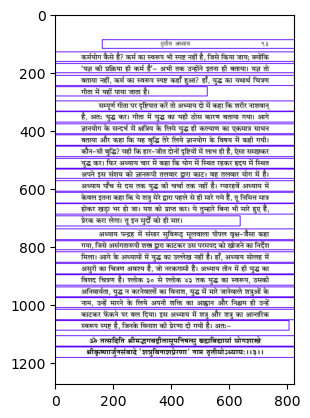

Text for each image:
९४ श्रीमद्भगवद्गीता : यथार्थ गीता

इस प्रकार श्रीमद्भगवद्‌गीतारूपी उपनिषद्‌ एवं ब्रह्मविद्या तथा योगशाख

विषयक श्रीकृष्ण और अर्जुन के संवाद में “शत्रुविनाश-प्रेरणा' नामक तीसरा

अध्याय पूर्ण होता है।

इति श्रीमत्परमहंसपरमानन्दस्य शिष्य स्वामीअड़गड़ानन्दकृते

श्रीमद्धवगद्रीताया: “यथार्थगीता' भाष्ये 'शत्रुविनाशप्रेरणा' नाम

तृतीयो5ध्याय:।।३।।

इस प्रकार श्रीमत्‌ परमहंस परमानन्द जी के शिष्य स्वामी अड़गड़ानन्दकृत

'श्रीमद्धगवद़ीता' के भाष्य “यथार्थ गीता' में 'शत्रुविनाश-प्रेरणा' नामक तीसरा

अध्याय पूर्ण होता है।

|| हरि: ॐ तत्सत्‌ ||



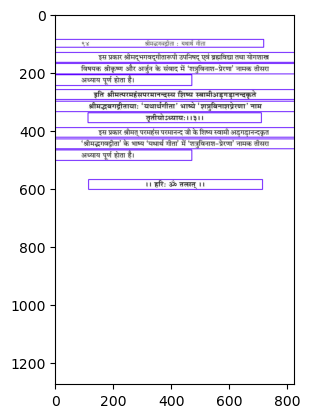

Text for each image:
॥ॐ श्री परमात्मने नमः ।।

॥ अथ चतुर्थोऽध्याय३ ॥|

अध्याय तीन में योगेश्वर श्रीकृष्ण ने आश्वस्त किया कि दोषदृष्टि से

रहित होकर जो भी मानव श्रद्धायुक्त हो मेरे मत के अनुसार चलेगा, वह कर्मों

के बन्धन से भली प्रकार छूट जायेगा। कर्मबन्धन से मुक्ति दिलाने की क्षमता

योग (ज्ञानयोग तथा कर्मयोग, दोनों) में है। योग में ही युद्ध-संचार निहित है।

प्रस्तुत अध्याय में वे बताते हैं कि इस योग का प्रणेता कौन है? इसका क्रमिक

विकास कैसे होता है?

श्रीभगवानुवाच

इमं विवस्वते योगं प्रोक्तवानहमव्ययम्‌।

विवस्वान्मनवे प्राह मनुरिक्ष्याकवेऽब्बीतू।। १।।

अर्जुन! मैंने इस अविनाशी योग को कल्प के आदि में विवस्वान्‌

(सूर्य) के प्रति कहा, विवस्वान्‌ ने मनु से और मनु ने इक्ष्वाकु से कहा। किसने

'कहा? मैंने। श्रीकृष्ण कौन थे? एक योगी। तत्त्वस्थित महापुरुष ही इस अविनाशी

योग को कल्प के आरम्भ में अर्थात्‌ भजन के आरम्भ में विवस्वान्‌ अर्थात्‌ जो

विवश हैं, ऐसे प्राणियों से कहता है। सुरा में संचार कर देता है। यहाँ सूर्य एक

प्रतीक है; क्योंकि सुरा में ही वह परम प्रकाशस्जरूप है और वहीं उसके पाने



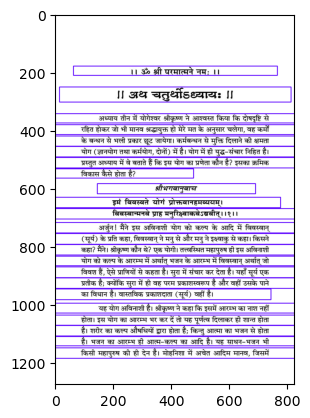

Text for each image:
९६ श्रीमद्भगवद्गीता : यथार्थ गीता

भजन का कोई संस्कार नहीं है, योग के विषय में जिसने कभी सोचा तक

नहीं, ऐसा मनुष्य किसी महापुरुष को देखता है तो उनके दर्शनमात्र से,

उनकी वाणी से, टूटी-फूटी सेवा और सात्रिध्य से योग के संस्कार उसमें

संचारित हो जाते हैं। गोस्वामी तुलसीदास जी इसी को कहते हैं- 'जे चितए्‌

प्रभु जिन्ह प्रभु हेरे। ', 'ते सब भए परम पद जोगू। ' ( रामचरितमानस,

२/२१६/१-२ )।

श्रीकृष्ण कहते हैं- यह योग मैंने आरम्भ में सूर्य से कहा। “चक्षो:

सूर्यो अजायत'- महापुरुष के दृष्टि-निक्षेप मात्र से योग के संस्कार सुरा में

प्रसारित हो जाते हैं। स्वयंप्रकाश, स्त्जश परमेश्वर का निवास सबके हृदय में

है। सुरा (श्वास) के निरोध से ही उसकी प्राप्ति का विधान है। सुरा में संस्कारों

का सृजन ही सूर्य के प्रति कहना है। समय आने पर यह संस्कार मन में स्फुरित

होगा, यही सूर्य का मनु से कहना है। मन में स्फुरित होने पर महापुरुष के उस

वाक्य के प्रति इच्छा जाग्रत हो जायेगी। यदि मन में कोई बात है तो उसे पाने

की इच्छा अवश्य होगी, यही मनु का इक्ष्वाकु से कहना है। लालसा होगी कि

वह नियत 

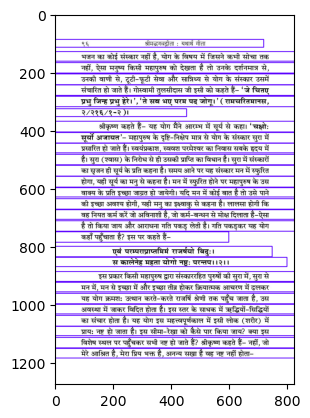

Text for each image:
चतुर्थ अध्याय ९७

स एवायं मया तेऽध योग: प्रोक्त: पुरातन:।

भक्तोउसि मे सखा चेति रहस्यं होतदुत्तमम्‌।।३।।

वह ही यह पुरातन योग अब मैंने तेरे लिये वर्णन किया है; क्योंकि तू

मेरा भक्त और सखा है और यह योग उत्तम रहस्यपूर्ण है। अर्जुन क्षत्रिय श्रेणी

का साधक था, राजर्षि की अवस्थावाला था, जहाँ ऋद्धियों-सिद्धियों के थपेड़े

में साधक नष्ट हो जाता है। इस काल में भी योग कल्याण की मुद्रा में ही है;

किन्तु प्रायः साधक यहाँ पहुँचकर लड़खड़ा जाते हैं। ऐसा अविनाशी किन्तु

रहस्यमय योग श्रीकृष्ण ने अर्जुन से कहा, क्योंकि नष्ट होने की अवस्था में

अर्जुन था ही। क्‍यों कहा? इसलिये कि तू मेरा भक्त है, अनन्य भाव से मेरे

अश्रित है, प्रिय है, सखा है।

जिस परमात्मा की हमें चाह है, वह (सद्गुरु) परमात्मा आत्मा से

अभिन्न होकर जब निर्देशन देने लगे, तभी वास्तविक भजन आरम्भ होता है।

यहाँ प्रेरक की अवस्था में परमात्मा और सद्गुरु एक दूसरे के पर्याय हैं। जिस

सतह पर हम खड़े हैं उसी स्तर पर जब स्वयं प्रभु हृदय में उतर आयें, रोकथाम

करने लगें, डगमगाने पर सँभालें, तभी मन वश में हो पाता है- ' तुलसिद

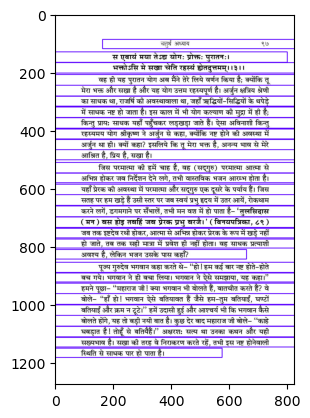

Text for each image:
चतुर्थ अध्याय ९९

मैं विनाशरहित, पुनः जन्मरहित और समस्त प्राणियों के स्वर में संचारित

होने पर भी अपनी प्रकृति को अधीन करके आत्ममाया से प्रकट होता हूँ। एक

माया तो अविद्या है जो प्रकृति में ही विश्वास दिलाती है, नीच एवं अधम

योनियों का कारण बनती है। दूसरी माया है आत्ममाया, जो आत्मा में प्रवेश

दिलाती है, स्वरूप के जन्म का कारण बनती है। इसी को योगमाया भी कहते

हैं। जिससे हम विलग हैं उस शाश्वत स्वरूप से यह जोड़ती है, मिलन कराती

है। उस आत्पमिक प्रक्रिया द्वारा मैं अपनी त्रिगुणमयी प्रकृति को अधीन करके

ही प्रकट होता हूँ।

प्रायः लोग कहते हैं कि भगवान का अवतार होगा तो दर्शन कर लेंगे।

श्रीकृष्ण कहते हैं कि ऐसा कुछ नहीं होता कि कोई दूसरा देख सके। स्वरूप

का जन्म पिण्डरूप में नहीं होता। श्रीकृष्ण कहते हैं- योग-साधना द्वारा,

आत्ममाया द्वारा अपनी त्रिगुणमयी प्रकृति को स्ववश करके मैं क्रमशः प्रकट

होता हूँ। लेकिन किन परिस्थितियों में?-

यदा यदा हि धर्मस्य ग्लानिर्भवति भारत।

अभ्युत्थानमधर्मस्य तदात्मानं सृजाम्यहम्‌।।७।।

हे अर्जुन! जब-जब परमधर्म परमात्मा के लिये हृदय ग्लान

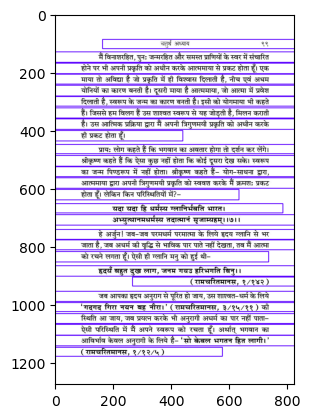

Text for each image:
१०० श्रीमद्भगवद्गीता : यथार्थ गीता

यह अवतार किसी भाग्यवान्‌ साधक के अन्तराल में होता है। आप

प्रकट होकर करते क्या हैं?-

परित्राणाय साधूनां विनाशाय च दुष्कृताम्‌।

धर्मसंस्थापनार्थाय सम्भवामि युगे युगे।।८।।

अर्जुन ! ' साधूनां परित्राणाय '- परमसाध्य एकमात्र परमात्मा है, जिसे

साध लेने पर कुछ भी साधना शेष नहीं रह जाता। उस खाध्य में प्रवेश

दिलानेवाले विवेक, वैराग्य, शम, दम इत्यादि दैवी सम्पद्‌ को निर्विध्न प्रजाहित

करने के लिये तथा 'दुष्कृताम्‌'- जिनसे दूषित कार्यरूप लेते हैं उन काम,

क्रोध, राग, द्वेषादि विजातीय प्रवृत्तियों को समूल नष्ट करने के लिये तथा धर्म

को भली प्रकार स्थिर करने के लिये मैं युग-युग में प्रकट होता हूँ।

युग का तात्पर्य सत्ययुग, त्रेता या द्वापर नहीं, युगधर्मों का उतार-चढ़ाव

मनुष्यों के स्वभाव पर है। युगधर्म सदैव रहते हैं। मानस में संकेत है-

नित जुग धर्म होहिं सब केरे। हृदयँ राम माया के प्रेरे।।

( रामचरितमानस, ७/१०३ ख/१)

युगधर्म सभी के हृदय में नित्य होते रहते हैं। अविद्या से नहीं बल्कि

विद्या से, राममाया की प्रेरणा से हृदय में होते हैं।

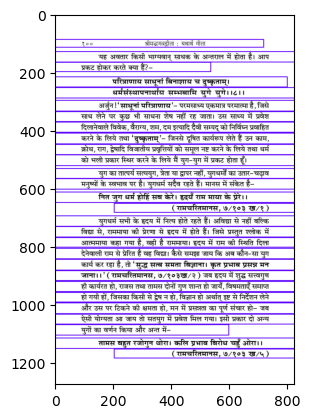

Text for each image:
चतुर्थ अध्याय १०१

तामसी गुण भरपूर हो, किंचित्‌ राजसी गुण भी उसमें हो, चारों ओर बैर

और विरोध हो तो ऐसा व्यक्ति कलियुगीन है। जब तामसी गुण कार्य करता है

तो मनुष्य में आलस्य, निद्रा, प्रमाद का बाहुल्‍य होता है। वह कर्त्तव्य जानते

हुए भी उसमें प्रवृत्त नहीं हो सकता, निषिद्ध कर्म जानते हुए भी उससे निवृत्त

नहीं हो सकता। इस प्रकार युगधर्मों का उतार-चढ़ाव मनुष्यों की आन्तरिक

योग्यता पर निर्भर है। किसी ने इन्हीं योग्यताओं को चार युग कहा है, तो कोई

इन्हें ही चार वर्ण का नाम देता है, तो कोई इन्हें ही अति उत्तम, उत्तम, मध्यम

और निकृष्ट चार श्रेणी के साधक कहकर सम्बोधित करता है। प्रत्येक युग में

इष्ट साथ देते हैं। हाँ, उच्चश्रेणी में अनुकूलता की भरपूरता प्रतीत होती है,

निम्न युगों में सहयोग क्षीण प्रतीत होता है।

संक्षेप में, श्रीकृष्ण कहते हैं- साध्य वस्तु दिलानेबाले विवेक, बैराग्य

इत्यादि को निर्विघ्न प्रवाहित करने के लिये तथा दूषण के कारक काम-क्रोध,

राग-द्वेष इत्यादि का पूर्ण विनाश करने के लिये, परमधर्म परमात्मा में स्थिर

रखने के लिये मैं युग-युग में अर्थात्‌ हर प

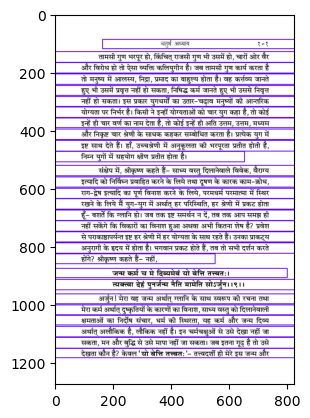

Text for each image:
चतुर्थ अध्याय १०३

हैं। आप जो हो सकते हैं, वह मैं हो गया हूँ। मैं आपकी सम्भावना हूँ, आपका

ही भविष्य हूँ। अपने भीतर आप जिस दिन ऐसी पूर्णता पा लेंगे तो आप भी

वही होंगे जो श्रीकृष्ण हैं। जो श्रीकृष्ण का स्वरूप है, वही आपका भी हो

सकता है। अवतार कहीं बाहर नहीं होता। हाँ, यदि अनुरागपूरित हृदय हो तो

आपके भीतर भी अवतार की अनुभूति सम्भव है। वे आपको प्रोत्साहित करते

हैं कि बहुत से लोग इस मार्ग पर चलकर मेरे स्वरूप को प्राप्त कर चुके हैं-

बीतरागभयक्रोधा मन्मया मामुपाश्रिता:।

बहवो ज्ञानतपसा पूता मद्भावमागता:।।१०।।

राग और विराग, दोनों से परे वीतराग तथा इसी प्रकार भय-अभय,

क्रोध-अक्रोध दोनों से परे, अनन्य भाव से अर्थात्‌ अहंकाररहित मेरी शरण हुए

बहुत से लोग ज्ञान-तप से पवित्र होकर मेरे स्वरूप को प्राप्त हो चुके हैं। अब

ऐसा होने लगा हो- ऐसी बात नहीं है, यह विधान सदैव रहा है। बहुत से पुरुष

इसी प्रकार से मेरे स्वरूप को प्राप्त हो चुके हैं। किस प्रकार? जिन-जिन का

हृदय अधर्म की वृद्धि देखकर परमात्मा के लिये ग्लानि से भर गया, उस

स्थिति में मैं अपने स्वरूप को रचता ह्ँ। ते मे

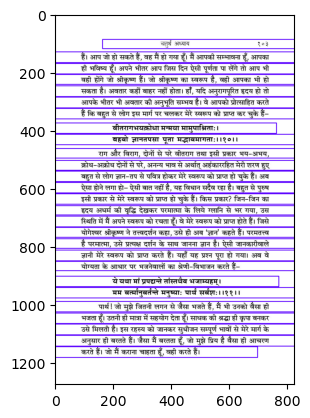

Text for each image:
१०४ श्रीमद्धगवद्गीता : यथार्थ गीता

भगवान कैसे भजते हैं? वे रथी बनकर खड़े हो जाते हैं, साथ चलने

लगते हैं, यही उनका भजना है। दूषित जिनसे पैदा होते हैं, उनका विनाश करने

के लिये वे खड़े हो जाते हैं। सत्य में प्रवेश दिलानेवाले सद्‌गुणों का परित्राण

करने के लिये वे खड़े हो जाते हैं। जब तक इष्टदेव हृदय से पूर्णतः रथी न हों

और हर कदम पर सावधान न करें, तब तक कोई कैसा ही भजनानन्दी क्‍यों

न हो, लाख आँख मूँदे, लाख प्रयत्न करे, वह इस प्रकृति के द्वन्द्द से पार नहीं

हो सकता। वह कैसे समझेगा कि वह कितनी दूरी तय कर चुका, कितनी शेष

है। इष्ट ही आत्मा से अभिन्न होकर खड़े हो जाते हैं और उसका मार्गदर्शन करते

हैं कि तुम यहाँ पर हो, ऐसे करो, ऐसे चलो। इस प्रकार प्रकृति की खाईं पाटते

हुए, शनैः-शनैः आगे बढ़ाते हुए स्वरूप में प्रजेश दिला देंगे। भजन तो साधक

को ही करना पड़ता है; किन्तु उसके द्वारा इस पथ में जो दूरी तय होती है, बह

इष्ट की देन है। ऐसा जानकर सभी मनुष्य सर्वतोभावेन मेरा अनुसरण करते हैं।

किस प्रकार जे बरतते हैं?-

काङक्षन्त: कर्मणां सिद्धिं यजन्त इह देवता:।

क्षिप्रं हि

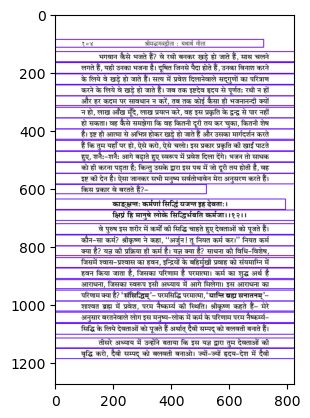

Text for each image:
चतुर्थ अध्याय १०५

सम्पद्‌ की उन्नति होगी, त्यों-त्यों तुम्हारी उन्नति होगी। इस प्रकार परस्पर उन्नति

करते हुए परमश्रेय को प्राप्त हो जाओ। अन्त तक उन्नति करते जाने की यह

अन्तःक्रिया है। इसी पर बल देते हुए श्रीकृष्ण कहते हैं- मेरे अनुकूल बरतनेवाले

लोग इस मनुष्य-शरीर में कर्मों की सिद्धि चाहते हुए दैवी सम्पद्‌ को बलवती

बनाते हैं, जिससे वह नैष्कर्म्य-सिद्धि शीघ्र होती है। बह असफल नहीं होती,

सफल ही होती है। शीघ्र का तात्पर्य? क्या कर्म में प्रवृत्त होते ही तत्क्षण यह

परमसिद्धि मिल जाती है? श्रीकृष्ण कहते हैं- नहीं, इस सोपान पर क्रमशः

चढ़ने का विधान है। कोई छलांग लगाकर भाषातीत ध्यान-जैसा चमत्कार

नहीं होता। इस पर देखें-

चातुर्वर्ण्य मया सृष्ठ॑ गुणकर्मविभागश:।

तस्य कर्तारमपि मां विद्धयकर्तारमव्ययम्‌।।१३।।

अर्जुन | “चातुर्वर्ण्य मया सृष्टम्‌ '- चार वर्णों की रचना मैंने की। तो

क्या मनुष्यों को चार भागों में बाँट दिया? श्रीकृष्ण कहते हैं- नहीं, “गुणकर्म-

विभागश: '-गुणों के माध्यम से कर्म को चार भागों में बाँटा। गुण एक पैमाना

है, मापदण्ड है। तामसी गुण होगा तो आलस

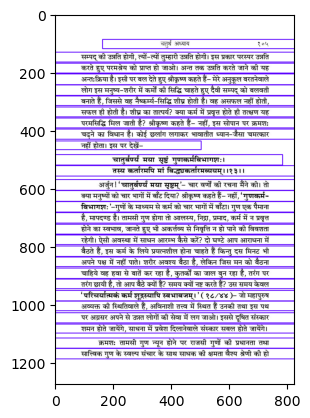

Text for each image:
१०८ श्रीमद्भगवद्गीता : यथार्थ गीता

अकर्म क्‍या है? इस विषय में बड़े-बड़े विद्वान्‌ भी मोहित हैं, उसे भली प्रकार

समझ लेना चाहिये।

किं कर्म किमकर्मेति कवयोउप्यत्र मोहिता:।

तत्ते कर्म प्रवक्ष्यामि यज्ज्ञात्वा मोक्ष्यसेडशुभात्‌।। १६।।

कर्म क्या है और अकर्म क्‍या है?- इस विषय में बुद्धिमान्‌ पुरुष भी

मोहित हैं। इसलिये मैं वह कर्म तेरे लिये अच्छी तरह से कहूँगा, जिसे जानकर

तू 'अशुभात््‌ मोक्ष्यसे '- अशुभ अर्थात्‌ संसार-बन्धन से भली प्रकार छूट

जायेगा। कर्म कोई ऐसी वस्तु है, जो संसार-बन्धन से मुक्ति दिलाती है। इसी

कर्म को जानने के लिये श्रीकृष्ण पुनः बल देते हैं-

'कर्मणो हापि बोद्धव्यं बोद्धव्यं च विकर्मण:।

अकर्मणश्च बोद्धव्यं गहना कर्मणो गति:।।१७।।

कर्म का स्वरूप भी जानना चाहिये, अकर्म का स्वरूप भी समझना

चाहिये और विकर्म अर्थात्‌ विकल्पशून्य विशेष कर्म जो आप्तपुरुषों द्वारा होता

है, उसे भी जानना चाहिये; क्योंकि कर्म की गति गहन है। कतिपय लोगों ने

विकर्म का अर्थ 'निषिद्ध कर्म', “मन लगाकर किया गया कर्म' इत्यादि किया

है। वस्तुतः यहाँ “वि” उपसर्ग विशिष्टता का छो

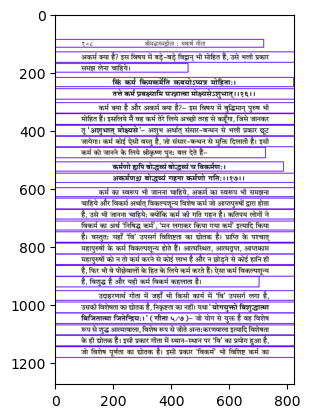

Text for each image:
चतुर्थ अध्याय १०९

च्योतक है जो प्राप्ति के पश्चात्‌ महापुरुषों के द्वारा सम्पादित होता है, जो

शुभाशुभ संस्कार नहीं डालता। अभी आपने विकर्म देखा। रहा कर्म और

अकर्म, जिसे अगले श्लोक में समझने का प्रयास करें। यदि यहाँ कर्म और

अकर्म का विभाजन नहीं समझ सके तो कभी नहीं समझ सकेंगे-

कर्मण्यकर्म यः: पश्येदकर्माण कर कर्म य:।

स बुद्धिमान्मनुष्येषु स युक्त: कृत्स्नकर्मकृत्‌।। १८।।

जो पुरुष कर्म में अकर्म देखे, कर्म माने आराधना अर्थात्‌ आराधना करे

और यह भी समझे कि करनेवाला मैं नहीं हूँ बल्कि गुणों की अवस्था ही

चिन्तन में हमें नियुक्त करती है, 'मैं इष्ट द्वारा संचालित हूँ'- ऐसा देखे और जब

इस प्रकार अकर्म देखने की क्षमता आ जाय और धारावाहिक रूप से कर्म

होता रहे, तभी समझना चाहिये कि कर्म सही दिशा में हो रहा है। वही पुरुष

मनुष्यों में बुद्धिमान्‌ है, मनुष्यों में योगी है, योग से युक्त बुद्धिवाला है और

सम्पूर्ण कर्मों को करनेवाला है। उसके द्वारा कर्म करने में लेशमात्र भी त्रुटि

नहीं रह जाती।

सारांशतः आराधना ही कर्म है, उस कर्म को करें और करते हुए अकर्म

देखें कि मैं तो 

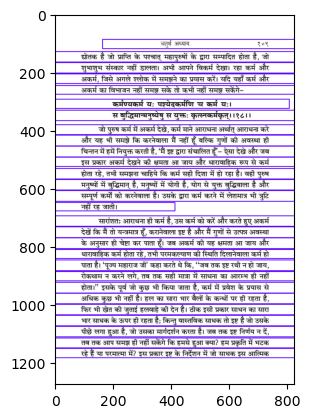

Text for each image:
११० श्रीमद्भगवद्गीता : यथार्थ गीता

पथ पर अग्रसर होता है, अपने को अकर्त्ता समझकर धारावाहिक कर्म करता

है वही बुद्धिमान्‌ है, उसकी जानकारी यथार्थ है, वही योगी है।

श्रीकृष्ण के अनुसार जो कुछ किया जाता है, कर्म नहीं है। कर्म एक

निर्धारित की हुई क्रिया है। 'नियतं कुरू कर्म त्वम्‌'- अर्जुन! तू निर्धारित

कर्म को कर। निर्धारित कर्म है क्या? तब बताया, “यज्ञार्थात्कर्मणोउन्यत्र

लोकोउ5यं कर्मबन्धन:। '- यज्ञ को कार्यरूप देना ही कर्म है। तो इसके

अतिरिक्त जो कुछ किया जाता है, क्‍या वह कर्म नहीं है? श्रीकृष्ण कहते हैं,

“अन्यत्र लोको5यं कर्मबन्धन: '- इस यज्ञ को कार्यरूप देने के सिवाय जो

कुछ किया जाता है, वह इसी लोक का बन्धन है, न कि कर्म। “तदर्थ कर्म '-

अर्जुन ! उस यज्ञ की पूर्ति के लिये भली प्रकार आचरण कर। और जब यज्ञ का

स्वरूप बताया तो वह शुद्ध रूप से आराधना की एक विधि-विशेष है, जो उस

आराध्य देव तक पहुँचाकर उसमें विलय दिलाता है।

इस यज्ञ में इन्द्रियों का दमन, मन का शमन, दैवी सम्पद्‌ का अर्जन

इत्यादि बताते हुए अन्त में कहा- बहुत से योगी प्राण और अपान की गति का

निरोध 

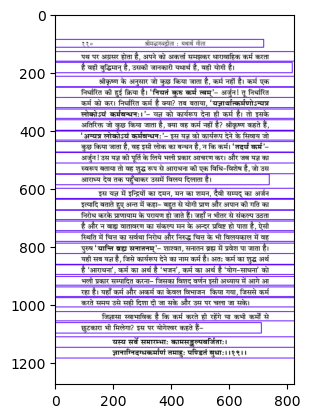

Text for each image:
द्वितीय अध्याय ३९

शूद्रों, वैश्यों, क्षत्रियों और ब्राह्मणों को, सबको बेद पढ़ने का अधिकार था।

प्रत्येक वर्ग के ऋषियों ने वैदिक मन्त्रों की रचना की है, शाख्रार्थ-निर्णय में

भाग लिया है। प्राचीन राजाओं ने धर्म के नाम पर आडम्बर फैलानेवालों को

दण्ड दिया, धर्मपरायणों का समादर किया था। किन्तु मध्यकालीन भारत में

सनातन-धर्म की यथार्थ जानकारी न रखने से उपर्युक्त गाँव के निवासी भेड़

की तरह एक कोने में खड़े होते गये कि धर्म नष्ट हो गया। कई लोगों ने इस

अप्रिय शब्द को सुनकर आत्महत्या कर ली; किन्तु सब कहाँ तक प्राणान्त

'करते। अटूट श्रद्धा के पश्चात्‌ भी विवश होकर अन्य हल खोजना पड़ा। आज

भी वे बाँस गाड़कर, मूसल रखकर हिन्दुओं की तरह विवाह करते हैं, बाद में

'एक मौलवी निकाह पढ़ाकर चला जाता है। सब-के-सब शुद्ध हिन्दू हैं, सब-

के-सब मुसलमान बन गये।

हुआ क्या था? पानी पिया था, अनजाने में मुसलमानों का छुआ खा

लिया था इसलिये धर्म नष्ट हो गया। धर्म तो हो गया छुईमुई (लाजबन्ती)। यह

'एक पौधा होता है। आप छू दें तो उसकी पत्तियाँ संकुचित हो जाती हैं और हाथ

हटाते ही पुनः विकसित हो जात

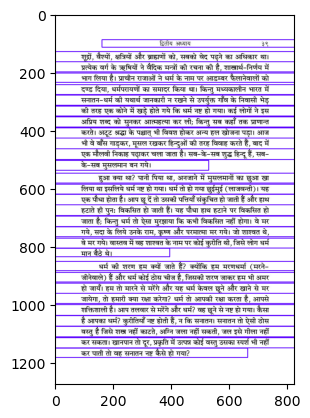

Text for each image:
४४ श्रीमद्भगवद्गीता : यथार्थ गीता

को जानकर इस लोक से मरकर जाता है वह ब्राह्मण है। (बृहदारण्यकोपनिषद्‌,

तृतीय अध्याय, अष्टम ब्राह्मण)

अर्जुन क्षत्रिय श्रेणी का साधक है। श्रीकृष्ण कहते हैं कि क्षत्रिय श्रेणी

के साधक के लिये युद्ध के अतिरिक्त कोई कल्याणकारी रास्ता है ही नहीं।

प्रश्न उठता है कि क्षत्रिय है क्‍या? प्रायः लोग इसका आशय समाज में जन्मना

उत्पन्न ब्राह्मण, क्षत्रिय, वैश्य, शूद्र जातियों से लेते हैं। इन्हें ही चार वर्ण मान

लिया जाता है। किन्तु नहीं, शास्त्रकार ने स्वयं बताया है कि क्षत्रिय क्‍या है,

वर्ण क्या है? यहाँ उन्होंने केवल क्षत्रिय का नाम लिया और आगे अठारहवें

अध्याय तक इस प्रश्न का समाधान प्रस्तुत किया कि वस्तुतः ये वर्ण हैं क्या

और कैसे इनमें परिवर्तन होता है?

श्रीकृष्ण ने कहा, 'चातुर्वर्ण्य मया सृष्टम्‌' ( गीता, ४/१३ )- चार

वर्णों की सृष्टि मैंने की। तो कया मनुष्यों को बाँटा? श्रीकृष्ण कहते हैं- नहीं,

“गुणकर्मविभागश:। '- गुणों के माध्यम से कर्म को चार भागों में बाँटा।

अब यह देखना है कि वह कर्म क्‍या है, जिसे बाँटा गया? गुण परिवर्तनशील


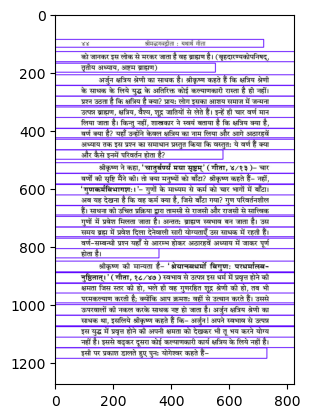

Text for each image:
४८ श्रीमद्भगवद्गीता : यथार्थ गीता

एपा तेउभिहिता साड्डे बुद्धियोंगे त्विमां श्रृणु।

बुद्धया युक्तो यया पार्थ कर्मबन्धं प्रहास्यसि।।३९।।

पार्थ ! यह बुद्धि तेरे लिये ज्ञानयोग के विषय में कही गयी है। कौन-सी

बुद्धि? यही कि युद्ध कर। ज्ञानयोग में इतना ही है कि अपनी हस्ती को देखकर,

लाभ-हानि का भली प्रकार विचार करके कि जीतेंगे तो महामहिम स्थिति और

हारेंगे तो देवत्व, जय में सर्वस्त्र और पराजय में भी देवत्व- दोनों तरह लाभ

है। युद्ध नहीं करेंगे तो सभी हमें बुरा कहेंगे, भय से उपराम हुआ मानेंगे,

अपकीर्ति होगी। इस प्रकार अपने अस्तित्व को सामने रखकर स्वयं विचार

कर युद्ध में अग्रसर होना ही ज्ञानयोग है।

प्रायः लोगों में भ्रान्ति है कि ज्ञानमार्ग में कर्म (युद्ध) नहीं करना पड़ता।

वे कहते हैं कि ज्ञानमार्ग में कर्म नहीं है। मैं तो 'शुद्ध हूँ, चैतन्य हूँ", 'अहं

ब्रह्मास्मि।', “गुण ही गुण में बरतते हैं।'- ऐसा मानकर हाथ पर हाथ रखकर

बैठ जाते हैं। योगेश्वर श्रीकृष्ण के अनुसार यह ज्ञानयोग नहीं है। ज्ञानयोग में

भी वही “कर्म' करना है, जो निष्काम कर्मयोग में किया जाता है। दोनों 

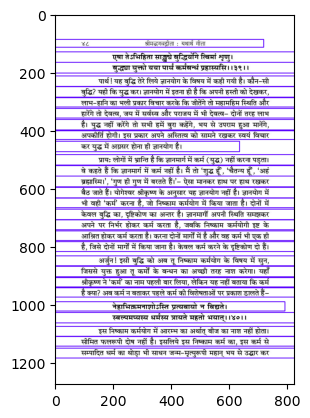

Ignored file: datasets/Devanagari datasets/annotations/0052.txt
Text for each image:
द्वितीय अध्याय ६५

निष्कर्ष-

प्रायः कुछ लोग कहते हैं कि दूसरे अध्याय में गीता पूर्ण हो गयी; किन्तु

यदि केवल कर्म का नाम मात्र लेने से कर्म पूरा हो जाता हो, तब तो गीता का

समापन माना जा सकता है। इस अध्याय में योगेश्वर श्रीकृष्ण ने यही बताया

'कि- अर्जुन! निष्काम कर्मयोग के विषय में सुन, जिसे जानकर तू संसार-

बन्धन से छूट जायेगा। कर्म करने में तेरा अधिकार है, फल में कभी नहीं। कर्म

करने में तेरी अश्रद्धा भी न हो। निरन्तर करने के लिये तत्पर हो जा। इसके

परिणाम में तू 'परं दृष्टवा' ( २/५९ )- परमपुरुष का दर्शन कर स्थितप्रज्ञ

बनेगा, परमशान्ति पायेगा। किन्तु यह नहीं बताया कि “कर्म' है क्या?

यह 'सांख्ययोग' नामक अध्याय नहीं है। यह नाम शास्त्रकार का नहीं,

अपितु टीकाकारों की देन है। वे अपनी बुद्धि के अनुसार ही ग्रहण करते हैं तो

आश्चर्य क्या है?

इस अध्याय में कर्म की गरिमा, उसे करने में बरती जानेवाली सावधानी

और स्थितप्रज्ञ के लक्षण बताकर श्रीकृष्ण ने अर्जुन के मन में कर्म के प्रति

उत्कण्ठा जागृत की है, उस

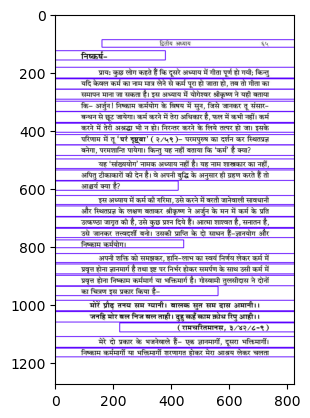

Text for each image:
द्वितीय अध्याय ५३

उनकी वाणी की छाप जिनके चित्त पर पड़ जाती है, उनकी भी बुद्धि नष्ट हो

जाती है। अतः निश्चयात्मक क्रिया एक ही है; लेकिन यह नहीं बताया कि वह

क्रिया कौन-सी है?

सैंतालीसवें श्लोक में उन्होंने कहा- अर्जुन! कर्म करने में ही तेरा

अधिकार है, फल में कभी नहीं। फल की वासनावाला भी मत हो और कर्म

करने में तेरी अश्रद्धा भी न हो अर्थात्‌ निरन्तर करने के लिये उसी में लीन

होकर करें; किन्तु यह नहीं बताया कि वह कर्म है क्‍या? प्रायः इस श्लोक का

उद्धरण देकर लोग कहते हैं कि कुछ भी करो, केवल फल की कामना मत

करो, हो गया निष्काम कर्मयोग। किन्तु अभी तक श्रीकृष्ण ने बताया ही नहीं

'कि वह कर्म है कौन-सा, जिसे करें? यहाँ पर केवल कर्म की विशेषताओं पर

प्रकाश डाला कि कर्म देता क्या है और कर्म करते समय बरती जानेवाली

सावधानियाँ क्‍या हैं? प्रश्न ज्यों-का-त्यों बना हुआ है, जिसे योगेश्वर आगे

अध्याय तीन-चार में स्पष्ट करेंगे।

पुनः इसी पर बल देते हैं-

योगस्थ: कुरु कर्माणि सड्डें त्यकत्वा धनज्ञय।

सिद्धय्मसिद्धयों: समो भूत्वा समत्वं योग उच्यते। । ४८ ।।

धनंजय! आसक्ति और संगदो

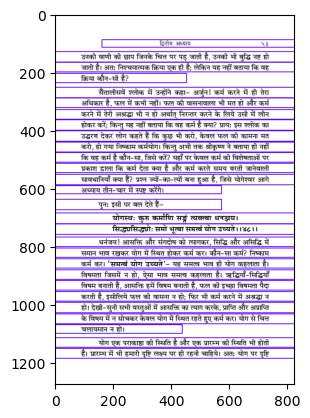

Text for each image:
तृतीय अध्याय ६९

अर्जुन! मनुष्य न तो कर्मों को न आरम्भ करने से निष्कर्मता की

अन्तिम स्थिति को प्राप्त होता है और न आरम्भ की हुई क्रिया को त्यागने मात्र

से भगवत्प्राप्तिरूपी परमसिद्धि को ही प्राप्त होता है। अब तुझे ज्ञानमार्ग अच्छा

लगे या निष्काम कर्ममार्ग, दोनों में कर्म तो करना ही पड़ेगा।

प्रायः इस स्थल पर लोग भगवत्पथ में संक्षिप्त मार्ग और बचाव ढूँढ़ने

लगते हैं। “कर्म आरम्भ ही न करें, हो गये निष्कर्मी”- कहीं ऐसी भ्रान्ति न रह

जाय, इसलिये श्रीकृष्ण बल देते हैं कि कर्मों को न आरम्भ करने से कोई

निष्कर्म-भाव को नहीं प्राप्त होता। शुभाशुभ कर्मों का जहाँ अन्त है, परम

निष्कर्मता की उस स्थिति को कर्म करके ही पाया जा सकता है। इसी प्रकार

बहुत से लोग कहते हैं, “हम तो ज्ञानमार्गी हैं, ज्ञानमार्ग में कर्म है ही नहीं।''-

ऐसा मानकर कर्मों को त्यागनेवाले ज्ञानी नहीं होते। आरम्भ की हुई क्रिया को

त्यागने मात्र से कोई भगव्त्साक्षात्काररूपी परमसिद्धि को प्राप्त नहीं होता है;

क्योंकि-

नहि कश्चित्क्षणमपि जातु तिष्ठत्यकर्मकृत्‌।

कार्यते ह्ावश: कर्म सर्व: प्रकृतिजैगगुणै:।।

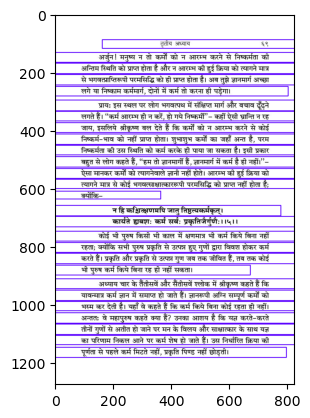

Text for each image:
९८ श्रीमद्भगवद्गीता : यथार्थ गीता

अभी तक योगेश्वर श्रीकृष्ण ने किसी महापुरुष द्वारा योग का आरम्भ,

उसमें आनेवाले व्यवधान और उनसे पार पाने का रास्ता बताया। इस पर

अर्जुन ने प्रश्न किया-

अर्जुन उबाच

अपरं भवतो जन्म परं जन्म विवस्वत:।

कथमेतद्विजानीयां त्वमादौ प्रोक्तवानिति।।४।।

भगवन्‌ | आपका जन्म तो 'अपरम्‌'- अब हुआ है और मेरे अन्दर सुरा

का संचार बहुत पुराना है, तो मैं कैसे मान लूँ कि इस योग को भजन के आदि

में आपने ही कहा था? इस पर योगेश्वर श्रीकृष्ण बोले-

श्रीधथगवानुवाच

बहूनि मे व्यतीतानि जन्मानि तब चार्जुन।

तान्‍्यहं बेद सर्वाणि न त्वं वेत्थ परन्तप।।५।।

अर्जुन! मेरे और तेरे बहुत से जन्म हो चुके हैं। हे परंतप | उन सबको

तू नहीं जानता; किन्तु मैं जानता हूँ। साधक नहीं जानता, स्वरूपस्थ महापुरुष

जानता है, अव्यक्त की स्थितिवाला जानता है। क्या आप सबकी तरह पैदा

होते हैं? श्रीकृष्ण कहते हैं- नहीं, स्वरूप की प्राप्ति शरीर-प्राप्ति से भिन्न है।

मेरा जन्म इन आँखों से नहीं देखा जा सकता। मैं अजन्मा, अव्यक्त, शाश्वत

होते हुए भी शरीर के आधारवाला हूँ।

अवधू जीवत में कर 

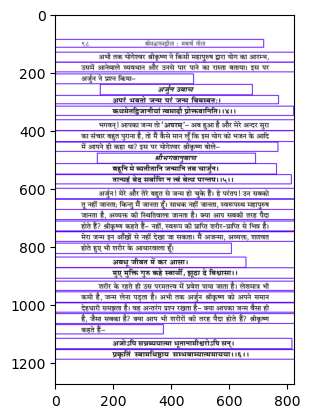

Text for each image:
१०२ श्रीमद्भगवद्गीता : यथार्थ गीता

कर्म को देखता है और मेरा साक्षात्‌ करके वह पुनर्जन्म को नहीं प्राप्त होता,

बल्कि मुझे प्राप्त होता है।

जब तत्त्वदर्शी ही भगवान का जन्म और कार्य देख पाता है तो लोग

लाखों की संख्या में भीड़ लगाये क्यों खड़े हैं कि कहीं अवतार होगा तो दर्शन

करेंगे? क्या आप तत्त्वदर्शी हैं? महात्मा-वेष में आज भी विविध तरीकों से,

मुख्यतः महात्मा-वेष की आड़ में बहुत से लोग प्रचार करते फिरते हैं कि वे

अवतार हैं या उनके दलाल प्रचार कर देते हैं। लोग भेड़ की तरह अवतार को

देखने टूट पड़ते हैं; किन्तु श्रीकृष्ण कहते हैं कि केवल तत्त्वदर्शी ही देख पाता

है। अब तत्त्वदर्शी किसे कहते हैं?

अध्याय २ में सत्‌-असत्‌ का निर्णय देते हुए योगेश्वर श्रीकृष्ण ने

बताया- अर्जुन! असत्‌ वस्तु का अस्तित्व नहीं है और सत्‌ का तीनों कालों में

कभी अभाव नहीं है। तो क्या आप ऐसा कहते हैं? उन्होंने बताया- “नहीं,

तत्त्वदर्शियों ने इसे देखा।” न किसी भाषाविद्‌ ने देखा, न किसी समृद्धिशाली

ने देखा। यहाँ पुनः बल देते हैं कि मेरा आविर्भाव तो होता है लेकिन उसे

तत्त्वदर्शी ही देख प

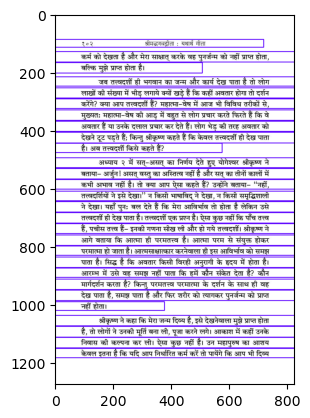

Text for each image:
तृतीय अध्याय ७३

बन्धनकारी कर्म है, न कि मोक्षद कर्म। वस्तुतः यज्ञ की प्रक्रिया ही कर्म है।

अब यज्ञ न बताकर पहले यह बताते हैं कि यज्ञ आया कहाँ से?-

सहयज्ञा: प्रजा: सृष्टवा पुरोबाच प्रजापति:।

अनेन प्रसविष्यध्वमेष वोउस्त्विष्ठटकामधुक्‌ू। । १०१।

प्रजापति ब्रह्मा ने कल्प के आदि में यज्लसहित प्रजा को रचकर कहा कि

इस यज्ञ द्वारा वृद्धि को प्राप्त होओ। यह यज्ञ तुमलोगों की 'इष्टकामधुक्‌ '-

जिसमें अनिष्ट न हो, विनाशरहित इष्ट-सम्बन्धी कामना की पूर्ति करेगा।

यज्ञसहित प्रजा को किसने रचा? प्रजापति ब्रह्मा ने। ब्रह्मा कौन? क्‍या

चार मुख और आठ आँखोंवाला देवता, जैसा कि प्रचलित है? नहीं, श्रीकृष्ण

के अनुसार देवता नाम की कोई अलग सत्ता है ही नहीं। फिर प्रजापति कौन

है? वस्तुतः जिसने प्रजा के मूल उद्गम परमात्मा में प्रजेश पा लिया है, वह

महापुरुष प्रजापति है। उसकी बुद्धि ही ब्रह्मा है- "अहंकार सिव बुद्धि अज,

मन ससि चित्त महान। ' ( रामचरितमानस, ६/१५ क ) उस समय बुद्धि

अन्त्रमात्र होती है। उस पुरुष की वाणी में परमात्मा ही बोलता है।

भजन की वास्तविक क्रिया प्रारम्भ हो जाने पर बु

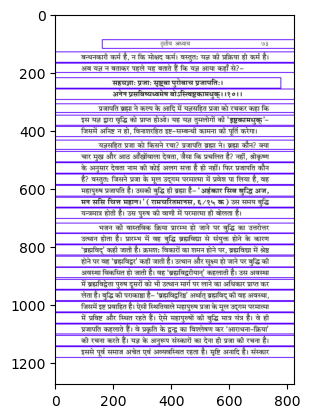

Text for each image:
८४ श्रीमद्भगवद्गीता : यथार्थ गीता

होगी। गुण परिवर्तनशील हैं। प्रत्यक्षदर्शी ज्ञानी ही देख पाता है कि गुणों के

अनुरूप कर्मो का उत्कर्ष-अपकर्ष होता है। गुण अपना कार्य करा लेते हैं,

अर्थात्‌ गुण गुणों में बरतते हैं- ऐसा समझकर वह प्रत्यक्ष द्रश कर्म में आसक्त

नहीं होता। किन्तु जिन्होंने गुणों का पार नहीं पाया, जो अभी रास्ते में हैं उन्हें तो

कर्म में आसक्त रहना है। इसलिये-

प्रकृतेर्गुणसम्मूढा: सज्जन्ते गुणकर्मसु।

तानकृत्स्नविदो मन्दान्कृत्स्नविज्ञ विचालयेत्‌।। २९।।

प्रकृति के गुणों से मोहित हुए पुरुष गुण और कर्मों में क्रमशः निर्मल

गुणों की ओर उन्नति देखकर उनमें आसक्त होते हैं। उन अच्छी प्रकार न

समझनेवाले 'मन्दान्‌'- शिथिल प्रयत्नवालों को अच्छी प्रकार जाननेवाला

ज्ञानी चलायमान न करे। उन्हें हतोत्साहित न करे बल्कि प्रोत्साहन दे; क्योंकि

कर्म करके ही उन्हें परम नैष्कर्म्य की स्थिति को पाना है। अपनी शक्ति और

स्थिति का आकलन करके कर्म में प्रवृत्त होनेबाले ज्ञानमार्गी साधकों को

चाहिये कि कर्म को गुणों की देन मानें, अपने को कर्त्ता मानकर अहंकारी न

बन जायूँ, निर

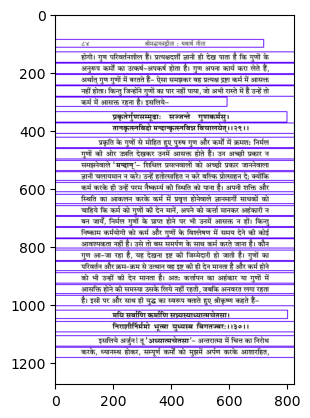

Text for each image:
८८ श्रीमद्भगवद्गीता : यथार्थ गीता

आदेश हुआ था कि भक्तों के कल्याणार्थ कुछ ताड़ना दिया करें, इस पथ के

पथिकों पर निगरानी रखें। महाराज जी की नकल कर वे महात्मा भी गालियाँ

देने लगें; किन्तु बदले में लोग भी कुछ-न-कुछ कह बैठते थे। वे महात्मा

कहने लगे-वहाँ कोई बोलता नहीं, यहाँ तो जवाब देते हैं।

दो-एक साल बाद लौटे तो देखा कि परमहंस जी गद्दे पर बैठे हैं, लोग

पंखा झल रहे हैं, चँवर चल रहे हैं। उन्होंने जंगल के ही एक खण्डहर में तख्त

मँगाया, गद्दे बिछबाये, दो आदमियों को चँबर चलाने के लिये नियुक्त कर

दिया। हर सोमवार को भीड़ भी लगाने लगे कि पुत्र चाहिये तो पचास रुपये,

पुत्री चाहिये तो पचीस रुपये। किन्तु 'उघराहिं अन्त न होड़ निबाहू।'

( रामचरितमानस, १/६/६ )- एक महीने में ही कौड़ी के दो होकर चल

दिये। इस भगवत्पथ में नकल साथ नहीं देता। साधक को स्वधर्म का ही

आचरण करना चाहिये।

स्वधर्म क्‍या है? अध्याय दो में श्रीकृष्ण ने स्वधर्म का नाम लिया कि

स्वधर्म को देखकर भी तू युद्ध करने योग्य है। क्षत्रिय के लिये इससे बढ़कर

कल्याणकारी मार्ग नहीं है। स्वधर्म में अर्जुन क्षत्रिय पाया 

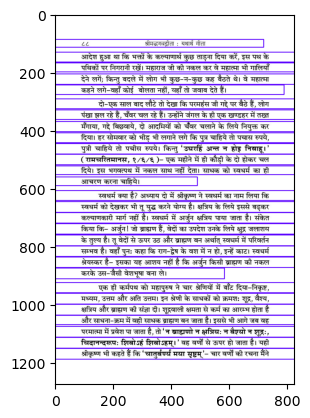

Text for each image:
१०६ श्रीमद्भगवद्गीता : यथार्थ गीता

जाती है। उस समय वही साधक इन्द्रिय-संयम, आत्मिक सम्पत्ति का संग्रह

स्वभावतः करने लगेगा। कर्म करते-करते उसी साधक में सात्त्जिक गुणों का

बाहुलय हो जायेगा, राजसी गुण कम रह जायेंगे, तामसी गुण शान्त रहेंगे। उस

समय वही साधक क्षत्रिय श्रेणी में प्रवेश पा लेगा। शौर्य, कर्म में प्रवृत्त रहने

की क्षमता, पीछे न हटने का स्वभाव, सब भावों पर स्वामिभाव, प्रकृति के

तीनों गुणों को काटने की क्षमता उसके स्वभाव में ढल जायेगी। वही कर्म और

सूक्ष्म होने पर, मात्र सात्त्विक गुण कार्यरत रह जाने पर मन का शमन, इन्द्रियों

का दमन, एकाग्रता, सरलता, ध्यान, समाधि, ईश्वरीय निर्देश, आस्तिकता

इत्यादि ब्रह्म में प्रवेश दिलानेवाली स्वाभाविक क्षमता के साथ वही साधक

ब्राह्मण श्रेणी का कहा जाता है। यह ब्राह्मण श्रेणी के कर्म की निम्नतम सीमा

है। जब वही साधक ब्रह्म में स्थित हो जाता है, उस अन्तिम सीमा में वह स्वयं

में न ब्राह्मण रहता है न क्षत्रिय, न वैश्य न शूद्र; किन्तु दूसरों के मार्गदर्शनहेतु

वही ब्राह्मण है। कर्म एक ही है- नियत कर्म, आराधना। अवस्था- भेद से

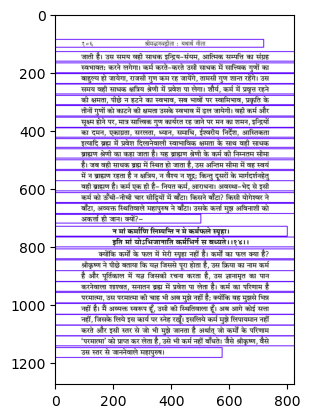

Text for each image:
चतुर्थ अध्याय १०७

एवं ज्ञात्वा कृत॑ कर्म पूर्वरपि मुमुक्षुभि:।

कुरु कर्मैंब तस्माच्त्वं पूर्व: पूर्वतरं कृतम्‌।।१५।।

अर्जुन ! पहले होनेवाले मोक्ष की इच्छावाले पुरुषों द्वारा भी यही जानकर

कर्म किया गया। क्या जानकर? यही कि जब कर्मों का परिणाम परमात्मा भिन्न

न रह जाय, कर्मों के परिणाम परमात्मा की स्पृहा न रह जाने पर उस पुरुष को

कर्म नहीं बाँधते। श्रीकृष्ण इसी स्थितिवाले हैं इसलिये वे कर्म में लिपायमान

नहीं होते और उसी स्तर से हम जान लेंगे तो हमें भी कर्म नहीं बाँधेगा। जैसे

श्रीकृष्ण, ठीक उसी स्तर से जो भी जान लेगा, जैसा ही वह पुरुष भी कर्मबन्धन

से मुक्त हो जायेगा। अब श्रीकृष्ण 'भगवान', 'महात्मा', 'अव्यक्त', 'योगेश्वर'

या “महायोगेश्वर' जो भी रहे हों, बह स्वरूप सबके लिये है। यही समझकर

पहले के मुमुक्षु पुरुषों ने, मोक्ष की इच्छावाले पुरुषों ने कर्म पर कदम रखा।

इसलिये अर्जुन! तू भी पूर्वजों द्वारा सदा से किये हुए इसी कर्म को कर। यही

कल्याण का एकमात्र मार्ग है।

अभी तक योगेश्वर श्रीकृष्ण ने कर्म करने पर बल दिया; किन्तु यह

स्पष्ट नहीं किया कि कर्म क्‍या है? अध

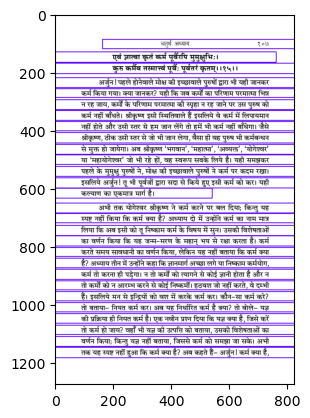

Text for each image:
११८ श्रीमद्भगवद्गीता : यथार्थ गीता

प्रत्येक महापुरुष ने इस प्रकरण को लिया है। बेदों में इसका उल्लेख

है- “चत्वारि वाकू परिमिता पदानि' ( ऋग्वेद १/१६४/४५, अथर्ववेद

९/१५/२७ ) इसी को “पूज्य महाराज जी' कहा करते थे- “हो ! एक ही नाम

चार श्रेणियों से जपा जाता है- बैखरी, मध्यमा, पश्यन्ती और परा। बैखरी उसे

कहते हैं जो व्यक्त हो जाय। नाम का इस प्रकार उच्चारण हो कि आप सुनें और

बाहर कोई बैठा हो तो उसे भी सुनायी पड़े। मध्यमा अर्थात्‌ मध्यम स्वर में

जप, जिसे केवल आप ही सुनें, बगल में बैठा हुआ व्यक्ति भी उस उच्चारण

को सुन न सके। यह उच्चारण कण्ठ से होता है। धीरे-धीरे नाम की धुन बन

जाती है, डोर लग जाती है। साधना और सूक्ष्म हो जाने पर पश्यन्ती अर्थात्‌

नाम देखने की अवस्था आ जाती है। फिर नाम को जपा नहीं जाता, यही नाम

श्वास में ढल जाता है। मन को द्रष्टा बनाकर खड़ा कर दें, देखते भर रहें कि

साँस आती है कब? बाहर निकलती है कब? कहती है क्या?” महापुरुषों का

कहना है कि यह साँस नाम के सिवाय और कुछ कहती ही नहीं। साधक नाम

का जप नहीं करता, केवल उससे उठनेवाली धुन को सुनता है। साँस को


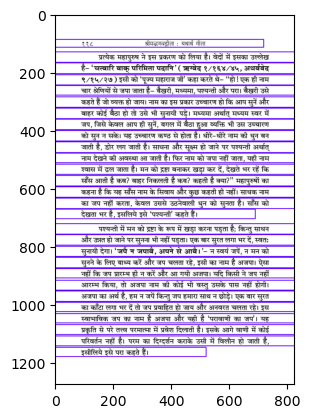

Text for each image:
चतुर्थ अध्याय १२१

का निरोध खेती करने से होता हो; व्यापार, नौकरी या राजनीति करने से होता

हो तो आप करिये। यज्ञ तो ऐसी क्रिया है, जो पूर्ण होते ही तत्क्षण परब्रह्म में

प्रवेश दिला देती है। बाह्य किसी भी कार्य से आप तत्क्षण ब्रह्म में प्रेश पा जाते

हों तो कीजिये।

वस्तुतः यह सब-के-सब यज्ञ चिन्तन की अन्तःक्रियाएँ हैं, आराधना

का चित्रण है, जिससे आराध्यदेव विदित होता है। यज्ञ उस आराध्य तक की

दूरी तय करने की निर्धारित प्रक्रिया-विशेष है। यह यज्ञ श्वास-प्रश्वास,

प्राणायाम इत्यादि जिस क्रिया से सम्पन्न होते हैं, उस कार्य-प्रणाली का नाम

कर्म है। कर्म का शुद्ध अर्थ है- 'आराधना' , 'चिन्तन'।

प्रायः लोग कहते हैं कि संसार में कुछ भी किया जाय, हो गया कर्म।

कामना से रहित होकर कुछ भी करते जाओ, हो गया निष्काम कर्मयोग। कोई

कहता है कि अधिक लाभ के लिये विदेशी वस्त्र बेचते हैं तो आप सकामी हैं।

देश-सेवा के लिये स्वदेशी बेचें तो हो गया निष्काम कर्मयोग। निष्ठापूर्वक

नौकरी करें, हानि-लाभ की चिन्ता से मुक्त होकर व्यापार करें, हो गया

निष्काम कर्मयोग। जय-पराजय की भावना से मुक्त हो 

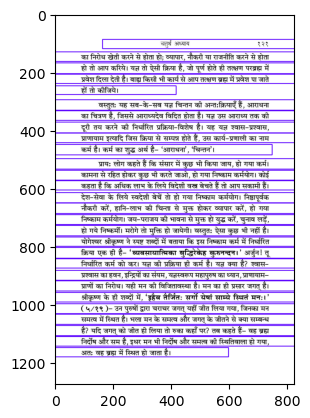

Text for each image:
१२८ श्रीमद्भगवद्गीता : यथार्थ गीता

योगेश्वर ने स्पष्ट किया कि वह ज्ञान तू स्वयं आचरण करके पायेगा,

दूसरे के आचरण से तुझे नहीं मिलेगा। वह भी योग की सिद्धि के काल में प्राप्त

होगा, प्रारम्भ में नहीं। वह ज्ञान (साक्षात्कार) हृदय-देश में होगा, बाहर नहीं।

श्रद्धालु, तत्पर, संयतेन्द्रिय एवं संशयरहित पुरुष ही उसे प्राप्त करता है। अतः

हृदय में स्थित अपने संशय को बैराग्य की तलवार से काट। यह हृदय-देश

की लड़ाई है। बाह्य युद्ध से गीतोक्त युद्ध का कोई प्रयोजन नहीं है।

इस अध्याय में योगेश्वर श्रीकृष्ण ने मुख्य रूप से यज्ञ का स्वरूप स्पष्ट

किया और बताया कि यज्ञ जिससे पूरा होता है, उसे करने (कार्य-प्रणाली)

का नाम कर्म है। कर्म को भली प्रकार इसी अध्याय में स्पष्ट किया, अतः-

ॐ तत्सदिति श्रीमद्धगवद्गीतासूपनिषत्सु ब्ह्मविद्यायां योगशास्क्रो

श्रीकृष्णार्जुनसम्बादे 'यज्ञकर्मस्पष्टीकरणम्‌' नाम

अतुर्थोउध्याय:। ।४।।

इस प्रकार श्रीमद्भगवद्‌गीतारूपी उपनिषद्‌ एवं ब्रह्मविद्या तथा योगशाख

विषयक श्रीकृष्ण और अर्जुन के सम्बाद में “यज्ञकर्म-स्पष्टीकरण' नामक

चौथा अध्याय पूर्ण होता है।

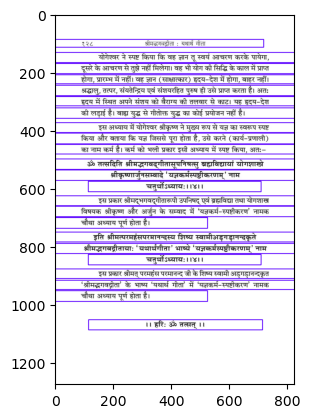

Ignored file: datasets/Devanagari datasets/annotations/0131.txt
Text for each image:
पञ्मम अध्याय १३७

श्रीकृष्ण ने पर्याप्त गो-सेवा की थी। उन्हें गाय के प्रति गौरवपूर्ण शब्द

कहना चाहिये था; किन्तु उन्होंने ऐसा कुछ भी नहीं कहा। श्रीकृष्ण ने गाय को

धर्म में कोई स्थान नहीं दिया। उन्होंने केवल इतना माना कि अन्य जीवात्माओं

की तरह उसमें भी आत्मा है। गाय का आर्थिक महत्त्व जो भी हो, उसका

धार्मिक वैशिष्त्य परवर्ती लोगों की देन है। श्रीकृष्ण ने पीछे बताया कि अविवेकियों

की बुद्धि अनन्त शाखाओंवाली होती है, इसलिये वे अनन्त क्रियाओं का

विस्तार कर लेते हैं। दिखावटी शोभायुक्त वाणी में वे उसे व्यक्त भी करते हैं।

उनकी वाणी की छाप जिनके चित्त पर पड़ती है, उनकी भी बुद्धि नष्ट हो जाती

है। वे कुछ पाते नहीं, नष्ट हो जाते हैं। जबकि निष्काम कर्मयोग में अर्जुन!

निर्धारित क्रिया एक ही है- यज्ञ की प्रक्रिया 'आराधना'। गाय, कुत्ता, हाथी,

पीपल, नदी का धार्मिक महत्त्व इन अनन्त शाखावालों की देन है। यदि इनका

कोई धार्मिक महत्त्व होता तो श्रीकृष्ण अवश्य कहते। हाँ, मन्दिर, मस्जिद

इत्यादि पूजा के स्थल आरम्भिक 

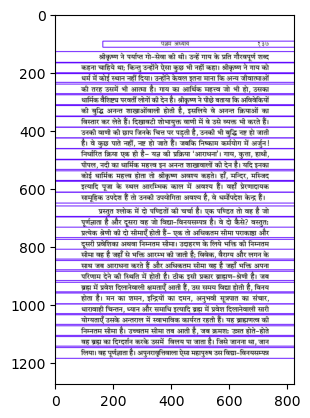

Ignored file: datasets/Devanagari datasets/annotations/0142.txt
Ignored file: datasets/Devanagari datasets/annotations/0140.txt
Text for each image:
१४८ श्रीमद्भगवद्गीता : यथार्थ गीता

जानेवाले नियम, आहार-विहार, सोने-जागने का संयम तथा कर्म पर कैसी

चेष्टा हो?- इत्यादि बिन्दुओं पर योगेश्वर श्रीकृष्ण ने अगले पाँच श्लोकों में

प्रकाश डाला है, जिससे आप भी उस यज्ञ को सम्पन्न कर सकें।

अध्याय तीन में उन्होंने यज्ञ का नाम लिया और बताया कि यज्ञ की

प्रक्रिया ही वह नियत कर्म है। अध्याय चार में उन्होंने यज्ञ का स्वरूप विस्तार

से बताया, जिसमें प्राण में अपान का हजन, अपान में प्राण का हवन, प्राण-

अपान की गति रोककर मन का निरोध इत्यादि किया जाता है। सब मिलाकर

यज्ञ का शुद्ध अर्थ है आराधना तथा उस आराध्य देव तक की दूरी तय

'करानेवाली प्रक्रिया, जिस पर पाँचवें अध्याय में भी कहा। किन्तु उसके लिये

आसन, भूमि, करने की विधि इत्यादि का चित्रण शेष था, उसी पर योगेश्वर

श्रीकृष्ण यहाँ प्रकाश डालते हैं-

योगी युझ्जीत सततमात्मानं रहसि स्थित:।

एकाकी यतचित्तात्मा निराशीरपरिग्रह:।।१९०।॥।

चित्त को जीतने में लगा 

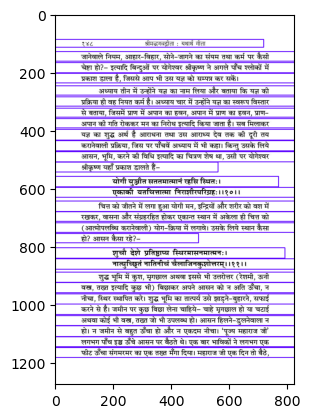

Text for each image:
पष्ठम अध्याय १५७

छोटी-सी बदली आकाश में छाये, तो वह न बरस पाती है न लौटकर मेघों से

ही मिल पाती है; बल्कि हवा के झोंकों से देखते-देखते नष्टप्राय हो जाती है।

इसी प्रकार शिथिल प्रयत्नवाला, कुछ काल तक साधन करके स्थगित करनेवाला

नष्ट तो नहीं हो जाता? वह न आपमें प्रवेश कर सका और न भोग ही भोग

पाया। उसकी कौन-सी गति होती है?

एतन्मे संशय कृष्ण छेत्तुमहस्थशेषत:।

त्वदन्य: संशयस्यास्य छेत्ता न ह्युपपद्यते।। ३९।।

हे श्रीकृष्ण ! मेरे इस संशय को सम्पूर्णता से मिटाने के लिये आप ही

सक्षम हैं। आपके अतिरिक्त दूसरा कोई इस संशय को मिटानेवाला मिलना

सम्भव नहीं है। इस पर योगेश्वर श्रीकृष्ण ने कहा-

श्रीधथगवानुवाच

पार्थ नैवेह नामुत्र विनाशस्तस्य विद्यते।

नहि कल्याणकृत्कश्चिहुर्गतिं तात गच्छति। ।४०।।

पार्थिव शरीर को ही रथ बनाकर लक्ष्य की ओर अग्रसर अर्जुन | उस

पुरुष का न तो इस लोक में और न परलोक में ही नाश होता है; क्योंकि हे

तात! उस परमकल्याणकारी नियत कर्म को करनेवाला दुर्गति को प्राप्त नहीं

होता। उसका होता क्‍या है?-

प्राप्य पुण्यक्ृतां लोकानुषित्वा शा श्वती: समा:।

शुच्ीनां 

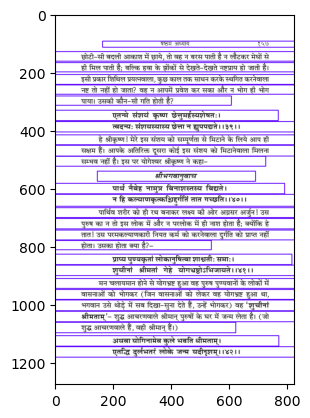

Text for each image:
षष्ठम अध्याय १४९

फिर बोले- “नहीं हो ! बहुत ऊँचा हो गया। ऊँचे नहीं बैठे के चाही साधू को,

अभिमान होइ जावा करत है। नीचेहू न बैठे के चाही, हीनता आवत है, अपने

से घृणा आवत है।'” बस, उसको उठवाया और जंगल में एक बगीचा था, वहाँ

रखवा दिया। वहाँ न कभी महाराज जाते थे और न अब ही कोई जाता है। यह

था उन महापुरुष का क्रियात्मक शिक्षण। इसी प्रकार साधक के लिये भी बहुत

ऊँचा आसन नहीं होना चाहिये, नहीं तो भजनपूर्ति बाद में होगी, अहंकार

पहले चढ़ बैठेगा। इसके पश्चात्‌-

तज्नैकाग्रं मन: कृत्वा यतचित्तेन्द्रियक्रिय:।

उपविश्यासने युद्भ्याद्योगमात्मविशुद्धये।।१२।।

उस आसन पर बैठकर (बैठकर ही ध्यान करने का विधान है) मन को

'एकाग्र करके, चित्त और इन्द्रियों की क्रियाओं को वश में रखते हुए अन्तःकरण

की शुद्धि के लिये योगाभ्यास करे। अब बैठने का तरीका बताते हैं-

सम कायशिरोग्रीवं॑ धारयज्ञचलं स्थिर:।

सम्प्रेक्ष्य नासिकाग्र॑ स्व॑ दिशश्चानवलोकयन्‌।।१३।।

शरीर, गर्दन और सिर को सीधा, अचल-स्थिर करके (जैसे कोई पटरी

खड़ी कर दी गयी हो, इस प्रकार सीधा) दृढ़ होकर बैठ जाय और अपनी

नासिका के अग्रभाग को 

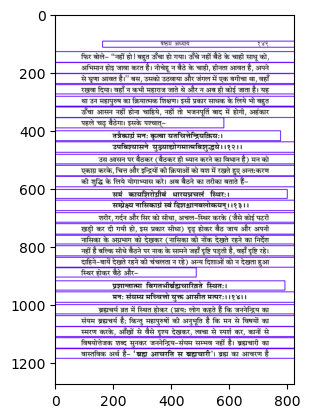

Text for each image:
प्रष्ठम अध्याय १५९

वहाँ वह पूर्वशरीर में साधन किये हुए बुद्धि के संयोग को अर्थात्‌

पूर्वजन्म के साधन-संस्कारों को अनायास ही प्राप्त हो जाता है और हे कुरुनन्दन !

उसके प्रभाव से वह फिर 'संसिद्धौ '- भगवत्प्राप्तिरूपी परमसिद्धि के निमित्त

प्रयत्न करने लगता है।

पूर्वाध्यासेन तेनैब हियते ह्वावशो 5पि स:।

जिज्ञासुरपि योगस्य शब्दब्ह्मातिवर्तते।।४४।।

श्रीमानों के घर विषयों के वश में रहने पर भी वह पूर्वजन्म के अभ्यास

से भगवत्पथ की ओर आकर्षित हो जाता है और योग में शिथिल प्रयत्नवाला

वह जिज्ञासु भी वाणी के विषय को पार करके निर्वाण पद को पा जाता है।

उसकी प्राप्ति का यही तरीका है। कोई एक जन्म में पाता भी नहीं।

प्रयत्नाद्यतमानस्तु योगी संशुद्धकिल्बिष:।

अनेकजन्मसंसिद्धस्ततो याति परां गतिम्‌।।४५।।

अनेक जन्मों से प्रयत्न करनेबाला योगी परमसिद्धि को प्राप्त हो जाता

है। प्रयत्नपूर्वक अभ्यास करनेवाला योगी सभी पापों से अच्छी प्रकार शुद्ध

होकर परमगति को प्राप्त हो जाता है। प्राप्ति का यही क्रम है। पहले शिथिल

प्रयत्न से वह योग आरम्भ करता है, मन चलायमान होने पर जन्म लेता है,



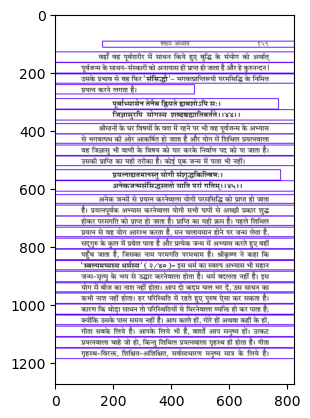

Text for each image:
१६८ श्रीमद्भगवद्गीता : यथार्थ गीता

परे जो बल है वह मैं हूँ। वही वास्तविक बल है। सब भूतों में धर्म के अनुकूल

कामना मैं हूँ। परब्रह्म परमात्मा ही एकमात्र धर्म है, जो सबको धारण किये हुए

है। जो शाश्वत आत्मा है वही धर्म है। जो उससे अविरोध रखनेवाली कामना

है, मैं हूँ। आगे भी श्रीकृष्ण ने कहा- अर्जुन ! मेरी प्राप्ति के लिये इच्छा कर। सब

कामनाएँ तो वर्जित हैं; किन्तु उस परमात्मा को पाने की कामना आवश्यक है

अन्यथा आप साधन कर्म में प्रवृत्त नहीं होंगे। ऐसी कामना भी मेरी ही देन है।

ये चैब सात्त्विका भावा राजसास्तामसाश्च ये।

मत्त एवेति तान्विद्धि न त्वहं तेषु ते मणि।।१२।।

और भी जो सत्त्वगुण से उत्पन्न होनेवाले भाव हैं, जो रजोगुण और

तमोगुण से उत्पन्न होनेवाले भाव हैं, उन सबको तू मुझसे ही उत्पन्न होनेवाले हैं,

ऐसा जान। परन्तु वास्तव में उनमें मैं और वे मेरे में नहीं हैं। क्योंकि न मैं उनमें

खोया हुआ हूँ और न वे ही मुझमें प्रवेश कर पाते हैं; क्योंकि मुझे कर्म से स्पृहा

नहीं है। मैं निर्लेप हूँ, मुझे इनमें कुछ पाना नहीं है। इसलिये मुझमें प्रवेश नहीं

कर पाते। ऐसा होने प

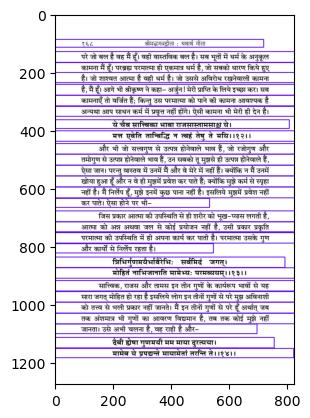

Text for each image:
१७४ श्रीमद्भगवद्गीता : यथार्थ गीता

लगा, प्रार्थना करने लगा। वस्तुतः अव्यक्तस्थित महापुरुष को पहचानने में

हमलोग प्रायः अन्धे ही हैं। आगे कहते हैं-

बेदाह॑ समतीतानि वर्तमानानि चार्जुन।

भविष्याणि च भूतानि मां तु वेद न कश्चन।। २६।।

अर्जुन! मैं अतीत, वर्तमान और भविष्य में होनेवाले सम्पूर्ण प्राणियों

को जानता हूँ; परन्तु मुझे कोई नहीं जानता। क्यों नहीं जान पाता?-

इच्छाद्वेषसमुत्थेन द्वन्द्रमोहेन भारत।

सर्वभूतानि सम्मोहं सर्गे यान्ति परन्तप।।२७।।

भरतवंशी अर्जुन | इच्छा और द्वेष अर्थात्‌ राग-द्वेषादि द्वन्द के मोह से

संसार के सम्पूर्ण प्राणी अत्यन्त मोह को प्राप्त हो रहे हैं इसलिये मुझे नहीं जान

पाते। तो कया कोई जानेगा ही नहीं? योगेश्वर श्रीकृष्ण कहते हैं-

येषां त्वन्तगतं पाप॑ जनानां पुण्यकर्मणाम्‌।

ते दन्द्रमोहनिर्मुक्ता भजन्ते मां दृढ्ब्ता:।।२८।।

परन्तु पुण्यकर्म (जो संसृति का अन्त करनेवाला है, जिसका नाम

कार्यम्‌ कर्म, नियत कर्म, यज्ञ की प्रक्रिया कहकर बारम्बार समझाया है, उस

कर्म को) करनेवाले जिन भक्तों का पाप नष्ट हो गया है, जे राग-द्वेषादि द्वन्द् के

मो

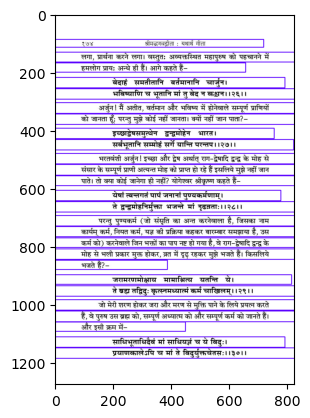

Ignored file: datasets/Devanagari datasets/annotations/0188.txt
Text for each image:
१९० श्रीमद्भगवद्गीता : यथार्थ गीता

होने योग्य है। अनन्य भक्ति का तात्पर्य है कि परमात्मा के सिवाय अन्य किसी

का स्मरण न करते हुए उनसे जुड़ जाय। अनन्य भाव से लगनेवाले पुरुष भी

कब तक पुनर्जन्म की सीमा में हैं और कब वे पुनर्जन्म का अतिक्रमण कर

जाते हैं? इस पर योगेश्वर कहते हैं-

अत्र काले त्वनावृत्तिमावृत्ति चैब योगिन:।

प्रयाता यान्ति तं काल॑ वक्ष्यामि भरतर्षभ।।२३।।

हे अर्जुन | जिस काल में शरीर त्यागकर गये हुए योगीजन पुनर्जन्म को

नहीं पाते और जिस काल में शरीर त्यागने पर पुनर्जन्म पाते हैं, मैं अब उस

काल का वर्णन करता हूँ।

अग्निज्योतिरह: शुक्ल: षण्मासा उत्तरायणम्‌।

तत्न प्रयाता गच्छन्ति ब्रह्म ब्रह्मविदों जना:।।२४।।

'शरीर-सम्बन्ध का त्याग करते समय जिनके समक्ष ज्योतिर्मय अग्नि

जल रही हो, दिन का प्रकाश फैला हो, सूर्य चमक रहा हो, शुक्लपक्ष का चन्द्र

बढ़ रहा हो, उत्तरायण का निरभ्र और सुन्दर आकाश हो, उस काल में प्रयाण

करनेवाले ब्रह्मवेत्ता योगीजन ब्रह्म को प्राप्त होते हैं।

अग्नि ब्रह्मतेज का प्रत

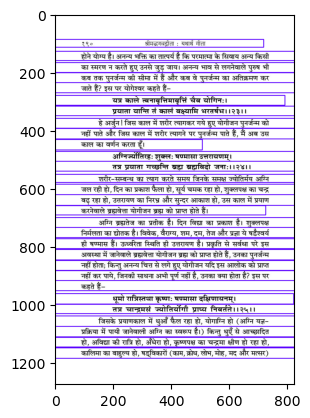

Text for each image:
१९४ श्रीमद्भगवद्गीता : यथार्थ गीता

इस योग में प्रविष्ट पुरुष की दो गतियाँ हैं। जो पूर्ण प्रकाश को प्राप्त

बडैश्वर्यसम्पन्न ऊध्वरिता है, जिसमें लेशमात्र भी कमी नहीं है, वह परमगति

को प्राप्त होता है। यदि उस योगकर्त्ता में लेशमात्र भी कमी है, कृष्णपक्ष-सी

'कालिमा का संचार है, ऐसी अवस्था में शरीर का समय समाप्त होनेवाले योगी

को जन्म लेना पड़ता है। वह सामान्य जीव की तरह जन्म-मरण के चक्कर में

नहीं फँसता बल्कि जन्म लेकर उससे आगे की शेष साधना को पूरा करता है।

इस प्रकार आगे के जन्म में उसी क्रिया से चलकर वह भी वहीं पहुँच

जाता है जिसका नाम परमधाम है। पहले भी श्रीकृष्ण कह आये हैं कि इसका

थोड़ा भी साधन जन्म-मरण के महान्‌ भय से उद्धार कराके ही छोड़ता है।

“दोनों रास्ते शाश्वत हैं, अमिट हैं'- इस बात को समझकर कोई भी पुरुष योग

से चलायमान नहीं होता। अर्जुन | तू योगी बन। योगी वेद, तप, यज्ञ और दान

के भी पुण्यफलों का उल्लंघन कर जाता है, परमगति को प्राप्त होता है।

इस अध्याय में स्थान-स्थान पर परमगति का चित्रण किया गया है

जिसे अव्यक्त, अक्षय और अक्षर कहकर सम्बोधित किया गया, 

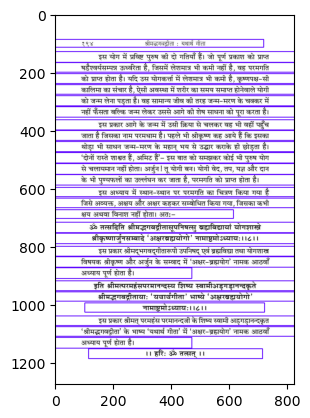

Ignored file: datasets/Devanagari datasets/annotations/0200.txt
Text for each image:
२०४ श्रीमद्भगवद्गीता : यथार्थ गीता

भी कामनावाले पुरुष बारम्बार जाने-आने को अर्थात्‌ पुनर्जन्म को प्राप्त होते

हैं किन्तु उनका मूल नाश कभी नहीं होता; क्योंकि इस पथ में बीज का नाश

नहीं है। किन्तु जो किसी प्रकार की कामना नहीं करते, उन्हें क्या मिलता है?-

अनन्य॒श्चिन्तयन्तो मां ये जना: पर्युपासते।

तेषां नित्याभियुक्तानां योगक्षेम॑ बहाम्यहम्‌।।२२।।

अनन्य भाव से मुझमें स्थित भक्तजन मुझ परमात्मस्वरूप का निरन्तर

चिन्तन करते हैं, 'पर्युपासते '- लेशमात्र भी त्रुटि न रखकर मुझे उपासते हैं।

उन नित्य एकीभाव से संयुक्त हुए पुरुषों का योगक्षेम मैं स्वयं वहन करता हूँ

अर्थात्‌ उनके योग की सुरक्षा की सारी जिम्मेदारी मैं अपने हाथ में लेता हूँ।

इतना होने पर भी लोग अन्य देवताओं को भजते हैं-

येउप्यन्यदेवता भक्ता यजत्ते श्रद्धयान्विता:।

तेडपि मामेव कौन्तेय यजन्त्यविधिपूर्वकम्‌।। २३।।

कौन्तेय | श्रद्धा से युक्त हुए जो भक्त दूसरे-दूसरे देवताओं को पूजते हैं,

वे भी मुझे ही पूजते हैं; क्‍योंकि वहाँ देवता नाम की कोई व

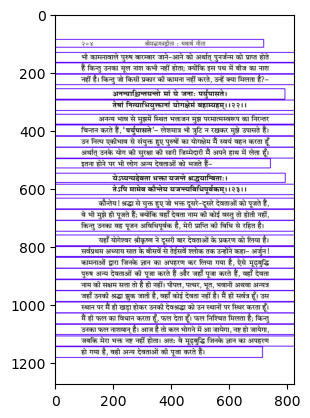

Text for each image:
२१० श्रीमद्भगवद्गीता : यथार्थ गीता

योगेश्वर श्रीकृष्ण ने योग के ऐश्वर्य पर भी प्रकाश डाला। दुःख के

संयोग का वियोग ही योग है अर्थात्‌ जो संसार के संयोग-वियोग से सर्वथा

रहित है, उसका नाम योग है। परमतत्त्व परमात्मा के मिलन का नाम योग है।

परमात्मा की प्राप्ति ही योग की पराकाष्ठा है। जो इसमें प्रवेश पा गया, उस

योगी के प्रभाव को देख कि सम्पूर्ण भूतों का स्वामी और जीवधारियों का

पोषण करनेवाला होने पर भी मेरा आत्मा उन भूतों में स्थित नहीं है। मैं

आत्मस्वरूप में स्थित हूँ। वही हूँ। जैसे आकाश से उत्पन्न सर्वत्र विचरनेवाला

वायु आकाश में ही स्थित है किन्तु उसे मलिन नहीं कर पाता, उसी प्रकार

सम्पूर्ण भूत मुझमें स्थित हैं लेकिन मैं उनमें लिप्त नहीं हूँ।

अर्जुन! कल्प के आदि में मैं भूतों को विशेष प्रकार से रचता हूँ, सजाता

हूँ और कल्प के पूर्तिकाल में सम्पूर्ण भूत मेरी प्रकृति को अर्थात्‌ योगारूढ़

महापुरुष की रहनी को, उनके अव्यक्त भाव को प्राप्त होते हैं। यद्यपि महापुरुष

प्रकृति से परे है; किन्तु प्राप्ति के पश्चात्‌ स्वभाव अर्थात्‌ स्वयं में स्थित रहते

हुए लोकसंग्रह क

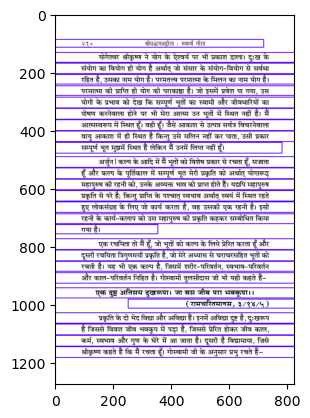

Text for each image:
दशम अध्याय २२५

हूँ। जलचरों में उनका अधिपति “वरुण हूँ तथा पितरों में 'अर्यमा' हूँ। अहिंसा,

सत्य, अस्तेय, ब्रह्मचर्य और अपरिग्रह पाँच यम हैं। इनके पालन में आनेवाले

विकारों को काटना 'अरः' है। विकारों के शमन से पितृ अर्थात्‌ भूत-संस्कार

तृप्त होते हैं, निवृत्ति प्रदान कर देते हैं। शासन करनेवालों में मैं यमराज हूँ.

अर्थात्‌ उपर्युक्त यमों का नियामक हूँ।

प्रह्मादश्चास्मि दैत्यानां काल: कलयतामहम्‌।

मृगाणां अ मृगेन्द्रोडहं वैनतेयश्व पक्षिणाम्‌।।३०।।

मैं दैत्यों में प्रह्माद हूँ। (पर + आह्वाद-पर के लिये आह्ाद) प्रेम ही

प्रह्ाद है। आसुरी सम्पद्‌ में रहते हुए ईश्वर के लिए आकर्षण-विकलता

आरम्भ होती है, जिससे परमप्रभु का दिग्दर्शन होता है, ऐसा प्रेमोल्लास मैं हूँ।

गिनती करनेवालों में मैं समय हूँ। एक, दो, तीन, चार ऐसी गिनती या क्षण,

घड़ी, दिन, पक्ष, मास इत्यादि नहीं, बल्कि ईश्वर के चिन्तन में लगा हुआ

समय मैं हूँ। यहाँ तक कि 'जागत में सुमिरन करे, सोबत में लब लाय।'

अनवरत चिन्तन में समय मैं हूँ। पशुओं में मृगराज [योगी भी मृ (जंगल) +

ग (गमन करना) अर्थात्‌ योगरूपी जंगल 

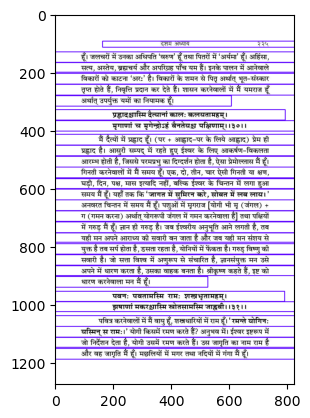

Text for each image:
२३० श्रीमद्भगवद्गीता : यथार्थ गीता

इस अध्याय में कुछ ही विभूतियों का स्पष्टीकरण किया गया है; क्योंकि

अगले ही अध्याय में अर्जुन इन सबको देखना चाहता है। प्रत्यक्ष दर्शन से ही

विभूतियाँ समझ में आती हैं। विचारधारा समझने के लिये इसी से थोड़ा अर्थ

दिया गया।

यदच्द्विभूतिमत्सत्त्वं श्रीमदूर्जितमेव वा।

तत्तदेवावगच्छ त्वं मम तेजोंडशसम्भवम्‌।।४९।।

जो-जो भी ऐश्वर्ययुक्त, कान्तियुक्त और शक्तियुक्त वस्तुएँ हैं, उन-उन

को तू मेरे तेज के एक अंशमात्र से उत्पन्न हुआ जान।

अथवा बहुनैतेन किं ज्ञातेन तवार्जुन।

विष्टभ्याहमिदं कृत्स्नमेकांशेन स्थितो जगत्‌।।४२।।

अथवा अर्जुन इस बहुत जानने से तेरा क्या प्रयोजन है? मैं इस सम्पूर्ण

जगत्‌ को एक अंशमात्र से धारण करके स्थित ह्ँ।

उपर्युक्त विभूतियों के वर्णन का तात्पर्य यह नहीं है कि आप या अर्जुन

इन सभी वस्तुओं को पूजने लगें, बल्कि श्रीकृष्ण का आशय केवल इतना ही

है कि इन सब ओर से श्रद्धा समेटकर केवल उन अविनाशी परमात्मा में

लगावें। इतने से ही उनका कर्त्तव्य पूर्ण हो जाता है।

निष्कर्ष-

इस अध्याय में श्रीकृष्ण ने कहा कि, अर्जुन! मैं त

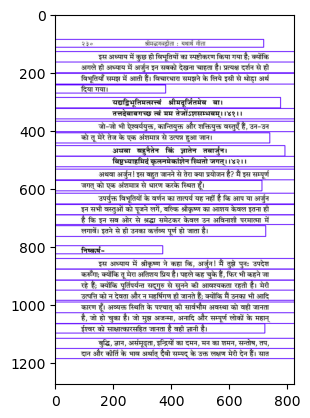

Text for each image:
२३८ श्रीमद्धगवद्वीता : यथार्थ गीता

भगवन्‌| आप जानने योग्य परम अक्षर अर्थात्‌ अक्षय परमात्मा हैं,

आप इस जगत्‌ के परम आश्रय हैं, आप शाश्वत-धर्म के रक्षक हैं तथा आप

अविनाशी सनातन पुरुष हैं- ऐसा मेरा मत है। आत्मा का स्वरूप क्या है?

शाश्वत है, सनातन है, अव्यक्त रूप है, अविनाशी है। यहाँ श्रीकृष्ण का क्या

स्वरूप है? वही शाश्वत, सनातन, अव्यय, अविनाशी अर्थात्‌ प्राप्ति के पश्चात्‌

महापुरुष भी उसी आत्मभाव में स्थित होता है। तभी तो भगवान और आत्मा

एक ही लक्षणवाले हैं।

अनादिधभध्यान्तमनन्तवीर्य-

मनन्‍्तबाहुं शशिसूर्यनेत्रम्‌।

पश्यामि त्वां दीप्तहुताशवक्त्रं

स्वतेजसा विश्वमिदं तपन्‍्तम्‌।।१९।।

हे परमात्मन्‌! मैं आपको आदि, मध्य और अन्त से रहित, अनन्त

सामर्थ्य से युक्त, अनन्त हाथोंबाला (पहले हजारों थे, अब अनन्त हो गये),

चन्द्रमा और सूर्यरूपी नेत्रोंबाला (तब तो भगवान काने हो गये। एक आँख

चन्द्रमा की तरह क्षीण प्रकाशवाली और दूसरी सूर्य की तरह सतेज। ऐसा कुछ

नहीं है। सूर्य के समान प्रकाश प्रदान करनेवाला और चन्द्रमा की तरह शीतलता

प्रदान करनेवाला गुण भगवान में है। शशि-सूर

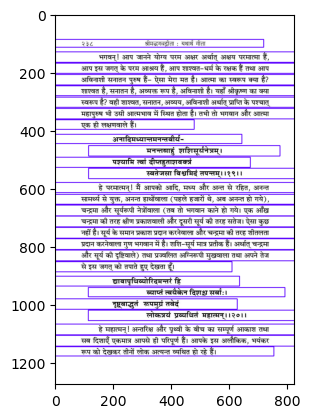

Text for each image:
२३२ श्रीमद्धगवद्गीता : यथार्थ गीता

मेरे तेज के अंशमात्र में स्थित हैं। वस्तुतः मेरी विभूतियाँ अपार हैं। ऐसा कहते

हुए योगेश्वर ने इस अध्याय का पटाक्षेप किया।

इस अध्याय में श्रीकृष्ण ने अपनी विभूतियों की मात्र बौद्धिक जानकारी

दी, जिससे अर्जुन की श्रद्धा सब ओर से सिमटकर एक इृष्ट में लग जाय।

किन्तु बन्धुओ ! सब कुछ सुन लेने और बाल की खाल निकालकर समझ लेने

के बाद भी चलकर उसे जानना शेष ही रहता है। यह क्रियात्मक पथ है।

सम्पूर्ण अध्याय में योगेश्वर की विभूतियों का ही वर्णन है। अतः-

ॐ तत्सदिति श्रीमद्धगवद्गीतासूपनिषत्सु ब्रह्मविद्यायां योगशास्त्रे

श्रीकृष्णार्जुनसम्बादे 'विभूतिवर्णनम्‌' नाम दशमोउध्याय:।।१०।।

इस प्रकार श्रीमद्भगवद्‌गीतारूपी उपनिषद्‌ एवं ब्रह्मविद्या तथा योगशाख

विषयक श्रीकृष्ण और अर्जुन के सम्बाद में 'विभूति वर्णन' नामक दसवाँ

अध्याय पूर्ण होता है।

इति श्रीमत्परमहंसपरमानन्दस्य शिष्य स्वामीअड़गड़ानन्दकृते

श्रीमद्धगवद्वीताया: 'यथार्थगीता 'भाष्ये 'विभूतिवर्णनम्‌' नाम

दश्मो5ध्याय:।।१०।।

इस प्रकार श्रीमत्‌ परमहंस परमानन्दजी के शिष्य स्वामी अड़गड़ानन्द

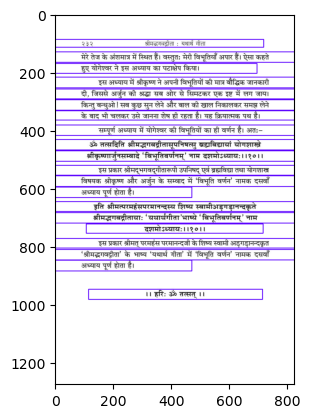

Text for each image:
एकादश अध्याय २४३

अर्जुन! मैं लोकों का नाश करनेवाला बढ़ा हुआ काल हूँ और इस

समय इन लोकों को नष्ट करने के लिये प्रवृत्त हुआ हूँ। प्रतिपक्षियों की सेना में

स्थित जितने योद्धा हैं वे सब तेरे बिना भी नहीं रहेंगे, वे जीवित नहीं बचेंगे

इसीलिये प्रवृत्त हुआ हूँ।

तस्मात्त्वमुत्तिष्ठ यशो लभस्व

जित्वा शत्रून्भुडःक्ब राज्यं समृद्धम्‌।

मयैबैते निहता: पूर्वमेव

निमित्तमात्र भव सव्यसाचिन्‌।।३३।।

इसलिये अर्जुन | तू युद्ध के लिये खड़ा हो, यश प्राप्त कर। शत्रुओं को

जीत, समृद्धि-सम्पन्न राज्य को भोग। ये सब शूरवीर मेरे द्वारा पहले से ही मारे

हुए हैं। सव्यसाचिन्‌! तू केवल निमित्तमात्र बन।

प्रायः सर्वत्र श्रीकृष्ण ने कहा है कि वह परमात्मा न कुछ स्वयं करता

है, न कराता है, न संयोग ही जोड़ता है; मोहावृत्त बुद्धि के कारण ही लोग

कहते हैं कि परमात्मा कराता है; किन्तु यहाँ वे स्वयं ताल ठोंककर खड़े हो

जाते हैं कि, अर्जुन | कर्त्ता-धर्ता तो मैं हूँ। मेरे द्वारा ये पहले से ही मारे हुए हैं।

तू खड़ा भर हो, यश ले ले। ऐसा इसलिये है कि 'सो केवल भगतन हित

लागी। ' ( रामचरितमानस, १/१२/५ ) अ

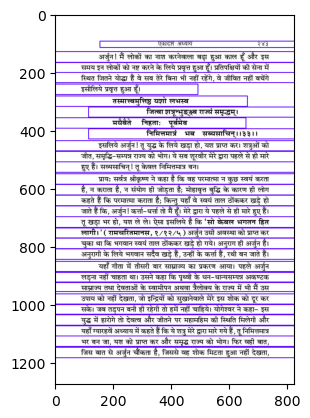

Text for each image:
एकादश अध्याय २४९

हैं। कोई 'ओम' जपने के अधिकार और अनधिकार की चर्चा से भयभीत है,

तो कोई महात्माओं की दुहाई देता है अथवा कोई श्रीकृष्ण ही नहीं, उनसे पहले

राधा और गोपियों का नाम भी उनकी शीत्र प्रसन्नता के लोभ में जपता है।

पुरुष श्रद्धामय है इसलिये उसका ऐसा जपना मात्र भावुकता है। यदि आप

सचमुच भाविक हैं तो उनके आदेश का पालन करें। वे अव्यक्त में स्थित होते

हुए भी आज आपके सामने नहीं हैं लेकिन उनकी वाणी आपके समक्ष है।

उनकी आज्ञा का पालन करें अन्यथा आप ही बताइये कि गीता में आपका

क्या स्थान हैं? हाँ, इतना अवश्य है कि 'अध्येष्यते चर या इमं.....

श्रद्धावाननसूयश्च श्रुणुयादपि यो नर:। '- जो अध्ययन करता है, सुनता है

वह ज्ञान तथा यज्ञ को जान लेता है, शुभ लोकों को पा जाता है। अतः

अध्ययन अवश्य करें।

प्राण-अपान के चिन्तन में “कृष्ण' नाम का क्रम पकड़ में नहीं आता।

बहुत से लोग कोरी भावुकतावश केवल 'राधे-राधे' कहने लगे हैं। आजकल

अधिकारियों से काम न होने पर उनके सगे-सम्बन्धियों से, प्रेमी या पत्नी से

'सोर्स' लगाकर काम चला लेने की परम्परा है। लोग सोचते हैं कि कदाचित्‌

भगवान 

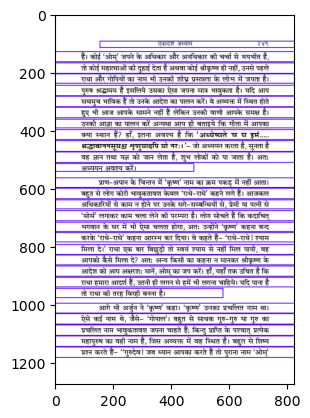

Text for each image:
|| ॐ श्री परमात्मने नमः ||

 अथ द्वादशीडध्याय: ||

एकादश अध्याय के अन्त में श्रीकृष्ण ने बार-बार बल दिया कि-

अर्जुन | मेरा यह स्वरूप जिसे तूने देखा, तेरे सिजाय न पहले कभी देखा गया

है और न भविष्य में कोई देख सकेगा। मैं न तप से, न यज्ञ से और न दान से

ही देखे जाने को सुलभ हूँ; किन्तु अनन्य भक्ति के द्वारा अर्थात्‌ मेरे अतिरिक्त

अन्यत्र कहीं श्रद्धा बिखरने न पाये, निरन्तर तैलधारावत्‌ मेरे चिन्तन के द्वारा

ठीक इसी प्रकार जैसा तूने देखा, मैं प्रत्यक्ष देखने के लिये, तत्त्व से साक्षात्‌

जानने के लिये और प्रवेश करने के लिये भी सुलभ हूँ। अतः अर्जुन ! निरन्तर

मेरा ही चिन्तन कर, भक्त बन। अर्जुन ! तू मेरे ही द्वारा निर्धारित किये गये कर्म

को कर। “ मत्परम: '- अपितु मेरे परायण होकर कर। अनन्य भक्ति ही उनकी

प्राप्ति का माध्यम है। इस पर अर्जुन का प्रश्न स्वाभाविक है कि जो अव्यक्त

अक्षर की उपासना करते हैं और जो सगुण आपकी उपासना करते हैं, इन दोनों

में श्रेष्ठ कौन है?

यहाँ इस प्रश्न को अर्जुन ने तीसरी बार उठाया है। अध्याय तीन में उसने

'कहा- भगवन्‌! यदि निष्काम कर्मयोग की 

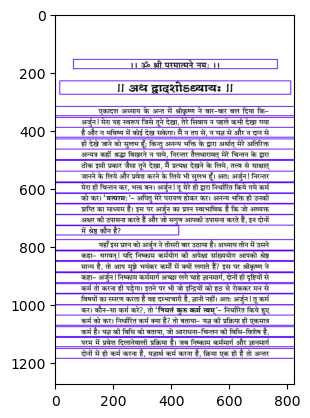

Text for each image:
२६२ श्रीमद्भगवद्गीता : यथार्थ गीता

ये तु सर्वाणि कर्माणि मयि सन्न्यस्य मत्परा:।

अनन्येनैब योगेन मां ध्यायन्त उपासते।।६।।

जो मेरे परायण होकर सम्पूर्ण कर्मों अर्थात्‌ आराधना को मुझमें अर्पण

करके अनन्य भाव से योग अर्थात्‌ आराधना-प्रक्रिया के द्वारा निरन्तर चिन्तन

करते हुए भजते हैं-

तेषामहं समुद्धर्ता मृत्युसंसारसागरात्‌।

भवामि नचिरात्पार्थ मव्यावेशितच्षेतसाम्‌। | ७।।

केवल मुझमें चित्त लगानेवाले उन भक्तों का मैं शीघ्र ही मृत्युरूप

संसार-सागर से उद्धार करनेवाला होता हूँ। इस प्रकार चित्त लगाने की प्रेरणा

और विधि पर योगेश्वर प्रकाश डालते हैं-

मण्येव मन आधत्स्व मयि बुद्धधिं निवेशय।

'निवसिष्यसि मय्येव अत ऊर्ध्व न संशय:।।८।।

इसलिये अर्जुन! तू मुझमें मन लगा, मुझमें ही बुद्धि लगा। इसके

उपरान्त तू मुझमें ही निवास करेगा, इसमें कुछ भी संशय नहीं है। मन और

बुद्धि भी न लगा सके, तब? (अर्जुन ने पीछे कहा भी है कि मन को रोकना तो

मैं वायु की तरह दुष्कर समझता हूँ) इस पर योगेश्वर श्रीकृष्ण कहते हैं-

अथ चित्त समाधातुं न शक्कोषि मयि स्थिरम्‌।

अभ्यासयोगेन ततो मामिच्छाप्तुं ध

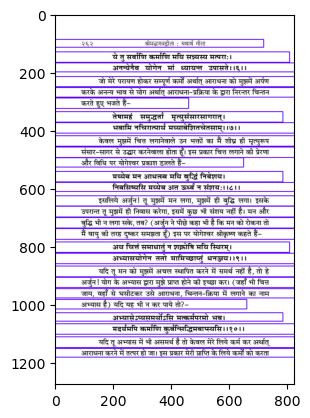

Text for each image:
२६८ श्रीमद्धगवद्वीता : यथार्थ गीता

ॐ तत्सदिति श्रीमद्धगवद्गीतासूपनिषत्सु ब्रह्मविद्यायां योगशास्त्रे

श्रीकृष्णार्जुनसम्बादे ' भक्तियोगो' नाम द्वादशो5ध्याय:।।१२।।

इस प्रकार श्रीमद्भगवद्‌गीतारूपी उपनिषद्‌ एवं ब्रह्मविद्या तथा योगशाख

विषयक श्रीकृष्ण और अर्जुन के संवाद में 'भक्तियोग' नामक बारहवाँ अध्याय

पूर्ण होता है।

इति श्रीमत्परमहंसपरमानन्दस्यथ शिष्य स्वामीअड़गड़ानन्दकृते

श्रीमद्भगवद्गीताया: 'यथार्थगीता ' भाष्ये ' भक्तियोगो' नाम

द्वादशो5ध्याय:।।१२।।

इस प्रकार श्रीमत्‌ परमहंस परमानन्दजी के शिष्य स्वामी अड़गड़ानन्दकृत

'श्रीमद्धगवद्वीता' के भाष्य “यथार्थ गीता' में 'भक्तियोग' नामक बारहवाँ अध्याय

पूर्ण होता है।

|| हरि: ॐ तत्सत्‌ ||



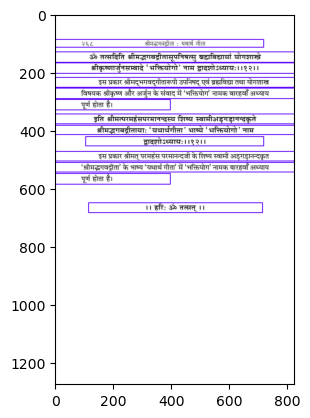

Text for each image:
२७६ श्रीमद्भगवद्गीता : यथार्थ गीता

के गुणों का संग समाप्त होने पर ही जन्म-मृत्यु से मुक्ति मिलती है। अब उस

पुरुष पर प्रकाश डालते हैं कि वह किस प्रकार प्रकृति में खड़ा है?-

उपद्रष्टानुमन्ता च भर्ता भोक्ता महेश्वर:।

परमात्मेति चाप्युक्तो देहेउस्मिन्पुरुष: पर:।।२२।।

वह पुरुष उपद्रष्टा, हृदय-देश में बहुत ही समीप- हाथ, पाँव, मन

जितना आपके समीप है उससे भी अधिक समीप द्रष्टा के रूप में स्थित है।

उसके प्रकाश में आप भला करें, बुरा करें, उसे कोई प्रयोजन नहीं है। वह

साक्षी के रूप में खड़ा है। साधना का सही क्रम पकड़ में आने पर पथिक कुछ

ऊपर उठा, उसकी ओर बढ़ा तो द्रष्ट पुरुष का क्रम बदल जाता है, वह

“अनुमन्ता '- अनुमति प्रदान करने लगता है, अनुभव देने लगता है। साधना

द्वारा और समीप पहुँचने पर वही पुरुष 'भर्ता' बनकर भरण-पोषण करने

लगता है, जिसमें आपके योगक्षेम की भी व्यवस्था कर देता है। साधना और

सूक्ष्म होने पर वही ' भोक्ता ' हो जाता है। ' भोक्तारं यज्ञ तपसाम्‌'- यज्ञ, तप

जो कुछ भी बन पड़ता है, सबको वह पुरुष ग्रहण करता है। और जब ग्रहण

कर लेता है, उसके बादवाली अवस्था में

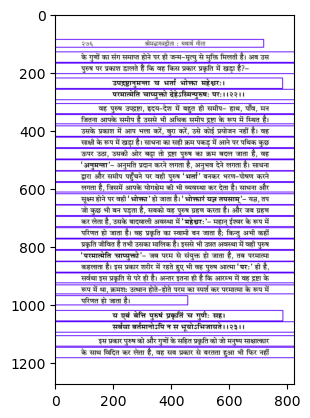

Text for each image:
२८० श्रीमद्भगवद्गीता : यथार्थ गीता

निष्कर्ष-

गीता के आरम्भ में धर्मक्षेत्र, कुरुक्षेत्र का नाम तो लिया गया; किन्तु वह

क्षेत्र वस्तुतः है कहाँ?- वह स्थल बताना शेष था, जिसे स्वयं शाखत्रकार ने

प्रस्तुत अध्याय में स्पष्ट किया- कौन्तेय |! यह शरीर ही एक क्षेत्र है। जो इसको

जानता है, वह क्षेत्रज्ञ है। वह इसमें फँसा नहीं बल्कि निर्लेप है। इसका

संचालक है। “अर्जुन! सम्पूर्ण क्षेत्रों में मैं भी क्षेत्रज्ञ हूँ।''- अन्य महापुरुषों से

अपनी तुलना की। इससे स्पष्ट है कि श्रीकृष्ण भी एक योगी थे; क्योंकि जो

जानता है ठह क्षेत्रज्ञ है, ऐसा महापुरुषों ने कहा है। मैं भी क्षेत्रज्ञ हूँ अर्थात्‌ अन्य

महापुरुषों की तरह मैं भी हूँ।

उन्होंने क्षेत्र जैसा है, जिन विकारोंजाला है तथा क्षेत्रज्ञ जिन प्रभावोंवाला

है, उस पर प्रकाश डाला। मैं ही कहता हूँ-- ऐसी बात नहीं है, महर्षियों ने भी

यही कहा है। वेद के छन्दों में भी उसी को विभाजित करके दर्शाया गया है।

ब्रह्मसूत्र में भी वही मिलता है।

शरीर (जो क्षेत्र है) क्या इतना ही है, जितना दिखायी देता है? इसके

होने के पीछे जिनका बहुत बड़ा हाथ

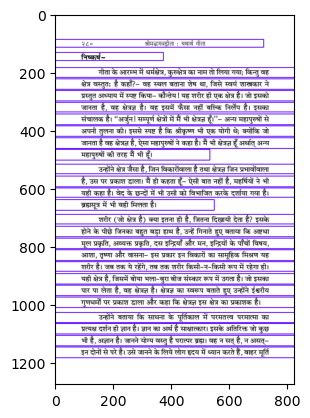

Text for each image:
२७८ श्रीमद्भगवद्गीता : यथार्थ गीता

सम॑ सर्वेषु भूतेषु तिष्ठन्त॑ परमेश्वरम्‌।

'विनश्यत्स्वविनएयन्तं य: पश्यति स पश्यति।। २७।।

जो पुरुष विशेष रूप से नष्ट होते हुए चराचर सभी भूतों में नाशरहित

परमेश्वर को समभाव से स्थित देखता है, वही यथार्थ देखता है। अर्थात्‌ उस

प्रकृति के विशेष रूप से नष्ट होने पर ही वह परमात्मस्वरूप है, इससे पहले

नहीं। इसी पर पीछे अध्याय आठ में भी कहा, ' भूतभावोद्धवकरो बिसर्ग:

कर्मसउिज्ञत:। '- भूतों के वे भाव, जो ( भले अथवा बुरे) कुछ भी (संस्कार)

संरचना करते हैं, उनका मिट जाना ही कर्म की पराकाष्ठा है। उस समय कर्म

पूर्ण है। वही यहाँ भी कहते हैं कि जो चराचर भूतों को नष्ट होते हुए और

परमेश्वर को समभाव से स्थित देखता है, वही सही देखता है।

सम॑ पश्यन्हि सर्वत्र समवस्थितमी श्वरम्‌।

न हिनस्त्यात्मनात्मानं ततो याति परां गतिम्‌।।२८।।

क्योंकि वह पुरुष सर्वत्र समभाव से स्थित परमेश्वर को समान (जैसा

है, वैसा ही समान) देखता हुआ अपने द्वारा स्वयं को नष्ट नहीं करता। क्योंकि

जैसा था, वैसा उसने देखा इसलिये वह परमगति को प्राप्त होता है। प्राप्तिवाले

पुरु

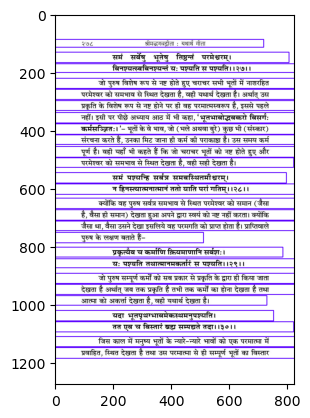

Text for each image:
त्रयोदश अध्याय २८१

रखकर नहीं। बहुत से लोग सांख्य-माध्यम से ध्यान करते हैं, तो शेष निष्काम

'कर्मयोग, समर्पण के साथ उसकी प्राप्ति के लिये उसी निर्धारित कर्म आराधना

का आचरण करते हैं। जो उसकी विधि नहीं जानते, वे तत्त्वस्थित महापुरुष के

द्वारा सुनकर आचरण करते हैं। वे भी परमकल्याण को प्राप्त हो जाते हैं। अतः

कुछ भी समझ में न आये तो उसके ज्ञाता महापुरुष का सत्संग आवश्यक है।

स्थितप्रज्ञ महापुरुष के लक्षण बताते हुए योगेश्वर श्रीकृष्ण ने कहा

कि- जैसे आकाश सर्वत्र सम रहता हुआ भी निर्लेप है, जैसे सूर्य सर्वत्र प्रकाश

करते हुए भी निर्लेप है, ठीक इसी प्रकार स्थितप्रज्ञ पुरुष, सर्वत्र सम ईश्वर को

जैसा है बैसा ही देखने की क्षमतावाला पुरुष क्षेत्र से अथवा प्रकृति से सर्वथा

निर्लेप है। अन्त में उन्होंने निर्णय दिया कि क्षेत्र और क्षेत्रज्ष की जानकारी

ज्ञानरूपी नेत्रों द्वारा ही सम्भव है। ज्ञान, जैसा कि पीछे बताया गया, उस

परमात्मा के प्रत्यक्ष दर्शन के साथ मिलनेवाली जानकारी है। शास्त्रों को बहुत

रटकर दुहराना ज्ञान नहीं बल्कि अध्ययन तथा महापुरुष से उस कर्म को

समझकर, उस क

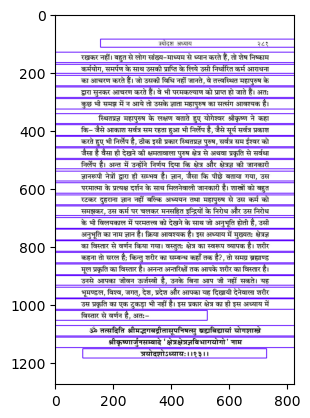

Ignored file: datasets/Devanagari datasets/annotations/0288.txt
Text for each image:
॥ॐ श्री परमात्मने नम:।।

॥अथ पच्चदशोड्ध्याय :।|

महापुरुषों ने संसार को विभिन्न दृष्टान्तों से समझाने का प्रयास किया है।

किसी ने इसी को भवाटवी कहा, तो किसी ने संसार-सागर कहा। अवस्था-

भेद से इसी को भजनदी और भवकूप भी कहा गया और कभी इसकी तुलना

गोपद से की गयी अर्थात्‌ जितना इन्द्रियों का आयतन है, उतना ही संसार है

और अन्त में ऐसी भी अवस्था आयी कि 'नामु लेत भवसिन्धु सुखाहीं।'

( रामचरितमानस, १./२४/४ )- भवसिन्धु भी सूख गया। क्‍या संसार में

ऐसे समुद्र हैं? योगेश्वर श्रीकृष्ण ने भी संसार को समुद्र और वृक्ष की संज्ञा दी।

अध्याय बारह में उन्होंने कहा- जो मेरे अनन्य भक्त हैं, उनका संसार- समुद्र से

शीघ्र ही उद्धार करनेवाला होता हूँ। यहाँ प्रस्तुत अध्याय में योगेश्वर श्रीकृष्ण

कहते हैं कि संसार एक वृक्ष है, उसको काटते हुए ही योगीजन उस परमपद

को खोजते हैं। देखें-

श्रीधथगवानुवाच

ऊर्ध्वमूलमध:शाखमश्चत्थं प्राहुरव्यय्म्‌।

उन्दांसि यस्य पर्णानि यस्तं बेद स वेदबित्‌।। १।।

अर्जुन 'ऊर्ध्वमूलम्‌'- ऊपर को परमात्मा 

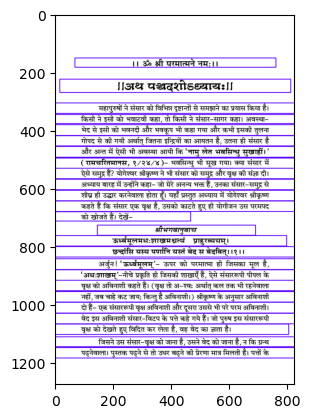

Ignored file: datasets/Devanagari datasets/annotations/0300.txt
Ignored file: datasets/Devanagari datasets/annotations/0303.txt
Text for each image:
३२८ श्रीमद्भगवद्गीता : यथार्थ गीता

राजसी और तामसी तीन प्रकार की होती है। सात्त्विकी श्रद्धावाले देवताओं

को, राजसी श्रद्धावाले यक्ष (जो यश, शौर्य प्रदान करे), राक्षसों (जो सुरक्षा दे

सके) का पीछा करते हैं और तामसी श्रद्धावाले भूत-प्रेतों को पूजते हैं।

शास्त्रविधि से रहित इन पूजाओं द्वारा ये तीनों प्रकार के श्रद्धालु शरीर में स्थित

भूतसमुदाय अर्थात्‌ अपने संकल्पों और हृदय-देश में स्थित मुझ अन्तर्यामी

को भी कृश करते हैं, न कि पूजते हैं। उन सबको निश्चय ही तू असुर जान

अर्थात्‌ भूत, प्रेत, यक्ष, राक्षस तथा देवताओं को पूजनेवाले असुर हैं।

देवता-प्रसंग को श्रीकृष्ण ने यहाँ तीसरी बार उठाया है। पहले अध्याय

सात में उन्होंने कहा कि- अर्जुन! कामनाओं ने जिनका ज्ञान हर लिया है, वही

मूढ़बुद्धि अन्य देवताओं की पूजा करते हैं। दूसरी बार अध्याय नौ में उसी प्रश्न

को दुहराते हुए कहा- जो अन्यान्य देवताओं की पूजा करते हैं, वे भी मुझे ही

'पूजते हैं; किन

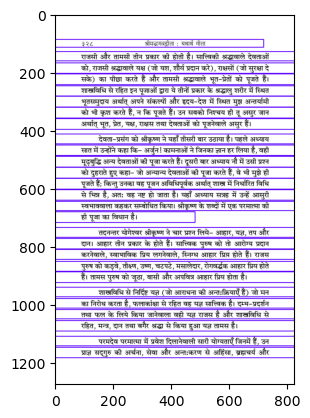

Ignored file: datasets/Devanagari datasets/annotations/0361.txt
Text for each image:
३६४ श्रीमद्भगवद्गीता : यथार्थ गीता

दिया। अध्याय २/१६ में उन्होंने कहा- अर्जुन! असत्‌ वस्तु का तो अस्तित्व

नहीं है और सत्‌ का तीनों कालों में अभाव नहीं है। भगवान होने के कारण यह

मैं अपनी ओर से नहीं कह रहा हूँ बल्कि इनका अन्तर तत्त्वदर्शियों ने देखा;

और वही मैं कहने जा रहा हूँ। तेरहवें अध्याय में उन्होंने क्षेत्र-क्षेत्रज् का वर्णन

उसी प्रकार किया, जो 'ऋषिभिर्बहुधागीतम्‌'- ऋषियों द्वारा प्रायः गाया जा

चुका था। अठारहवें अध्याय में त्याग और संन्यास का तत्त्व बताते हुए उन्होंने

चार मतों में से एक का चयन किया और उसे अपना समर्थन दिया।

संन्‍्यास- कृष्णकाल में अग्नि को न छूनेवाले तथा चिन्तन का भी

त्याग करके अपने को योगी, संन्‍्यासी कहनेवालों का सम्प्रदाय भी पनप रहा

था। इसका खण्डन करते हुए उन्होंने स्पष्ट किया कि ज्ञानमार्ग तथा भक्तिमार्ग,

दोनों में से किसी भी मार्ग के अनुसार कर्म को त्यागने का विधान नहीं है, कर्म

तो करना ही होगा। कर्म करते-करते साधना इतनी सूक्ष्म हो जाती है कि

सर्वसंकल्पों का अभाव 

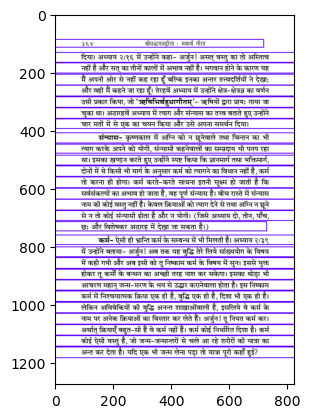

Text for each image:
उपशम ३७५

को जहर पिलाया गया; क्योंकि वह लोगों को नास्तिक बना रहा था। ऐसा ही

आरोप ईसा पर भी लगाया गया, उन्हें सूली दी गयी; क्योंकि वे विश्राम

सव्वाथ के दिन भी काम करते थे, अन्धों को दृष्टि प्रदान करते थे। ऐसा ही

भारत में भी है। जब भी कोई प्रत्यक्षदर्शी महापुरुष सत्य की ओर इंगित करता

है तो इन मन्दिर, मस्जिद, मठ, सम्प्रदाय और तीर्थों से जिनकी जीविका

चलती है, हाय-हाय करने लगते हैं, अधर्म-अधर्म चिल्लाने लगते हैं। किसी

को इनसे लाखों-करोड़ों की आय है, तो किसी की दाल-रोटी ही चलती है।

वास्तविकता के प्रचार से उनकी जीविका को खतरा दिखायी पड़ता है। वे

सत्य को पनपने नहीं देते और न दे सकते हैं। इसके अतिरिक्त उनके विरोध का

कोई कारण नहीं है। सुदूरकाल में यह स्मृति क्यों सँजोयी गयी थी, इसका उन्हें

भान नहीं है।

गृहस्थों का अधिकार- प्रायः लोग पूछते हैं कि जब कर्म का यही

स्वरूप है, जिसमें एकान्त-देश का सेवन, इन्द्रिय-संयम, निरन्तर चिन्तन और

ध्यान करना है, तब तो गीता गृहस्थों के लिये अनुपयोगी है। तब तो गीता

केवल साधुओं के लिये है। किन्तु ऐसा कुछ भी नहीं है। गीता मूलतः उसके

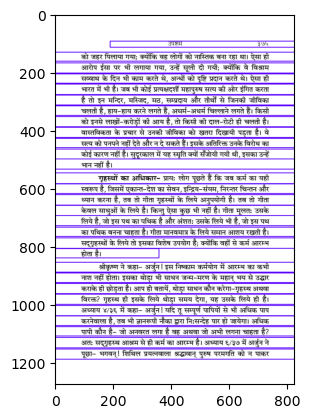

In [ ]:
if __name__ == "__main__":
    image_files_dir = 'datasets/Devanagari datasets/images'
    text_files_dir = 'datasets/Devanagari datasets/annotations'
    output_dir = 'datasets/Devanagari datasets/segmentation'

    all_data = []
    all_dataset = []
    all_vocab = set()
    all_maxlen = 0

    # Iterate over each image and text file pair
    for image_file_name in os.listdir(image_files_dir):
        if image_file_name.endswith('.jpg') or image_file_name.endswith('.png'):
            image_path = os.path.join(image_files_dir, image_file_name)
            text_file_name = image_file_name[:4] + '.txt'  # Extract the first 4 characters from the image file name
            text_path = os.path.join(text_files_dir, text_file_name)

            # Create TextExtractor object for each pair
            extractor = TextExtractor(image_path, text_path, output_dir)
            extractor.preprocess_image()
            extractor.extract_text_regions()
            all_data.extend(extractor.data)
            all_dataset.extend(extractor.dataset)
            all_vocab.update(extractor.vocab)
            all_maxlen = max(all_maxlen, extractor.maxlen)

    # Save all data to CSV
    csv_output_file = os.path.join('datasets/Devanagari datasets/', 'segmented_lines.csv')
    with open(csv_output_file, "w", newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(['Path', 'Label'])
        csv_writer.writerows(all_data)

    # Assign aggregated values
    dataset = all_dataset
    vocab = all_vocab
    maxlen = all_maxlen


In [ ]:
%cd drive/MyDrive

/content/drive/MyDrive


In [ ]:
!ls

'6CS012 - Artificial Intelligence and ML'   data      'Getting started.pdf'   Models
'Colab Notebooks'			    datasets   Model		      rotated_image_4.jpg


In [ ]:
import pandas as pd
df = pd.read_csv('datasets/Devanagari datasets/segmented_lines.csv')
df.head(10)

,Path,Label
0,datasets/Devanagari datasets/segmentation/0001...,|| ॐ श्री परमात्मने नमः ||\n
1,datasets/Devanagari datasets/segmentation/0001...,|| अथ श्रीमद्भगवद्गीता ||\n
2,datasets/Devanagari datasets/segmentation/0001...,|| यथार्थ गीता ||\n
3,datasets/Devanagari datasets/segmentation/0001...,|| अथ प्रथमोऽध्याय: ||\n
4,datasets/Devanagari datasets/segmentation/0001...,धृतराष्ट्र उवाच\n
5,datasets/Devanagari datasets/segmentation/0001...,धर्मक्षेत्रे कुरुक्षेत्रे समबेता युयुत्सव:।\n
6,datasets/Devanagari datasets/segmentation/0001...,मामका: पाण्डवाश्चैव किमकुर्वत सञ्जय।। १।।\n
7,datasets/Devanagari datasets/segmentation/0001...,"धृतराष्ट्र ने पूछा- “हे संजय ! धर्मक्षेत्र, कु..."
8,datasets/Devanagari datasets/segmentation/0001...,इच्छावाले मेरे और पाण्डु के पुत्रों ने क्‍या क...
9,datasets/Devanagari datasets/segmentation/0001...,अज्ञानरूपी धृतराष्ट्र और संयमरूपी संजय। अज्ञान...


In [ ]:
len(df)

3442

In [ ]:
# Initialize an empty set to store the vocabulary
# dataset,vocab, maxlen = [],set(),0
import numpy as np
max_len = 0
d=[]
v=set()
# Iterate over the "Label" column values
for index, row in df.iterrows():
    path = row['Path']
    label = row['Label']

    d.append([path,label])
    v.update(list(label))
    max_len = np.maximum(max_len,len(label))

print(max_len,v)

90 {'उ', 'च', '॑', 'म', 'ल', ')', 'औ', 'ई', '४', '`', 'श', ' ', 'ऋ', 'ण', 'ॐ', 'भ', 'ग', 'व', 'ढ', 'r', 'ु', 'ह', '"', 'छ', 'ँ', 'े', 'इ', 't', 'झ', '»', '|', ':', 'य', 'ष', 'थ', '९', '१', 'ी', 'ट', 'द', '\u200d', 'आ', '२', 'ठ', '+', 'प', 'ए', '/', 'ब', 'M', 'ृ', 'e', '.', 'फ', '७', 'ै', '“', '्', 'ऽ', 'ो', 'ऐ', '॒', 'ौ', 'ं', 'घ', 'क', '5', 'ः', 'त', ';', 'ि', '3', '०', '-', '(', 'ओ', '़', 'ड', 'ख', '\n', 'ू', 'अ', 'ङ', 'न', '?', 'र', '!', ',', "'", '\u200c', 'ा', '६', 'ऊ', '।', '॥', '५', 'स', ']', 'ध', 'ञ', '८', '”', 'a', '३', 'ज', '['}


In [ ]:
# Print the vocabulary set
print("Vocabulary Set:", v)

Vocabulary Set: {'ज', '5', 'त', '१', '|', 'इ', 'ङ', 'छ', ']', '(', 'ट', '3', 'ॐ', 'ी', ',', '"', 'ड', "'", '॥', 'ं', '।', '`', 'M', 'व', '५', 'उ', '़', 'ँ', '॒', 'e', '८', 'च', 'r', 'फ', 'ऽ', 'ऋ', 'a', 'े', 'ठ', 'ई', '४', 'ै', ':', 'ौ', '९', 'ो', '[', ' ', '७', 'स', '३', 'य', 'घ', 'औ', 'ह', 'ब', 'थ', 'ख', '०', 'ऊ', '\u200d', '\u200c', ')', 'प', '”', ';', '्', '!', 'ल', '.', '“', 'द', 'ढ', 'अ', 'झ', '६', 'ा', 'ण', 'ऐ', 'म', 'ु', 'ए', 'ू', '»', 'ग', '?', 'ः', 'आ', 'ध', 't', 'क', '+', 'न', 'भ', 'ि', 'ष', 'र', '॑', 'श', '/', 'ृ', '२', 'ओ', '-', '\n', 'ञ'}


In [ ]:
max_len

90

In [ ]:
df[:10]

,Path,Label
0,datasets/Devanagari datasets/segmentation/0001...,|| ॐ श्री परमात्मने नमः ||\n
1,datasets/Devanagari datasets/segmentation/0001...,|| अथ श्रीमद्भगवद्गीता ||\n
2,datasets/Devanagari datasets/segmentation/0001...,|| यथार्थ गीता ||\n
3,datasets/Devanagari datasets/segmentation/0001...,|| अथ प्रथमोऽध्याय: ||\n
4,datasets/Devanagari datasets/segmentation/0001...,धृतराष्ट्र उवाच\n
5,datasets/Devanagari datasets/segmentation/0001...,धर्मक्षेत्रे कुरुक्षेत्रे समबेता युयुत्सव:।\n
6,datasets/Devanagari datasets/segmentation/0001...,मामका: पाण्डवाश्चैव किमकुर्वत सञ्जय।। १।।\n
7,datasets/Devanagari datasets/segmentation/0001...,"धृतराष्ट्र ने पूछा- “हे संजय ! धर्मक्षेत्र, कु..."
8,datasets/Devanagari datasets/segmentation/0001...,इच्छावाले मेरे और पाण्डु के पुत्रों ने क्‍या क...
9,datasets/Devanagari datasets/segmentation/0001...,अज्ञानरूपी धृतराष्ट्र और संयमरूपी संजय। अज्ञान...


In [ ]:
pip install mltu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 58.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 90.0 MB/s eta 0:00:00
  Created wheel for qqdm: filename=qqdm-0.0.7-py3-none-any.whl size=6466 sha256=e05591ef8f9e563ff4ce04fdf2a1ca9fef659735ebff8258f3bd63866441dd73
  Stored in directory: /root/.cache/pip/wheels/40/1a/56/5dccdea123a172661eb65c8c29fde4567dbda2b72b5fc5893a
Successfully built qqdm


In [ ]:
import tensorflow as tf
tf.config.experimental.set_memory_growth(tf.config.list_physical_devices('GPU')[0], True)

In [ ]:
!pip install --upgrade tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 101.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 100.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 109.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 70.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 39.7 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      Successfully uninstalled h5py-3.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.2
    Uninstalling tensorboard-2.15.2:
      Successfully uninstalled tensorboard-2.15.2
  Attempting uninstall: keras
   

In [ ]:
pip install --upgrade keras

In [ ]:
import tensorflow as tf

# Get the GPU device name.
device_name = tf.test.gpu_device_name()

# Create a session with GPU growth enabled.
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')

config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True

In [ ]:
import os
from datetime import datetime
from mltu.configs import BaseModelConfigs

class ModelConfigs(BaseModelConfigs):
  def __init__(self):
    super().__init__()
    self.model_path = os.path.join("Model/Devanagari", datetime.strftime(datetime.now(),"%Y%m%d%H%M"))
    self.vocab = ""
    self.height = 96
    self.width = 1408
    self.max_text_length = None
    self.batch_size = 32
    self.learning_rate = 0.0005
    self.train_epochs = 1000
    self.train_workers = 20

In [ ]:
configs = ModelConfigs()
configs.vocab = "".join(v)
configs.max_text_length = max_len
configs.save()

In [ ]:
configs.vocab

'उच॑मल)औई४`श ऋणॐभगवढrुह"छँेइtझ»|:यषथ९१ीटद\u200dआ२ठ+पए/बMृe.फ७ै“्ऽोऐ॒ौंघक5ःत;ि3०-(ओ़डख\nूअङन?र!,\'\u200cा६ऊ।॥५स]धञ८”a३ज['

In [ ]:
configs.max_text_length

90

In [ ]:
from mltu.tensorflow.dataProvider import DataProvider
from mltu.preprocessors import ImageReader
from mltu.annotations.images import CVImage
from mltu.preprocessors import ImageReader
from mltu.transformers import ImageResizer, LabelIndexer, LabelPadding, ImageShowCV2
from mltu.augmentors import RandomBrightness, RandomRotate, RandomErodeDilate, RandomSharpen

In [ ]:
# Create a data provider for the dataset
data_provider = DataProvider(
    dataset=d,
    skip_validation=True,
    batch_size=configs.batch_size,
    data_preprocessors=[ImageReader(CVImage)],
    transformers=[
        ImageResizer(configs.width, configs.height, keep_aspect_ratio=True),
        LabelIndexer(configs.vocab),
        LabelPadding(max_word_length=configs.max_text_length, padding_value=len(configs.vocab)),
        ],
)

INFO:DataProvider:Skipping Dataset validation...


In [ ]:
# Split the dataset into training and validation sets
train_data_provider, val_data_provider = data_provider.split(split = 0.9)

In [ ]:
# Augment training data with random brightness, rotation and erode/dilate
train_data_provider.augmentors = [
    RandomBrightness(),
    RandomErodeDilate(),
    RandomSharpen(),
    ]

In [ ]:
from mltu.tensorflow.losses import CTCloss
from mltu.tensorflow.callbacks import Model2onnx, TrainLogger
from mltu.tensorflow.metrics import CERMetric, WERMetric

In [ ]:
pip install tf2onnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 35.1 MB/s eta 0:00:00


#Modeling

In [ ]:
from keras.models import load_model, Model
from keras import layers
from mltu.tensorflow.losses import CTCloss

def modify_output_dim(model_path, new_output_dim, dropout=0.2):
    # Load the trained model
    model = load_model(model_path, compile=False)

    # Remove output layer
    model.layers.pop()

    # Get the last bi-lstm layer output
    gru = model.layers[-1].output

    # # Adding additional bi-gru layers
    # gru = layers.Bidirectional(layers.GRU(32, return_sequences=True))(blstm_output)
    # gru = layers.Dropout(dropout, name="new_dropout_1")(gru)

    gru = layers.Bidirectional(layers.GRU(16, return_sequences=True))(gru)
    gru = layers.Dropout(dropout, name="new_dropout_2")(gru)

    gru = layers.Bidirectional(layers.GRU(8, return_sequences=True))(gru)
    gru = layers.Dropout(dropout, name="new_dropout_3")(gru)

    # Add a new output layer with the desired output dimension
    new_output_layer = layers.Dense(new_output_dim + 1, activation="softmax", name="new_output")(gru)

    # Create a new model with the modified output layer
    modified_model = Model(inputs=model.input, outputs=new_output_layer)

    # Compile the modified model with appropriate loss and optimizer
    # modified_model.compile(optimizer="adam", loss=CTCloss(), metrics=[CERMetric(vocabulary=configs.vocab), WERMetric(vocabulary=configs.vocab)])
    # Compile the model
    model.compile(optimizer='adam', loss=CTCloss(),metrics = [CERMetric(vocabulary=configs.vocab),WERMetric(vocabulary=configs.vocab)], run_eagerly=False)
    return modified_model

# new_output_dim = len(configs.vocab) # Specify the new output dimension
# # Load the existing model
# model_path = "Model/202403181515/model.h5"

# #load and Compile the model
# model = modify_output_dim(model_path, new_output_dim)


In [ ]:
from keras import layers
from keras.models import Model
# from keras.regularizers import l1_l2
from mltu.tensorflow.model_utils import residual_block


def train_model(input_dim, output_dim, activation="leaky_relu", dropout=0.2):

    inputs = layers.Input(shape=input_dim, name="input")

    # normalize images here instead in preprocessing step
    input = layers.Lambda(lambda x: x / 255)(inputs)

    x1 = residual_block(input, 32, activation=activation, skip_conv=True, strides=1, dropout=dropout)

    x2 = residual_block(x1, 32, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x3 = residual_block(x2, 32, activation=activation, skip_conv=False, strides=1, dropout=dropout)

    x4 = residual_block(x3, 64, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x5 = residual_block(x4, 64, activation=activation, skip_conv=False, strides=1, dropout=dropout)

    x6 = residual_block(x5, 128, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x7 = residual_block(x6, 128, activation=activation, skip_conv=True, strides=1, dropout=dropout)

    x8 = residual_block(x7, 128, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x9 = residual_block(x8, 128, activation=activation, skip_conv=False, strides=1, dropout=dropout)

    squeezed = layers.Reshape((x9.shape[-3] * x9.shape[-2], x9.shape[-1]))(x9)

    # Adding additional bi-gru layers
    gru = layers.Bidirectional(layers.GRU(256, return_sequences=True))(squeezed)
    gru = layers.Dropout(dropout)(gru)

    gru = layers.Bidirectional(layers.GRU(128, return_sequences=True))(gru)
    gru = layers.Dropout(dropout)(gru)

    output = layers.Dense(output_dim + 1, activation="softmax", name="output")(gru)

    model = Model(inputs=inputs, outputs=output)
    return model

In [ ]:
#create model
model = train_model(
    output_dim = len(configs.vocab),
    input_dim = (configs.height, configs.width, 3),
)

In [ ]:
model.compile(optimizer = 'adam', loss = CTCloss(), metrics = [CERMetric(vocabulary=configs.vocab),WERMetric(vocabulary=configs.vocab)], run_eagerly=False)

In [ ]:
model.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 96, 1408, 3  0           []                               
                                )]                                                                
                                                                                                  
 lambda_6 (Lambda)              (None, 96, 1408, 3)  0           ['input[0][0]']                  
                                                                                                  
 conv2d_144 (Conv2D)            (None, 96, 1408, 32  896         ['lambda_6[0][0]']               
                                )                                                                 
                                                                                           

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from mltu.tensorflow.callbacks import Model2onnx, TrainLogger

In [ ]:
# Define callbacks
earlystopper = EarlyStopping(monitor="val_CER", patience=300, verbose=1, mode="min")
checkpoint = ModelCheckpoint(f"{configs.model_path}/model.h5", monitor="val_CER", verbose=1, save_best_only=True, mode="min")
trainLogger = TrainLogger(configs.model_path)
tb_callback = TensorBoard(f"{configs.model_path}/logs", update_freq=1)
reduceLROnPlat = ReduceLROnPlateau(monitor="val_CER", factor=0.9, min_delta=1e-10, patience=5, verbose=1, mode="auto")
model2onnx = Model2onnx(f"{configs.model_path}/model.h5")

In [ ]:
#training the model now
model.fit(
    train_data_provider,
    validation_data = val_data_provider,
    epochs = 500,
    callbacks = [earlystopper, checkpoint, trainLogger, reduceLROnPlat, tb_callback,model2onnx],
    workers = configs.train_workers
)

Epoch 1/500


2024-03-24 18:24:45.246328: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_13/dropout_70/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


26/26 [==============================] - ETA: 0s - loss: 465.9467 - CER: 1.0846 - WER: 1.1056
Epoch 1: val_CER improved from inf to 0.98449, saving model to Model/Devanagari/202403241824/model.h5
26/26 [==============================] - 23s 183ms/step - loss: 465.9467 - CER: 1.0846 - WER: 1.1056 - val_loss: 285.4669 - val_CER: 0.9845 - val_WER: 1.0000 - lr: 0.0010
Epoch 2/500
26/26 [==============================] - ETA: 0s - loss: 256.5801 - CER: 0.8949 - WER: 1.2317
Epoch 2: val_CER did not improve from 0.98449
26/26 [==============================] - 7s 287ms/step - loss: 256.5801 - CER: 0.8949 - WER: 1.2317 - val_loss: 247.0378 - val_CER: 0.9845 - val_WER: 1.0000 - lr: 0.0010
Epoch 3/500
26/26 [==============================] - ETA: 0s - loss: 244.3859 - CER: 0.8453 - WER: 1.1680
Epoch 3: val_CER improved from 0.98449 to 0.95346, saving model to Model/Devanagari/202403241824/model.h5
26/26 [==============================] - 8s 301ms/step - loss: 244.3859 - CER: 0.8453 - WER: 1.1680

In [ ]:
# # Fit the model
# model.fit(
#     train_data_provider,
#     validation_data=val_data_provider,
#     epochs=2000,
#     callbacks=[earlystopper, checkpoint, trainLogger, reduceLROnPlat, tb_callback,model2onnx],
#     workers=configs.train_workers
# )

In [ ]:
# new_output_dim = len(configs.vocab) # Specify the new output dimension
# # Load the existing model
# model_path = "Model/Devanagari/202404101723/model.h5"

# #load and Compile the model
# model = modify_output_dim(model_path, new_output_dim)

In [ ]:
from keras.models import load_model, Model
# # Load the existing model
model_path = "Model/Devanagari/202404140605/model.h5"
model = load_model(model_path, compile = False)

# Compile the model
# model.compile(optimizer='adam', loss=CTCloss(),metrics = [CERMetric(vocabulary=configs.vocab),WERMetric(vocabulary=configs.vocab)], run_eagerly=False)

/content/drive/MyDrive


OSError: No file or directory found at Model/Devanagari/202404140605/model.h5

In [ ]:
# # Load the existing model
model_path = "Model/Devanagari/202405060512/model.h5"
model = load_model(model_path, compile = False)

In [ ]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 96, 1408, 3)]        0         []                            
                                                                                                  
 lambda_6 (Lambda)           (None, 96, 1408, 3)          0         ['input[0][0]']               
                                                                                                  
 conv2d_144 (Conv2D)         (None, 96, 1408, 32)         896       ['lambda_6[0][0]']            
                                                                                                  
 batch_normalization_108 (B  (None, 96, 1408, 32)         128       ['conv2d_144[0][0]']          
 atchNormalization)                                                                         

In [ ]:
# Define callbacks
earlystopper = EarlyStopping(monitor="val_CER", patience=50, verbose=1, mode="min")
checkpoint = ModelCheckpoint(f"{configs.model_path}/model.h5", monitor="val_CER", verbose=1, save_best_only=True, mode="min")
trainLogger = TrainLogger(configs.model_path)
tb_callback = TensorBoard(f"{configs.model_path}/logs", update_freq=1)
reduceLROnPlat = ReduceLROnPlateau(monitor="val_CER", factor=0.9, min_delta=1e-10, patience=5, verbose=1, mode="auto")
model2onnx = Model2onnx(f"{configs.model_path}/model.h5")

In [ ]:
# Fit the model
model.fit(
    train_data_provider,
    validation_data=val_data_provider,
    initial_epoch=2425,
    epochs=2500,
    callbacks=[earlystopper, checkpoint, trainLogger, reduceLROnPlat, tb_callback,model2onnx],
    workers=configs.train_workers
)

Epoch 2426/2500


2024-04-17 06:31:21.584333: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_3/dropout_70/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


97/97 [==============================] - ETA: 0s - loss: 300.2886 - CER: 0.9362 - WER: 0.9999
Epoch 2426: val_CER improved from inf to 0.98729, saving model to Model/Devanagari/202404170630/model.h5
97/97 [==============================] - 154s 1s/step - loss: 300.2886 - CER: 0.9362 - WER: 0.9999 - val_loss: 246.9025 - val_CER: 0.9873 - val_WER: 0.9993 - lr: 0.0010
Epoch 2427/2500
97/97 [==============================] - ETA: 0s - loss: 240.2099 - CER: 0.8480 - WER: 1.0003
Epoch 2427: val_CER improved from 0.98729 to 0.98365, saving model to Model/Devanagari/202404170630/model.h5
97/97 [==============================] - 109s 1s/step - loss: 240.2099 - CER: 0.8480 - WER: 1.0003 - val_loss: 217.5961 - val_CER: 0.9836 - val_WER: 0.9995 - lr: 0.0010
Epoch 2428/2500
97/97 [==============================] - ETA: 0s - loss: 221.5390 - CER: 0.8671 - WER: 1.0077
Epoch 2428: val_CER improved from 0.98365 to 0.97957, saving model to Model/Devanagari/202404170630/model.h5
97/97 [==================

In [ ]:
from keras.models import load_model, Model

# # Load the existing model
model_path = "Model/Devanagari/202405030509/model.h5"
model = load_model(model_path, compile = False)

# Compile the model
model.compile(optimizer='adam', loss=CTCloss(),metrics = [CERMetric(vocabulary=configs.vocab),WERMetric(vocabulary=configs.vocab)], run_eagerly=False)

In [ ]:
# Define callbacks
earlystopper = EarlyStopping(monitor="val_CER", patience=50, verbose=1, mode="min")
checkpoint = ModelCheckpoint(f"{configs.model_path}/model.h5", monitor="val_CER", verbose=1, save_best_only=True, mode="min")
trainLogger = TrainLogger(configs.model_path)
tb_callback = TensorBoard(f"{configs.model_path}/logs", update_freq=1)
reduceLROnPlat = ReduceLROnPlateau(monitor="val_CER", factor=0.9, min_delta=1e-10, patience=5, verbose=1, mode="auto")
model2onnx = Model2onnx(f"{configs.model_path}/model.h5")

In [ ]:
# Fit the model
model.fit(
    train_data_provider,
    validation_data=val_data_provider,
    initial_epoch=3100,
    epochs=3500,
    callbacks=[earlystopper, checkpoint, trainLogger, reduceLROnPlat, tb_callback,model2onnx],
    workers=configs.train_workers
)

Epoch 3101/3500
97/97 [==============================] - ETA: 0s - loss: 294.2373 - CER: 0.8759 - WER: 1.1787
Epoch 3101: val_CER improved from inf to 0.94285, saving model to Model/Devanagari/202405060512/model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


97/97 [==============================] - 223s 2s/step - loss: 294.2373 - CER: 0.8759 - WER: 1.1787 - val_loss: 229.1572 - val_CER: 0.9429 - val_WER: 1.0019 - lr: 0.0010
Epoch 3102/3500
97/97 [==============================] - ETA: 0s - loss: 230.1012 - CER: 0.7709 - WER: 1.4859
Epoch 3102: val_CER improved from 0.94285 to 0.83940, saving model to Model/Devanagari/202405060512/model.h5
97/97 [==============================] - 54s 542ms/step - loss: 230.1012 - CER: 0.7709 - WER: 1.4859 - val_loss: 193.5383 - val_CER: 0.8394 - val_WER: 1.0152 - lr: 0.0010
Epoch 3103/3500
97/97 [==============================] - ETA: 0s - loss: 202.0950 - CER: 0.7025 - WER: 1.2966
Epoch 3103: val_CER improved from 0.83940 to 0.61883, saving model to Model/Devanagari/202405060512/model.h5
97/97 [==============================] - 54s 541ms/step - loss: 202.0950 - CER: 0.7025 - WER: 1.2966 - val_loss: 156.2538 - val_CER: 0.6188 - val_WER: 1.1068 - lr: 0.0010
Epoch 3104/3500
97/97 [============================

## CHecking Performance

In [ ]:
import plotly.graph_objs as go
import plotly.io as pio
from tensorflow.keras.models import load_model

# Load the OCR model
model_path = "Model/Devanagari/202405060512/model.h5"
model = load_model(model_path, compile=False)

# Compile the model for both training and validation
model.compile(optimizer='adam', loss=CTCloss(), metrics=[CERMetric(vocabulary=configs.vocab), WERMetric(vocabulary=configs.vocab)], run_eagerly=False)


In [ ]:
# Evaluate the model on training data
train_results = model.evaluate(train_data_provider,verbose=1)

# Extract the training loss and metrics from the evaluation results
train_loss = train_results[0]  # Training Loss
train_cer = train_results[1]   # Training CER (Character Error Rate)
train_wer = train_results[2]   # Training WER (Word Error Rate)


97/97 [==============================] - 1957s 20s/step - loss: 790.8591 - CER: 0.9861 - WER: 1.0000


In [ ]:
# Evaluate the model on validation data
val_results = model.evaluate(val_data_provider,verbose=1)

# Extract the validation loss and metrics from the evaluation results
val_loss = val_results[0]  # Validation Loss
val_cer = val_results[1]   # Validation CER (Character Error Rate)
val_wer = val_results[2]   # Validation WER (Word Error Rate)


11/11 [==============================] - 193s 19s/step - loss: 796.0766 - CER: 0.9866 - WER: 1.0000


'/content/drive/MyDrive'

In [ ]:
import matplotlib.pyplot as plt
import re

# Open the log file for reading
with open('Model/Devanagari/202405060512/logs.log', 'r') as f:
    lines = f.readlines()

# Initialize lists to store training and validation metrics
train_loss = []
val_loss = []
train_cer = []
val_cer = []
train_wer = []
val_wer = []

# Parse the log file and extract metrics
for line in lines:
    if 'Epoch' in line:
        match = re.search(r'Epoch (\d+); loss: (\d+\.\d+); CER: (\d+\.\d+); WER: (\d+\.\d+); val_loss: (\d+\.\d+); val_CER: (\d+\.\d+); val_WER: (\d+\.\d+)', line)
        if match:
            epoch = int(match.group(1))
            loss = float(match.group(2))
            cer = float(match.group(3))
            wer = float(match.group(4))
            val_loss_value = float(match.group(5))
            val_cer_value = float(match.group(6))
            val_wer_value = float(match.group(7))

            train_loss.append(loss)
            val_loss.append(val_loss_value)
            train_cer.append(cer)
            val_cer.append(val_cer_value)
            train_wer.append(wer)
            val_wer.append(val_wer_value)

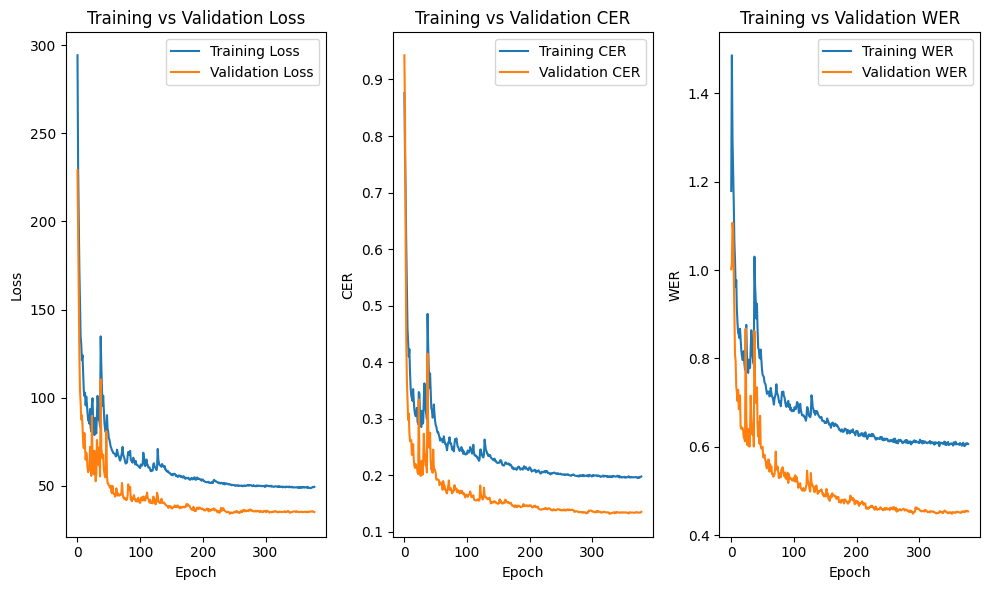

In [ ]:
# Plot training vs validation loss
plt.figure(figsize=(10, 6))

plt.subplot(1, 3, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(train_cer, label='Training CER')
plt.plot(val_cer, label='Validation CER')
plt.xlabel('Epoch')
plt.ylabel('CER')
plt.title('Training vs Validation CER')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(train_wer, label='Training WER')
plt.plot(val_wer, label='Validation WER')
plt.xlabel('Epoch')
plt.ylabel('WER')
plt.title('Training vs Validation WER')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import re

# Open the log file for reading
with open('Model/202404021423/logs.log', 'r') as f:
    lines = f.readlines()

# Initialize lists to store training and validation metrics
train_loss = []
val_loss = []
train_cer = []
val_cer = []
train_wer = []
val_wer = []

# Parse the log file and extract metrics
for line in lines:
    if 'Epoch' in line:
        match = re.search(r'Epoch (\d+); loss: (\d+\.\d+); CER: (\d+\.\d+); WER: (\d+\.\d+); val_loss: (\d+\.\d+); val_CER: (\d+\.\d+); val_WER: (\d+\.\d+)', line)
        if match:
            epoch = int(match.group(1))
            loss = float(match.group(2))
            cer = float(match.group(3))
            wer = float(match.group(4))
            val_loss_value = float(match.group(5))
            val_cer_value = float(match.group(6))
            val_wer_value = float(match.group(7))

            train_loss.append(loss)
            val_loss.append(val_loss_value)
            train_cer.append(cer)
            val_cer.append(val_cer_value)
            train_wer.append(wer)
            val_wer.append(val_wer_value)

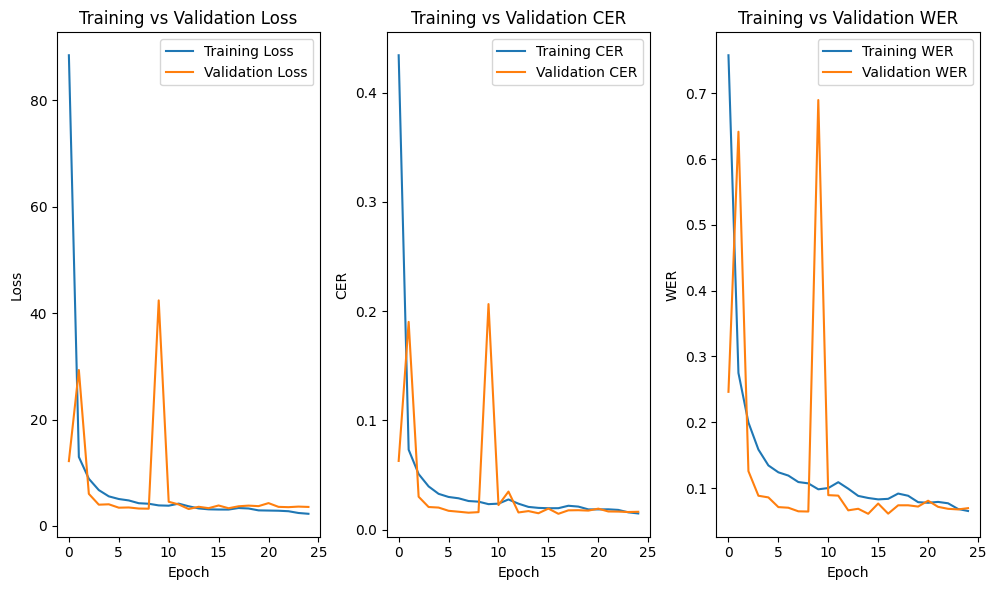

In [ ]:
# Plot training vs validation loss
plt.figure(figsize=(10, 6))

plt.subplot(1, 3, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(train_cer, label='Training CER')
plt.plot(val_cer, label='Validation CER')
plt.xlabel('Epoch')
plt.ylabel('CER')
plt.title('Training vs Validation CER')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(train_wer, label='Training WER')
plt.plot(val_wer, label='Validation WER')
plt.xlabel('Epoch')
plt.ylabel('WER')
plt.title('Training vs Validation WER')
plt.legend()

plt.tight_layout()
plt.show()
